In [1]:
library(caret)
library(corrplot)
library(biomaRt)
library(MLeval)
library(GeneAnswers) # used to get gene names from entrez IDs
library(ranger)
library(praznik)

Loading required package: lattice

Loading required package: ggplot2

corrplot 0.90 loaded

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: RCurl

Loading required package: annotate

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:igraph’:

    normalize, path, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are mask

In [2]:
set.seed(64)

# Literature Survey

[Mechanism-driven biomarkers to guide immune checkpoint blockade in cancer therapy
Topalian et al, 2016](https://www.nature.com/articles/nrc.2016.36)<br>
[The evolving landscape of biomarkers for checkpoint inhibitor immunotherapy
Havel et al, 2019](https://www.nature.com/articles/s41568-019-0116-x)

In [3]:
path <- "/home/jp/ICP_Responders/Literature Review/GenesOfInterest.csv"
genes_lit_sur <- read.csv(path)
head(genes_lit_sur)

,Gene,ID
,<chr>,<dbl>
1,PDCD1/CD279,5133
2,CD274(PDL1),29126
3,PDCD1LG2(PDL2),80380
4,CTLA4,1493
5,CD8A,925
6,CD4,920


In [4]:
# for (i in 1:49){
#     cat(getSymbols(as.character(genes_lit_sur$ID), 'org.Hs.eg.db')[[i]])
#     cat(", ")
#     }

# Pre-Processing
1) Clean data by removing rows with > 50% missing info <br>
2) Find the most informative features <br>
3) Split the data into test and train


## Load cleaned AntiPD1 data (train set)
The first column is expected to be sample ID <br>

In [5]:
# path <- "/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/GideHugoRiazAmatoLiu_AntiPD1.csv"
# GideHugoRiazAmatoLiu_AntiPD1 <- read.csv(path, check.names=FALSE, stringsAsFactors=FALSE)
# GideHugoRiazAmatoLiu_AntiPD1[GideHugoRiazAmatoLiu_AntiPD1 == "NA" ] <- NA
# dim(GideHugoRiazAmatoLiu_AntiPD1)
# head(GideHugoRiazAmatoLiu_AntiPD1)
train <- readRDS("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/GideHugoRiaz_AntiPD1_train.rds")


## Clean data

In [6]:
# # Check which column has > 50% NA values
# countNA <- function(x=NULL,cutOff=NULL){
#   output<-FALSE
#   perc<-sum(is.na(x))*100/length(x)
#   if(perc>cutOff){output<-TRUE}
#   output  
# }
# col_nas <- apply(GideHugoRiazAmatoLiu_AntiPD1,2,function(x){countNA(x, 50)})
# cat("Columns with NAs > 50% = ", sum(col_nas), "\n")
# # all columns have <50% NAs

# # Check which rows has > 50% NA values
# row_nas <- apply(GideHugoRiazAmatoLiu_AntiPD1,1,function(x){countNA(x, 50)})
# cat("Rows with NAs > 50% = ", sum(row_nas), "\n")

# # 25 rows have >50% NAs, removing them
# GideHugoRiazAmatoLiu_AntiPD1_filtered <- GideHugoRiazAmatoLiu_AntiPD1[-which(row_nas %in% TRUE),]

# cat("Dimensions of the filtered dataset = ", dim(GideHugoRiazAmatoLiu_AntiPD1_filtered))

## Division of test and training set

In [7]:
# train_pos <- createDataPartition(GideHugoRiazAmatoLiu_AntiPD1$Response, p = 0.8, list = F)
# train <- GideHugoRiazAmatoLiu_AntiPD1[train_pos, ]
# test <- GideHugoRiazAmatoLiu_AntiPD1[-train_pos, ]

# nrow(train)
# nrow(test)
# nrow(GideHugoRiazAmatoLiu_AntiPD1)

In [8]:
# saveRDS(train, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_train.rds")
# saveRDS(train_pos, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_train_pos.rds")
# saveRDS(test, 
#         "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/GideHugoRiazAmatoLiu_AntiPD1_test.rds")

## Look for near zero variance and remove those columns
Since all the expression values are log2 normalised, there is no near zero variance in genes

In [9]:
nzv <- nearZeroVar(train[, -which(colnames(train) %in% c("Patient, Response, Gender"))], saveMetrics= TRUE)
nzv[which(nzv$zeroVar %in% TRUE), ]

# All features were retained and there was no filtering due to near zero variance

freqRatio,percentUnique,zeroVar,nzv
<dbl>,<dbl>,<lgl>,<lgl>


## Remove genes with low expression across 50% samples
This was not used

In [10]:
# prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", 
#                   check.names=FALSE, stringsAsFactors=FALSE)
# prat_gene_list <- colnames(prat[,14:ncol(prat)])
# length(prat_gene_list)

In [11]:
# # fetch only the genes
# tmp <- GideHugoRiaz_AntiPD1_filtered
# tmp[, c("Patient", "OS", "OS.Event", "RECIST", "Age", "Gender","Response", "Source")] <- NULL
# # transpose and select genes with an expression above threshold x in p% of samples
# tmp <- t(tmp)
# nsmp <- ncol(tmp)
# x <- 1  # 2 counts per million = log2 = 1
# n <- 5  # minimum 5 samples
# ridx <- rowSums(tmp>x) > n
# table(ridx)
# exp_pass_genes <- rownames(tmp[ridx, ])
# exp_fail_genes <- rownames(tmp)[-which(rownames(tmp) %in% exp_pass_genes)]
# # create a subset with only passed expression genes
# remove_pos <- which(colnames(GideHugoRiaz_AntiPD1_filtered) %in% exp_fail_genes)
# GideHugoRiaz_AntiPD1_highexp <- GideHugoRiaz_AntiPD1_filtered[, -remove_pos]
# # percentage of passed genes overlapping with Prat
# length(which(prat_gene_list %in% exp_pass_genes))/length(which(prat_gene_list %in% rownames(tmp)))

## Look for correlation and remove highly correlated columns

In [12]:
exp_feat <- grep("[0-9]",colnames(train))

In [13]:
# find attributes that are highly corrected (ideally >0.75)
tmp <- train
tmp[is.na(tmp)] <- 0
expr_corr <-  cor(tmp[,c(exp_feat)]) 
highlyCorrelated <- findCorrelation(expr_corr, cutoff=0.75, names=TRUE, verbose=FALSE)
length(highlyCorrelated)
highlyCorrelated <- highlyCorrelated[highlyCorrelated %in% c(as.character(genes_lit_sur$ID)) == FALSE]   
length(highlyCorrelated)
train_AntiPD1_rmcorr <- train[, -which(colnames(train) %in% highlyCorrelated)]



[1] 2066

[1] 2050

In [14]:
saveRDS(train_AntiPD1_rmcorr, 
        "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/train_AntiPD1_rmcorr.rds")

## Linear dependencies(not used)
NOTE: Linear Dependencies were not used because
1) A large number of features from columns 157 to 400 were flagged as linearly dependent to columns 1 to 156 <br>
2) We will rely on feature importance and the robustness of the model selected to identify the most important features hence linear dependencies can become redundant

In [15]:
# cat("Started with train dimension = ", dim(train), "\n")
# cat("Post 50% NA filtering in rows and columns the dimension is", dim(GideHugoRiazAmatoLiu_AntiPD1_filtered), "\n")
cat("Post dividing the data into train and test the dimension of train is", dim(train), "\n")
cat("Post filtering highly correlated columns the dimension is", dim(train_AntiPD1_rmcorr), "\n")
# cat("Post removing linearly dependent columns the dimension is", dim(expr_rmLnCmb))

Post dividing the data into train and test the dimension of train is 74 16018 
Post filtering highly correlated columns the dimension is 74 13968 


# Feature Selection


There are 2 kinds of feature selection: automated and manual
1) Automated<br>
Automatic feature selection methods can be used to build many models with different subsets of a dataset and identify those attributes that are and are not required to build an accurate model.The algorithm is configured to explore all possible subsets of the attributes.Then it selects the optimal number of attributes and the most important attributes. The relevant functions in CARET are: rfeControl and rfe.<br>


2) Manual<br>
For classification, ROC curve analysis is conducted on each predictor. For two class problems, a series of cutoffs is applied to the predictor data to predict the class. The sensitivity and specificity are computed for each cutoff and the ROC curve is computed. The trapezoidal rule is used to compute the area under the ROC curve. This area is used as the measure of variable importance.The relevant functions in CARET are varImp.<br>
<br>

Note: [Chen et al, 2020](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-020-00327-4#Sec14) shows that manually selecting the topmost variables using the random forest varImp function is more accurate in identifying relevant features compared to automated methods.


[Darst et al, 2018](https://bmcgenomdata.biomedcentral.com/articles/10.1186/s12863-018-0633-8) suggested that although RF-RFE decreased the importance of correlated variables, in the presence of many correlated variables, it also decreased the importance of causal variables, making both hard to detect. These findings suggest that RF-RFE may not scale to high-dimensional data.

[Sanz et al, 2018](https://bmcbioinformatics.biomedcentral.com/articles/10.1186/s12859-018-2451-4#Sec3) -> SVM

In [16]:
exp_feat_rmcorr <- grep("[0-9]",colnames(train_AntiPD1_rmcorr))

mod_inp_mat <- cbind(train_AntiPD1_rmcorr$"Response", train[, c(exp_feat_rmcorr)])
colnames(mod_inp_mat)[colnames(mod_inp_mat) == "train_AntiPD1_rmcorr$Response"] <- "Response"

# input for modeling
mod_inp_mat$Response <- as.character(mod_inp_mat$Response)
mod_inp_mat[mod_inp_mat$Response == '1',"Response"] <- 'Y' 
mod_inp_mat[mod_inp_mat$Response == '0', "Response"] <- 'N' 
mod_inp_mat$Response <- as.factor(mod_inp_mat$Response)
mod_inp_mat[is.na(mod_inp_mat)] <- 0
dim(mod_inp_mat)
#  define target and feature names
col_names = colnames(mod_inp_mat)
target = "Response"
feature_names = col_names[col_names!=target]

[1]    74 13961

In [17]:
target
length(feature_names)

[1] "Response"

[1] 13960

## Automated Feature Selection

In [18]:
feature_size <- c(50, 100, 200, 400, 600, 800, 1000, 2000, 3000, 4000, 5000, 6000,
                  7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000)

### Random Forest

In [ ]:
rf.control <- rfeControl(functions=rfFuncs, method="repeatedcv", number=10, repeats=3)
system.time(a.rf <- rfe(Response~., data=mod_inp_mat, 
            sizes=feature_size, 
            rfeControl=rf.control))



In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
# list the chosen featuresplot(a.rf, type=c("g", "o"))
rf.pred <- predictors(a.rf)
# plot the results
plot(a.rf$results$Variables, a.rf$results$Accuracy, ylab="Accuracy", xlab="Variables", 
     type="b", ylim =c(0.40, 0.60), las=2)
abline(v=200, lty="dashed", col="red")
a.rf.results <- a.rf$results

In [ ]:
round(a.rf$results, 3)

## Manual Feature Selection

In [ ]:
# define a resampling approach for caret where data is divided into 10 random subsets and prediction is done on 
# 1 using the remaining 9. This approach is repeated thrice
control <- trainControl(method="repeatedcv", number=10, repeats=3)

### glmNet
A generalized linear model (GLM) is a flexible generalization of ordinary linear regression that allows for the response variable to have an error distribution other than the normal distribution. 

In [ ]:
m.glm <- train(Response~., data=mod_inp_mat, 
                  method="glmnet", 
                  trControl=control,
                  preProcess = c("scale", "center")
                 )


In [ ]:
# estimate variable importance
glm.imp <- varImp(m.glm, scale=TRUE)$importance
rownames(glm.imp) <- gsub("`", "", rownames(glm.imp))
glm.imp$Name <- rownames(glm.imp)
# summarize importance
glm.imp <- glm.imp[order(glm.imp$Overall, decreasing=TRUE),]
colnames(glm.imp) <- c("Score", "Name")
head(glm.imp)

### SVM
Support vector machines (SVMs) is a representation of different classes in a hyperplane in multidimensional space. The hyperplane is generated in an iterative manner by SVM for error minimization and divide the datasets into classes to find a maximum marginal hyperplane (MMH).<br>
This is effective in high dimensional spaces.

In [ ]:
m.svm <- train(Response~., data=mod_inp_mat, 
                  method="svmRadial", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
svm.imp <- varImp(m.svm, scale=TRUE)$importance
svm.imp$Name <- rownames(svm.imp)
# summarize importance
svm.imp <- svm.imp[order(svm.imp$N, decreasing=TRUE),]
svm.imp$N <- NULL
colnames(svm.imp) <- c("Score", "Name")
head(svm.imp)

### PCA Neural Network
The neural network is a weighted graph where nodes are the neurons, and edges with weights represent the connections. <br>
pcaNNet uses principle components to build a neural network

In [ ]:
m.nnet <- train(Response~., data=mod_inp_mat, 
                  method="pcaNNet", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
nnet.imp <- varImp(m.nnet, scale=TRUE)$importance
rownames(nnet.imp) <- gsub("`", "", rownames(nnet.imp))
nnet.imp$Name <- rownames(nnet.imp)
# summarize importance
nnet.imp <- nnet.imp[order(nnet.imp$N, decreasing=TRUE),]
nnet.imp$N <- NULL
colnames(nnet.imp) <- c("Score", "Name")
head(nnet.imp)

### Gradient Boosting Machines (GBM)
Gradient boosting is a machine learning technique for regression, classification and other tasks, which produces a prediction model in the form of an ensemble of weak prediction models, typically decision trees

In [ ]:
library(gbm)
m.gbm <- train(Response~., data=mod_inp_mat, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
gbm.imp <- varImp(m.gbm, scale=TRUE)$importance
rownames(gbm.imp) <- gsub("`", "", rownames(gbm.imp))
gbm.imp$Name <- rownames(gbm.imp)
# summarize importance
gbm.imp <- gbm.imp[order(gbm.imp$Overall, decreasing=TRUE),]
colnames(gbm.imp) <- c("Score", "Name")
head(gbm.imp)

### Partial Least Squares
Partial least squares(PLS) is a method for construct-ing predictive models when the factors are many and highly collinear. <br>
Partial least squares regression bears some relation to principal components regression; instead of finding hyperplanes of maximum variance between the response and independent variables, it finds a linear regression model by projecting the predicted variables and the observable variables to a new space

In [ ]:
m.pls <- train(Response~., data=mod_inp_mat, 
                  method="pls", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
pls.imp <- varImp(m.pls, scale=TRUE)$importance
rownames(pls.imp) <- gsub("`", "", rownames(pls.imp))
pls.imp$Name <- rownames(pls.imp)
# summarize importance
pls.imp <- pls.imp[order(pls.imp$Overall, decreasing=TRUE),]
colnames(pls.imp) <- c("Score", "Name")
head(pls.imp)

### Cforest
Cforest generates an ensemble of trees of the same form as ctree with random features selected at each node and subsampling (by default)

In [ ]:
m.cforest <- train(Response~., data=mod_inp_mat, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
cforest.imp <- varImp(m.cforest, scale=TRUE)$importance
rownames(cforest.imp) <- gsub("`", "", rownames(cforest.imp))
cforest.imp$Name <- rownames(cforest.imp)
# summarize importance
cforest.imp <- cforest.imp[order(cforest.imp$Overall, decreasing=TRUE),]
colnames(cforest.imp) <- c("Score", "Name")
head(cforest.imp)

### High Dimensional Discriminant Analysis
HDDA performs linear discriminant analysis in high dimensional problems based on reliable covariance estimators for problems with (many) more variables than observations

In [ ]:
m.hdda <- train(Response~., data=mod_inp_mat, 
                  method="hdda", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
hdda.imp <- varImp(m.hdda, scale=TRUE)$importance
rownames(hdda.imp) <- gsub("`", "", rownames(hdda.imp))
hdda.imp$Name <- rownames(hdda.imp)
# summarize importance
hdda.imp <- hdda.imp[order(hdda.imp$N, decreasing=TRUE),]
hdda.imp$N <- NULL
colnames(hdda.imp) <- c("Score", "Name")
head(hdda.imp)

### Naïve Bayes
Naïve Bayes algorithm is a supervised learning algorithm, which is based on Bayes theorem and used for solving classification problems

In [ ]:
m.nb <- train(Response~., data=mod_inp_mat, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))

In [ ]:
# estimate variable importance
nb.imp <- varImp(m.nb, scale=TRUE)$importance
rownames(nb.imp) <- gsub("`", "", rownames(nb.imp))
nb.imp$Name <- rownames(nb.imp)
# summarize importance
nb.imp <- nb.imp[order(nb.imp$N, decreasing=TRUE),]
nb.imp$N <- NULL
colnames(nb.imp) <- c("Score", "Name")
head(nb.imp)

## Rank Analysis

### Compare ranks from multiple Models

In [ ]:
# getRank adds a rank column to the input matrix according to varImp scores
getRank <- function(tmp=NULL, cname=NULL){
    tmp[,cname] <- rank(-tmp$Score)
    tmp$Score <- NULL
    tmp
}

glm.rank <- getRank(glm.imp, "glm.Rank")
svm.rank <- getRank(svm.imp, "svm.Rank")
nnet.rank <- getRank(nnet.imp, "PCAnnet.Rank")
gbm.rank <- getRank(gbm.imp, "gbm.Rank")
pls.rank <- getRank(pls.imp, "pls.Rank")
cforest.rank <- getRank(cforest.imp, "cforest.Rank")
hdda.rank <- getRank(hdda.imp, "hdda.Rank")
nb.rank <- getRank(nb.imp, "nb.Rank")

all.rank <- Reduce(function(x,y) merge(x,y, by="Name"),list(glm.rank, svm.rank, nnet.rank, gbm.rank,
                                                             pls.rank, cforest.rank, hdda.rank, nb.rank))
                   
colnames(all.rank)[1] <- "Gene_ID" 
all.rank$Gene_Name <- getSymbols(all.rank$Gene_ID, 'org.Hs.eg.db')
# all.rank is the merged matrix containing gene IDs as the first column, gene names as the last column and 
# ranks for all the models as intermediate columns                  

In [ ]:
# to find all genes over the threshold

# rank.threshold <- 250
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.250 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.250, decreasing=TRUE),]

rank.threshold <- 200
rank.clmn <- grep("Rank", colnames(all.rank))
all.rank$Threshold.200 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
all.rank <- all.rank[order(all.rank$Threshold.200, decreasing=TRUE),]

# rank.threshold <- 150
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.150 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.150, decreasing=TRUE),]

# rank.threshold <- 100
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.100 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.100, decreasing=TRUE),]

# rank.threshold <- 50
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.50 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.50, decreasing=TRUE),]

# rank.threshold <- 30
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.30 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.30, decreasing=TRUE),]

# rank.threshold <- 10
# rank.clmn <- grep("Rank", colnames(all.rank))
# all.rank$Threshold.10 <- apply(all.rank[, rank.clmn], 1, function(x){sum(x<rank.threshold)})
# all.rank <- all.rank[order(all.rank$Threshold.10, decreasing=TRUE),]

In [ ]:
ml.list <- all.rank[all.rank$Threshold.200 >=4, ]$Gene_ID
# save the list of genes which fall within Top 200 rank in at least 4 out of 8 models tested
saveRDS(ml.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ml.list.rds")

### Merge ranks using Borda voting method
NOT used since the results are very similar to manual ranking method

In [ ]:
# #merge rank using Borda method
# library(votesys)
# data <- all.rank[,2:9]
# transpose <- t(data)
# tmp <- as.matrix(transpose)
# colnames(tmp) <- all.rank$Gene_Name
# # tmp
# vote <- create_vote(tmp, xtype=1)
# res.borda <- borda_method(vote, modified = FALSE)  # Winner is with the lowest score, for modified is FALSE.
# merged.rank<-data.frame(gene=names(res.borda$other_info$count_min),
#                         rank.borda=res.borda$other_info$count_min,
#                         stringsAsFactors=F)

# merged.rank <- merged.rank[order(merged.rank$rank.borda, decreasing=FALSE),]
# head(merged.rank)

# Ranger Gene List

In [ ]:
tmp <- mod_inp_mat
colnames(tmp) <- paste0("X.", colnames(tmp))
m.rf_ranger <-   ranger(X.Response~., data=tmp, importance="permutation")

ranger.imp <- importance(m.rf_ranger)
ranger.imp200 <- names(ranger.imp[order(ranger.imp, decreasing=TRUE)][1:200])
ranger.imp200 <- gsub("X.", "", ranger.imp200)


# res_ranger <- evalm(list(inp_top200_ranger),
#              gnames=c('ranger_top200'))
# res_ranger$roc

In [ ]:
saveRDS(ranger.imp200, 
        "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/ranger.imp200.rds")

# AUC-ROC analysis

In [50]:
# Find literature curated genes in raw input data
genes_lit_rawdata <- genes_lit_sur$ID[which(genes_lit_sur$ID %in% colnames(GideHugoRiazAmatoLiu_AntiPD1_rmcorr))] 
top_genes_out <- all.rank$Gene_ID[which(genes_lit_rawdata %in% 
                                        all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])]
ctrl <- trainControl(method="repeatedcv", number=10, repeats=3, 
                     summaryFunction=twoClassSummary, classProbs=T,savePredictions = T)

In [51]:
head(mod_inp_mat)

,Response,1,503538,2,144571,144568,53947,8086,65985,51166,⋯,100037417,1653,1662,1663,84771,440081,10521,8886,55308,11269
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,N,0.0000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,⋯,0.0000000,0.00000000,0.0000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,0.0000000,0.00000000
2,N,0.4496792,-0.1256063,-0.9428421,-0.613896552,0.3001431,-0.8007014,-0.20012314,0.6050572,-1.0709579,⋯,-0.2289365,0.24957304,0.1196287,0.08966816,1.0056095,0.8320521,-0.76725125,0.06919908,-0.6063473,-0.25754156
3,N,-1.1698285,-0.6828899,-0.8272336,-0.446609752,4.9701435,1.2678120,-0.15970481,2.3022740,-0.7844277,⋯,-0.2289365,-0.03849972,-0.3336747,-0.29735939,1.2887730,-0.6881619,0.00528714,-0.47588994,-0.1354811,0.02823449
5,N,0.6757756,-0.4820313,-1.6330965,0.490900241,2.3912536,-0.7919329,-0.07076524,0.6020135,0.5151392,⋯,-0.2289365,-0.02956039,-0.2795481,0.57730409,0.1957030,0.6812827,0.01803821,-0.14768933,0.0502899,0.50373213
6,N,-0.1153501,-0.1847109,-0.4553360,0.118023126,3.3019088,-0.4543087,0.24283611,0.1082517,-0.7758829,⋯,-0.2289365,0.29390909,0.9437260,0.57541370,-1.0292203,0.6606868,0.17647628,0.04832497,0.6067201,-0.19468443
7,N,-0.1448124,1.3029584,-1.1511116,-0.005086172,2.9010415,1.1339221,0.76875725,0.9108753,0.2564553,⋯,0.3454615,-0.39071399,-0.0458588,-0.16586369,-0.1859836,-0.2544428,2.23280367,-0.39318116,0.1111554,0.19457100


In [52]:
fcbf34.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/fcbf34.list.rds")
top200var.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/top200var.list.rds")
limma85.list <- readRDS("/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/limma85.list.rds")

In [53]:
m.jmim <- JMIM(mod_inp_mat[, -which(colnames(mod_inp_mat) %in% "Response")], 
               mod_inp_mat$Response, 200)

df.jmim <- data.frame(m.jmim)[order(m.jmim$score, decreasing=TRUE),]
df.jmim
jmim.list <- (rownames(df.jmim))[1:200] 

,selection,score
,<int>,<dbl>
9590,424,0.3603917
55653,1228,0.3115357
445,985,0.2903784
107,264,0.2862093
2919,3148,0.2807187
41,969,0.2664900
10257,52,0.2653063
933,2158,0.2612596
120227,3215,0.2580740


In [54]:
prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", check.names = F)
prat.list <- colnames(prat)[14:ncol(prat)]

## glmNet

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: glm_ml.top200

Positive: 77

Negative: 87

Group: glm_fcbf34

Positive: 77

Negative: 87

Group: glm_top200var

Positive: 77

Negative: 87

Group: glm_limma85

Positive: 77

Negative: 87

Group: glm_top200_ranger

Positive: 77

Negative: 87

Group: glm_jmim

Positive: 77

Negative: 87

Group: glm_litsur

Positive: 77

Negative: 87

Group: glm_prat

Positive: 77

Negative: 87

***Performance Metrics***



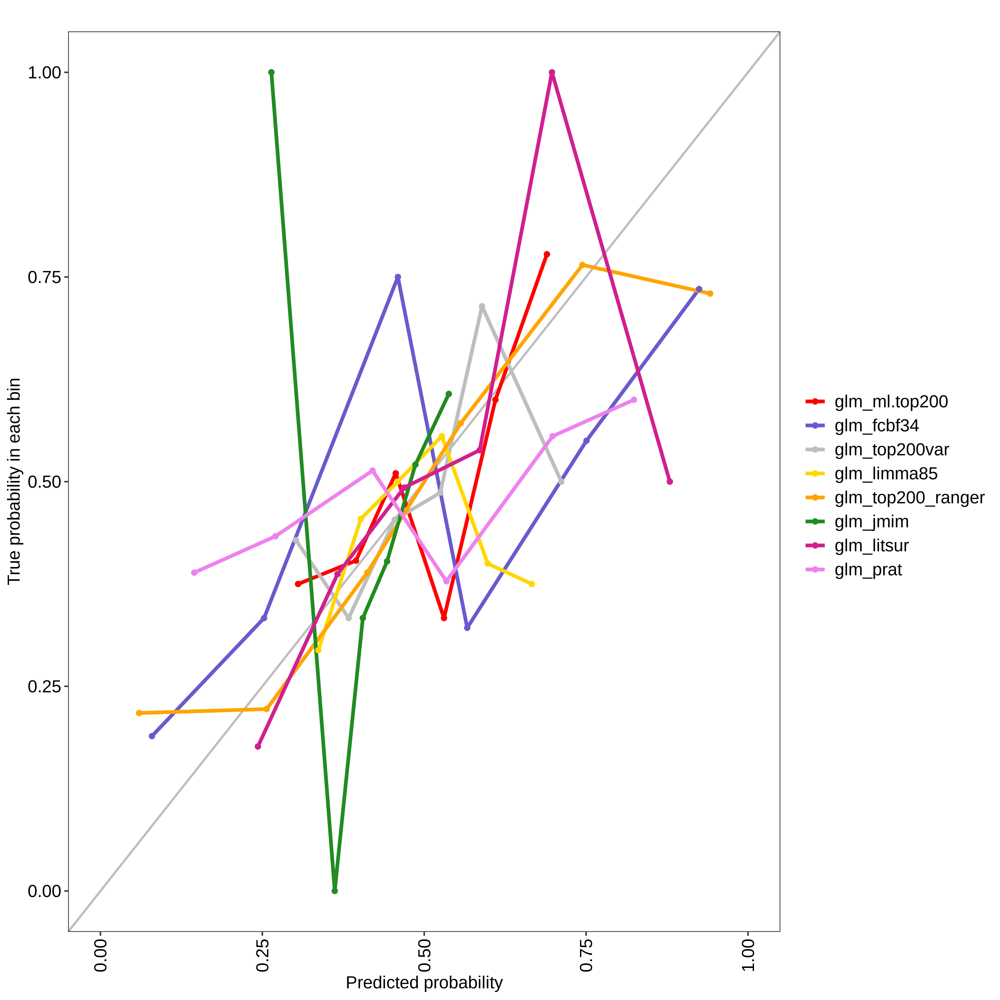

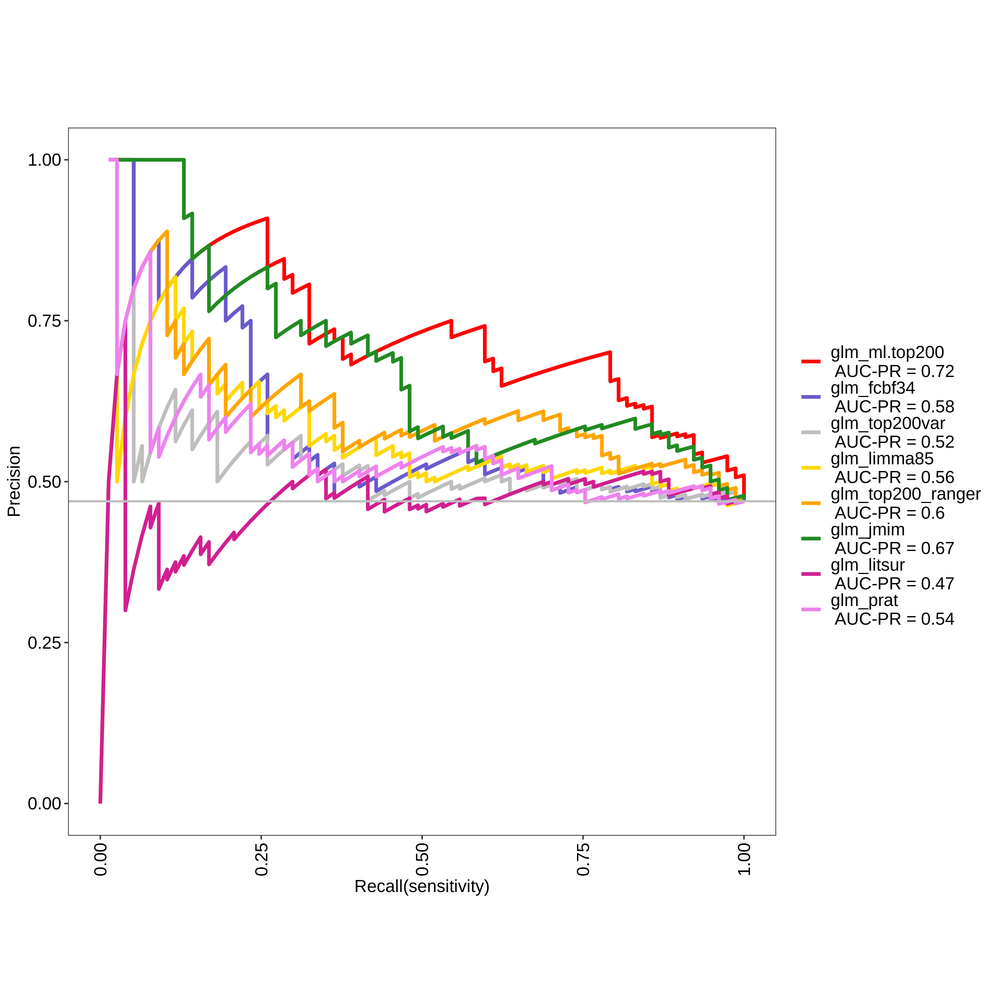

glm_ml.top200 Optimal Informedness = 0.493357217495149

glm_fcbf34 Optimal Informedness = 0.164800716524854

glm_top200var Optimal Informedness = 0.104791759964174

glm_limma85 Optimal Informedness = 0.167487684729064

glm_top200_ranger Optimal Informedness = 0.300492610837438

glm_jmim Optimal Informedness = 0.336915957605613

glm_litsur Optimal Informedness = 0.145991939095387

glm_prat Optimal Informedness = 0.172115241080758

glm_ml.top200 AUC-ROC = 0.77

glm_fcbf34 AUC-ROC = 0.57

glm_top200var AUC-ROC = 0.55

glm_limma85 AUC-ROC = 0.6

glm_top200_ranger AUC-ROC = 0.66

glm_jmim AUC-ROC = 0.69

glm_litsur AUC-ROC = 0.52

glm_prat AUC-ROC = 0.57



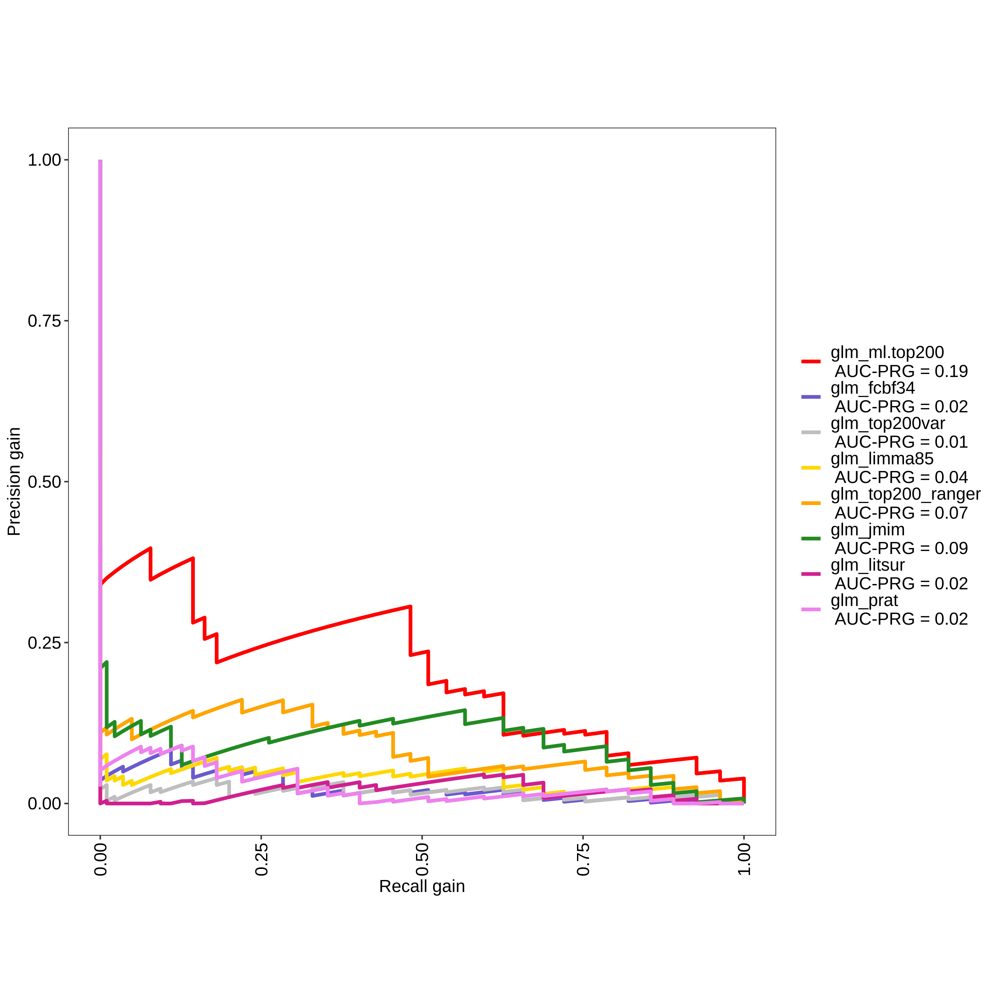

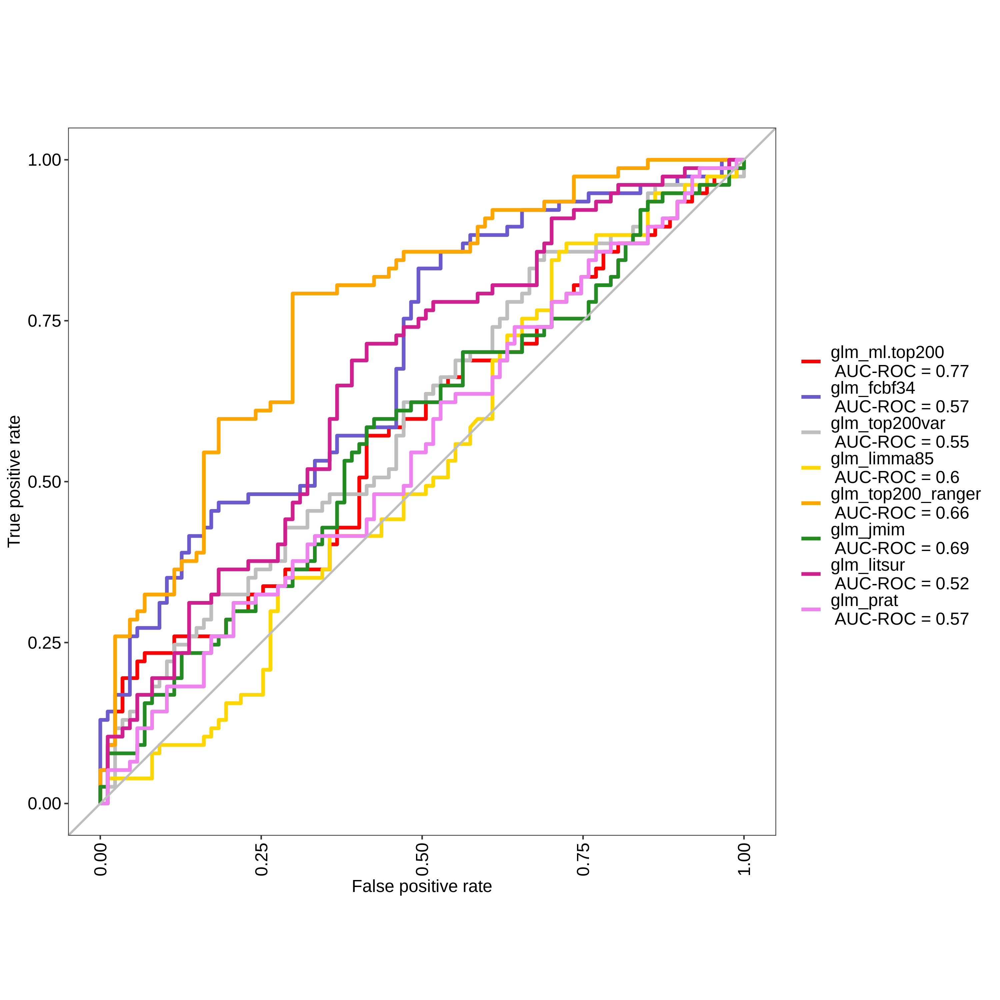

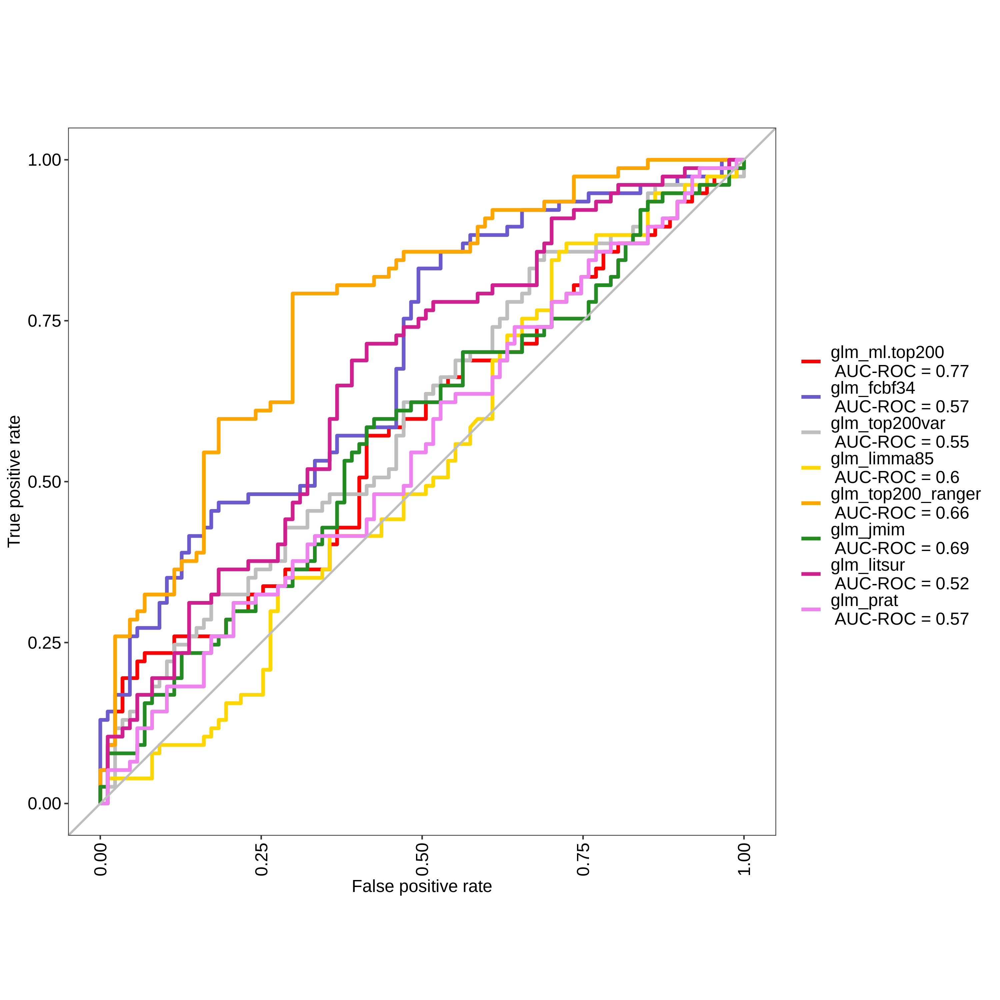

In [55]:
inp_top200_glm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_top200_ranger_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_glm <- evalm(list(inp_top200_glm, inp_fcbf34_glm, inp_top200var_glm, inp_limma85_glm, inp_top200_ranger_glm, inp_jmim_glm, inp_litsur_glm, inp_prat_glm),
             gnames=c('glm_ml.top200', 'glm_fcbf34', 'glm_top200var', 'glm_limma85', 'glm_top200_ranger', 'glm_jmim', 'glm_litsur', 'glm_prat'))
res_glm$roc

## SVM

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: svm_ml.top200

Positive: 77

Negative: 87

Group: svm_fcbf34

Positive: 77

Negative: 87

Group: svm_top200var

Positive: 77

Negative: 87

Group: svm_limma85

Positive: 77

Negative: 87

Group: svm_top200_ranger

Positive: 77

Negative: 87

Group: svm_jmim

Positive: 77

Negative: 87

Group: svm_litsur

Positive: 77

Negative: 87

Group: svm_prat

Positive: 77

Negative: 87

***Performance Metrics***



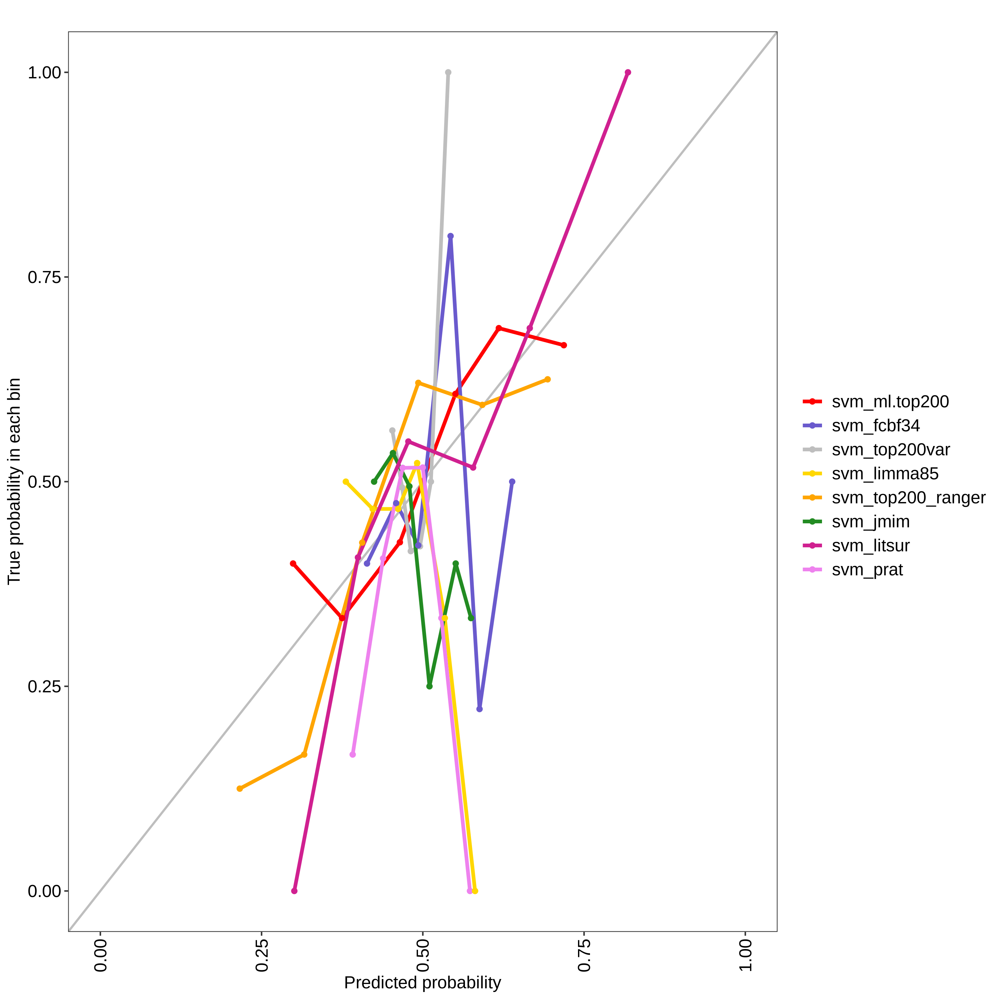

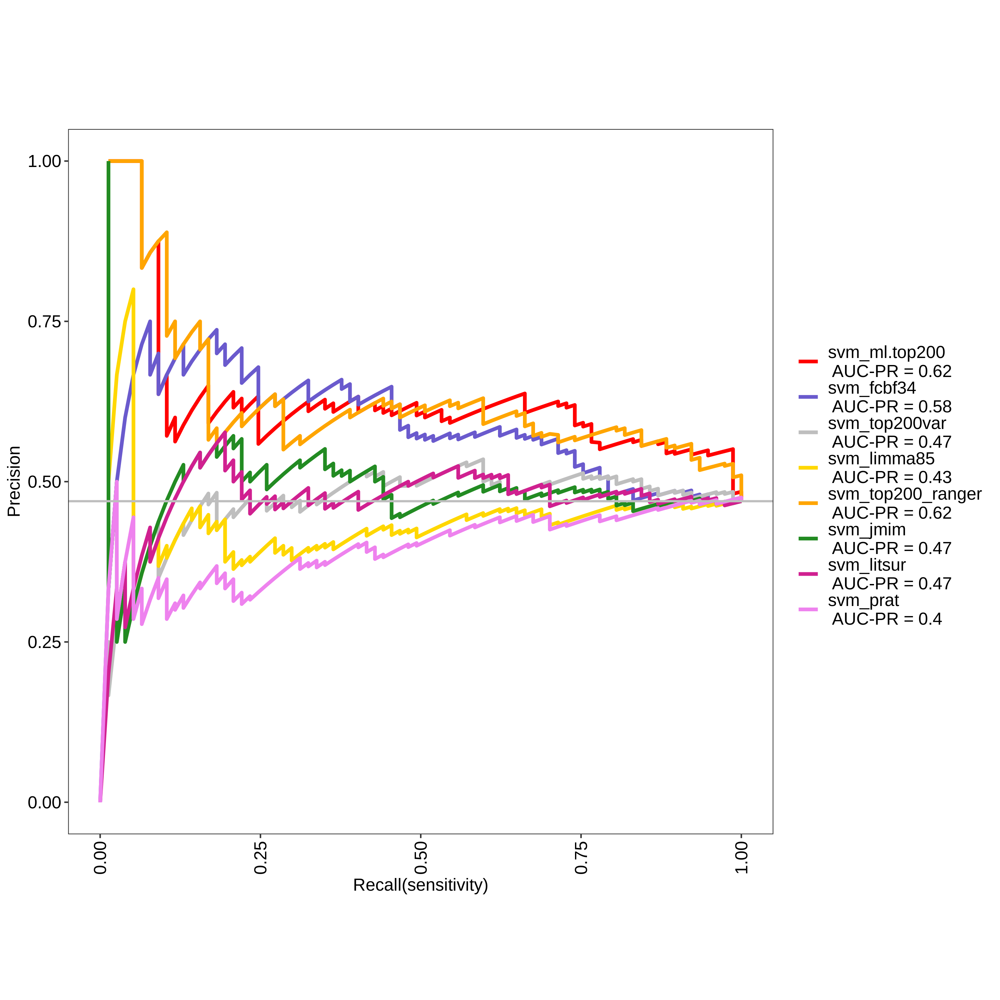

svm_ml.top200 Optimal Informedness = 0.337960889685028

svm_fcbf34 Optimal Informedness = 0.236154649947753

svm_top200var Optimal Informedness = 0.137632482460069

svm_limma85 Optimal Informedness = 0.0404537990744886

svm_top200_ranger Optimal Informedness = 0.303925959098373

svm_jmim Optimal Informedness = 0.0977757874309599

svm_litsur Optimal Informedness = 0.110165696372593

svm_prat Optimal Informedness = 0.0229885057471264

svm_ml.top200 AUC-ROC = 0.69

svm_fcbf34 AUC-ROC = 0.62

svm_top200var AUC-ROC = 0.54

svm_limma85 AUC-ROC = 0.44

svm_top200_ranger AUC-ROC = 0.68

svm_jmim AUC-ROC = 0.52

svm_litsur AUC-ROC = 0.52

svm_prat AUC-ROC = 0.4



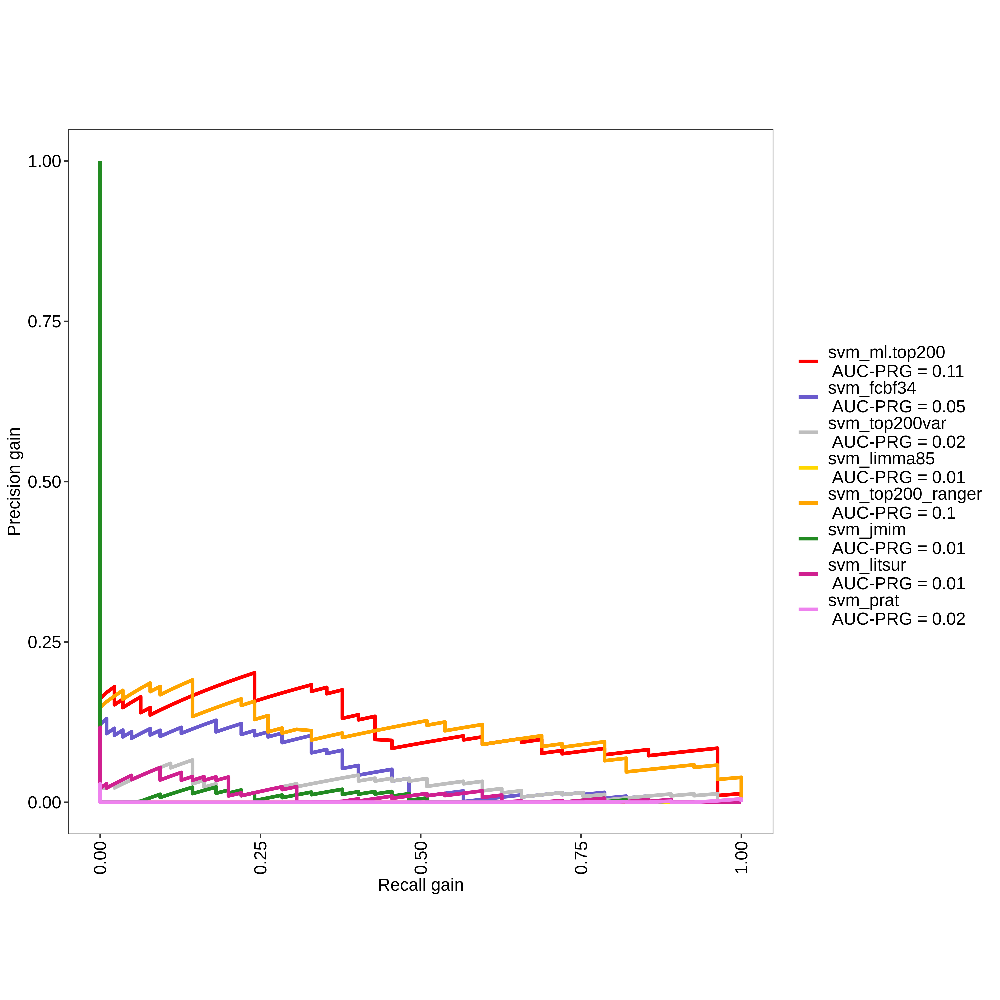

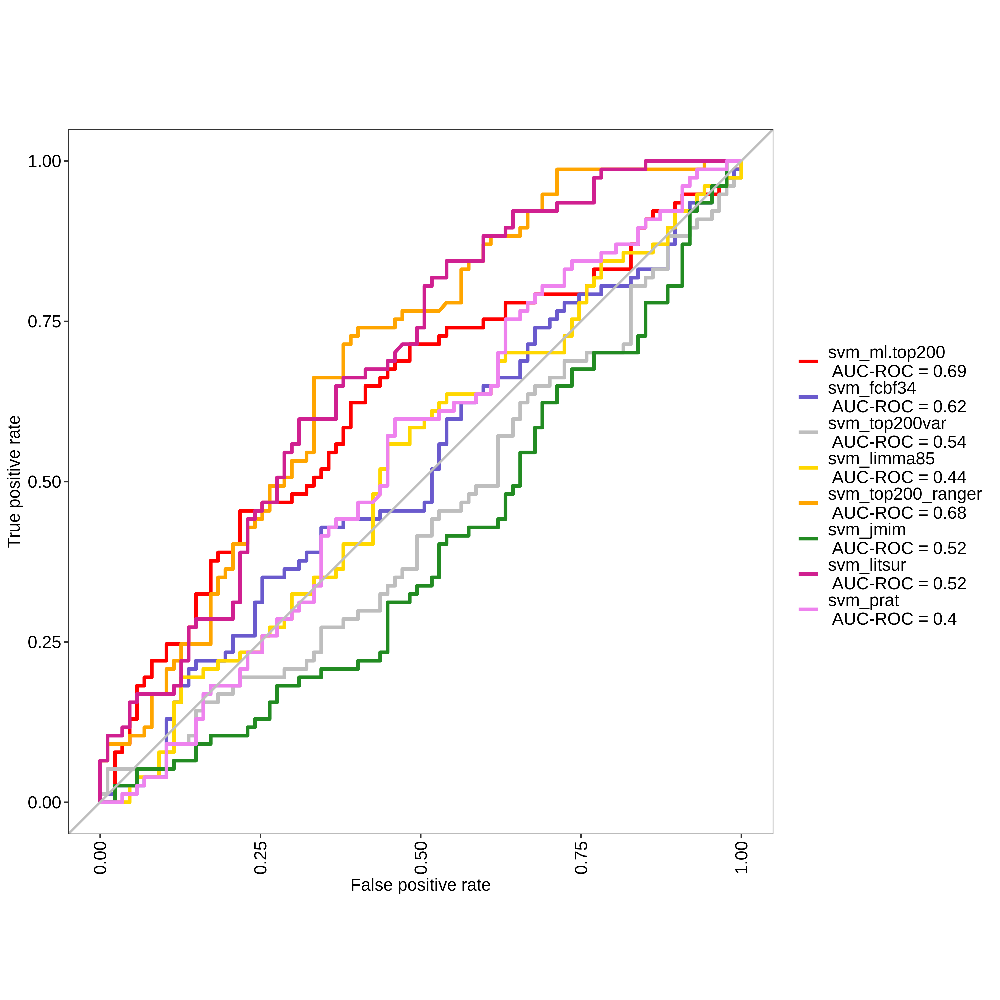

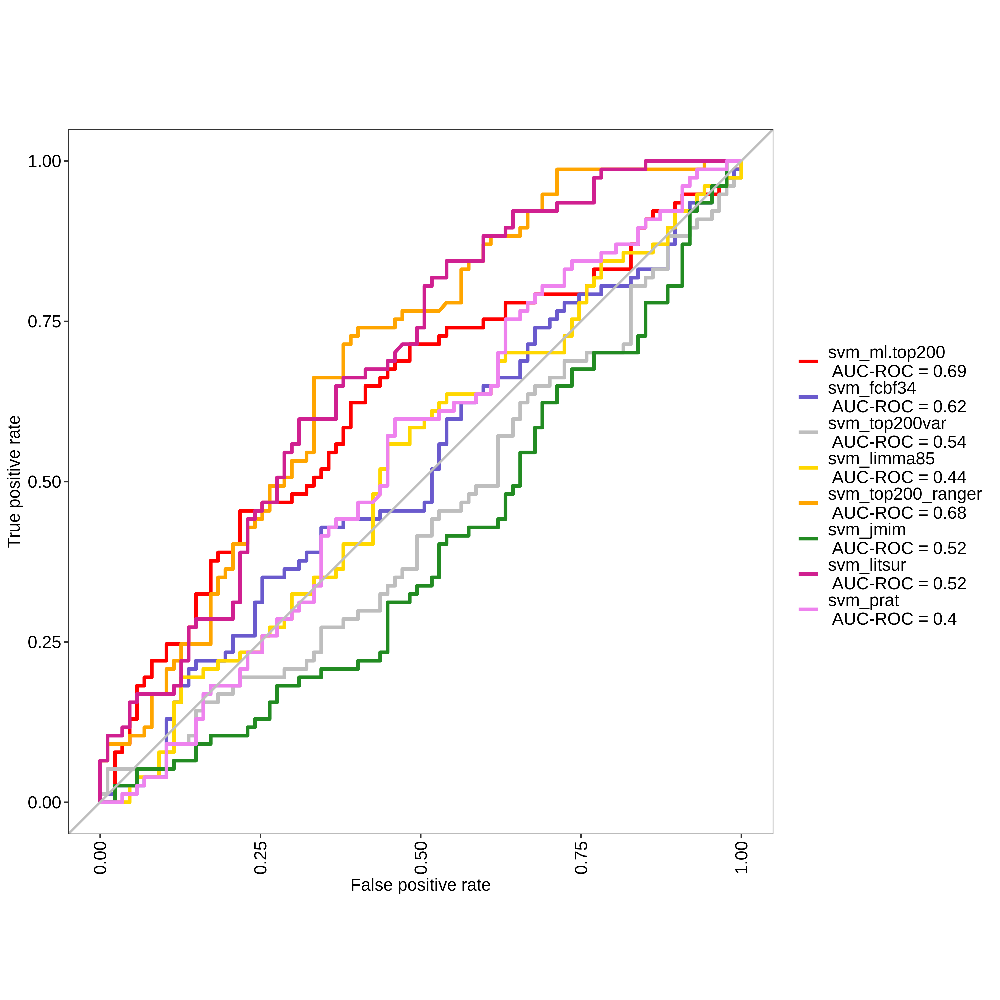

In [56]:
inp_top200_svm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_prat_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
res_svm <- evalm(list(inp_top200_svm, inp_fcbf34_svm, inp_top200var_svm, inp_limma85_svm, inp_top200_ranger_svm, inp_jmim_svm, inp_litsur_svm, inp_prat_svm),
             gnames=c('svm_ml.top200', 'svm_fcbf34', 'svm_top200var', 'svm_limma85', 'svm_top200_ranger', 'svm_jmim', 'svm_litsur', 'svm_prat'))
res_svm$roc

## PCA Neural Network

# weights:  94
initial  value 73.258338 
iter  10 value 51.010803
iter  20 value 40.775788
iter  30 value 36.671076
iter  40 value 35.100772
iter  50 value 31.631774
iter  60 value 29.851774
iter  70 value 27.872552
iter  80 value 26.091577
iter  90 value 26.076505
iter 100 value 25.728484
final  value 25.728484 
stopped after 100 iterations
# weights:  278
initial  value 78.224216 
iter  10 value 38.326751
iter  20 value 29.025359
iter  30 value 26.720580
iter  40 value 24.857870
iter  50 value 23.134334
iter  60 value 22.555257
iter  70 value 22.269293
iter  80 value 18.665765
iter  90 value 17.998219
iter 100 value 17.773763
final  value 17.773763 
stopped after 100 iterations
# weights:  462
initial  value 76.463174 
iter  10 value 36.964465
iter  20 value 22.805326
iter  30 value 16.665782
iter  40 value 15.044852
iter  50 value 14.946700
iter  60 value 14.106971
iter  70 value 13.462290
iter  80 value 13.382236
iter  90 value 13.377555
iter 100 value 13.372585
final  value 13.372

initial  value 84.965989 
iter  10 value 56.383733
iter  20 value 42.926223
iter  30 value 38.863484
iter  40 value 31.728177
iter  50 value 28.534622
iter  60 value 28.003776
iter  70 value 26.640020
iter  80 value 26.160256
iter  90 value 25.323533
iter 100 value 25.230033
final  value 25.230033 
stopped after 100 iterations
# weights:  462
initial  value 86.890968 
iter  10 value 43.055326
iter  20 value 24.238685
iter  30 value 19.103155
iter  40 value 18.452794
iter  50 value 18.436554
iter  60 value 18.421913
iter  70 value 18.399128
iter  80 value 18.383578
iter  90 value 16.387348
iter 100 value 16.378769
final  value 16.378769 
stopped after 100 iterations
# weights:  95
initial  value 77.229055 
iter  10 value 57.133089
iter  20 value 46.883494
iter  30 value 44.272738
iter  40 value 39.297645
iter  50 value 37.873653
iter  60 value 37.464308
iter  70 value 37.382319
iter  80 value 37.209424
iter  90 value 36.421730
iter 100 value 36.421606
final  value 36.421606 
stopped aft

initial  value 100.674342 
iter  10 value 48.457824
iter  20 value 30.859252
iter  30 value 20.996187
iter  40 value 17.616094
iter  50 value 16.620833
iter  60 value 16.508530
iter  70 value 16.449641
iter  80 value 16.411830
iter  90 value 16.379849
iter 100 value 16.376796
final  value 16.376796 
stopped after 100 iterations
# weights:  93
initial  value 81.923697 
iter  10 value 69.376890
iter  20 value 44.968951
iter  30 value 44.626358
iter  40 value 43.491723
iter  50 value 42.642073
iter  60 value 41.089853
iter  70 value 41.068178
iter  80 value 39.811630
iter  90 value 39.789974
iter 100 value 38.616411
final  value 38.616411 
stopped after 100 iterations
# weights:  275
initial  value 79.039622 
iter  10 value 45.739357
iter  20 value 33.956579
iter  30 value 32.105978
iter  40 value 32.031321
iter  50 value 31.986889
iter  60 value 31.696633
iter  70 value 31.303750
iter  80 value 28.611286
iter  90 value 28.584444
iter 100 value 26.999839
final  value 26.999839 
stopped af

initial  value 76.025129 
iter  10 value 69.825924
iter  20 value 44.545356
iter  30 value 29.157132
iter  40 value 23.207004
iter  50 value 20.766642
iter  60 value 19.143292
iter  70 value 18.956695
iter  80 value 18.952842
iter  90 value 18.952561
final  value 18.952555 
converged
# weights:  278
initial  value 80.255801 
iter  10 value 51.702929
iter  20 value 30.677230
iter  30 value 24.884738
iter  40 value 21.796152
iter  50 value 18.600163
iter  60 value 16.466886
iter  70 value 16.222364
iter  80 value 16.176633
iter  90 value 16.129363
iter 100 value 16.114541
final  value 16.114541 
stopped after 100 iterations
# weights:  462
initial  value 99.186802 
iter  10 value 56.060323
iter  20 value 29.871678
iter  30 value 19.913386
iter  40 value 17.503417
iter  50 value 16.236224
iter  60 value 15.892463
iter  70 value 15.801304
iter  80 value 15.662082
iter  90 value 15.498233
iter 100 value 15.421180
final  value 15.421180 
stopped after 100 iterations
# weights:  94
initial  v

initial  value 78.527863 
iter  10 value 48.721693
iter  20 value 29.264707
iter  30 value 28.000934
iter  40 value 27.643838
iter  50 value 27.438729
iter  60 value 24.353505
iter  70 value 24.159065
iter  80 value 24.150431
iter  90 value 24.126674
iter 100 value 24.051386
final  value 24.051386 
stopped after 100 iterations
# weights:  462
initial  value 76.666929 
iter  10 value 41.565673
iter  20 value 31.562414
iter  30 value 22.889844
iter  40 value 20.025537
iter  50 value 17.813811
iter  60 value 16.225690
iter  70 value 14.959281
iter  80 value 13.624186
iter  90 value 13.238120
iter 100 value 13.152444
final  value 13.152444 
stopped after 100 iterations
# weights:  94
initial  value 79.640312 
iter  10 value 55.359805
iter  20 value 32.777803
iter  30 value 26.092213
iter  40 value 23.580724
iter  50 value 23.498086
iter  60 value 22.498273
iter  70 value 22.326285
iter  80 value 22.325099
final  value 22.325092 
converged
# weights:  278
initial  value 77.854922 
iter  10 

initial  value 74.864482 
iter  10 value 44.709513
iter  20 value 25.230267
iter  30 value 20.214916
iter  40 value 18.521716
iter  50 value 18.336215
iter  60 value 18.198714
iter  70 value 18.069630
iter  80 value 17.792505
iter  90 value 17.512627
iter 100 value 16.376804
final  value 16.376804 
stopped after 100 iterations
# weights:  95
initial  value 76.511688 
iter  10 value 50.923279
iter  20 value 39.045688
iter  30 value 31.010266
iter  40 value 30.738317
iter  50 value 30.723940
iter  60 value 30.721839
iter  70 value 29.125699
iter  80 value 29.005615
iter  90 value 29.005015
final  value 29.004690 
converged
# weights:  281
initial  value 81.518977 
iter  10 value 49.139340
iter  20 value 31.794878
iter  30 value 24.074496
iter  40 value 23.194926
iter  50 value 21.802268
iter  60 value 21.608839
iter  70 value 21.418782
iter  80 value 19.588733
iter  90 value 16.449522
iter 100 value 14.688223
final  value 14.688223 
stopped after 100 iterations
# weights:  467
initial  v

initial  value 78.881944 
iter  10 value 34.748351
iter  20 value 25.815088
iter  30 value 21.484230
iter  40 value 19.601828
iter  50 value 19.404979
iter  60 value 17.535953
iter  70 value 17.526476
iter  80 value 15.669477
iter  90 value 15.662296
iter 100 value 15.661165
final  value 15.661165 
stopped after 100 iterations
# weights:  278
initial  value 90.434621 
iter  10 value 46.530144
iter  20 value 36.104133
iter  30 value 31.257275
iter  40 value 26.832195
iter  50 value 25.506575
iter  60 value 23.827702
iter  70 value 22.545249
iter  80 value 21.438576
iter  90 value 19.687960
iter 100 value 19.315108
final  value 19.315108 
stopped after 100 iterations
# weights:  462
initial  value 81.409091 
iter  10 value 41.314132
iter  20 value 20.591207
iter  30 value 17.453343
iter  40 value 15.615342
iter  50 value 14.562031
iter  60 value 14.474489
iter  70 value 13.883568
iter  80 value 12.998082
iter  90 value 9.881703
iter 100 value 9.233264
final  value 9.233264 
stopped after

initial  value 97.740117 
iter  10 value 49.044215
iter  20 value 27.546082
iter  30 value 19.460074
iter  40 value 18.221349
iter  50 value 17.854409
iter  60 value 17.307735
iter  70 value 16.951554
iter  80 value 16.881685
iter  90 value 16.805214
iter 100 value 16.799670
final  value 16.799670 
stopped after 100 iterations
# weights:  467
initial  value 83.272668 
iter  10 value 53.068191
iter  20 value 25.726872
iter  30 value 18.273884
iter  40 value 16.302936
iter  50 value 15.594506
iter  60 value 15.365822
iter  70 value 15.272432
iter  80 value 15.172616
iter  90 value 15.149862
iter 100 value 15.147613
final  value 15.147613 
stopped after 100 iterations
# weights:  95
initial  value 78.176264 
iter  10 value 53.498411
iter  20 value 50.722828
iter  30 value 47.179835
iter  40 value 45.889750
iter  50 value 44.511146
iter  60 value 42.679184
iter  70 value 42.411462
iter  80 value 40.083607
iter  90 value 38.014712
iter 100 value 37.192479
final  value 37.192479 
stopped aft

initial  value 80.984897 
iter  10 value 45.445610
iter  20 value 33.010668
iter  30 value 26.745001
iter  40 value 23.195849
iter  50 value 21.360529
iter  60 value 19.442893
iter  70 value 17.647703
iter  80 value 17.498315
iter  90 value 17.472838
iter 100 value 17.417704
final  value 17.417704 
stopped after 100 iterations
# weights:  95
initial  value 80.276830 
iter  10 value 45.515392
iter  20 value 31.938311
iter  30 value 25.451189
iter  40 value 21.328135
iter  50 value 20.627642
iter  60 value 20.617723
final  value 20.617684 
converged
# weights:  281
initial  value 90.143933 
iter  10 value 51.046155
iter  20 value 29.696392
iter  30 value 19.931393
iter  40 value 17.537971
iter  50 value 17.075473
iter  60 value 16.885149
iter  70 value 16.807404
iter  80 value 16.784589
iter  90 value 16.782689
iter 100 value 16.782487
final  value 16.782487 
stopped after 100 iterations
# weights:  467
initial  value 91.858633 
iter  10 value 58.057362
iter  20 value 32.444149
iter  30 

initial  value 82.185844 
iter  10 value 73.343506
iter  20 value 72.970948
iter  30 value 50.322807
iter  40 value 36.272595
iter  50 value 33.163899
iter  60 value 32.884759
iter  70 value 31.500153
iter  80 value 29.763313
iter  90 value 29.760159
iter 100 value 29.758574
final  value 29.758574 
stopped after 100 iterations
# weights:  275
initial  value 83.869509 
iter  10 value 60.127071
iter  20 value 53.792108
iter  30 value 43.383063
iter  40 value 41.503610
iter  50 value 38.563424
iter  60 value 36.403837
iter  70 value 36.227239
iter  80 value 36.197572
iter  90 value 33.974073
iter 100 value 33.753742
final  value 33.753742 
stopped after 100 iterations
# weights:  457
initial  value 78.911607 
iter  10 value 41.509787
iter  20 value 25.638952
iter  30 value 21.317643
iter  40 value 20.287180
iter  50 value 17.516011
iter  60 value 16.288369
iter  70 value 16.243605
iter  80 value 15.178391
iter  90 value 13.676347
iter 100 value 12.939432
final  value 12.939432 
stopped af

initial  value 75.656302 
iter  10 value 30.167171
iter  20 value 16.963185
iter  30 value 12.221872
iter  40 value 11.918257
iter  50 value 11.872750
iter  60 value 11.838642
iter  70 value 10.791307
iter  80 value 10.346789
iter  90 value 10.328713
iter 100 value 10.325051
final  value 10.325051 
stopped after 100 iterations
# weights:  457
initial  value 88.499892 
iter  10 value 34.373778
iter  20 value 21.722270
iter  30 value 17.608843
iter  40 value 15.809432
iter  50 value 13.863845
iter  60 value 12.339569
iter  70 value 11.231422
iter  80 value 10.466475
iter  90 value 10.358034
iter 100 value 10.351172
final  value 10.351172 
stopped after 100 iterations
# weights:  93
initial  value 74.870875 
iter  10 value 59.842044
iter  20 value 46.090693
iter  30 value 38.427550
iter  40 value 30.247439
iter  50 value 28.377815
iter  60 value 27.978160
iter  70 value 25.358769
iter  80 value 25.264477
iter  90 value 25.255737
iter 100 value 25.253137
final  value 25.253137 
stopped aft

initial  value 85.450469 
iter  10 value 66.131408
iter  20 value 65.037675
iter  30 value 64.978375
iter  40 value 64.965954
iter  50 value 64.956728
iter  60 value 64.956160
iter  70 value 64.956135
final  value 64.956129 
converged
# weights:  9
initial  value 74.812651 
iter  10 value 62.892901
iter  20 value 60.860674
iter  30 value 60.747833
iter  40 value 60.095370
iter  50 value 59.207938
iter  60 value 59.185631
final  value 59.183634 
converged
# weights:  23
initial  value 76.894830 
iter  10 value 61.859268
iter  20 value 59.262218
iter  30 value 53.548305
iter  40 value 51.382227
iter  50 value 51.147963
iter  60 value 50.928092
iter  70 value 50.697115
iter  80 value 50.150951
iter  90 value 50.065896
iter 100 value 50.059690
final  value 50.059690 
stopped after 100 iterations
# weights:  37
initial  value 94.354084 
iter  10 value 61.233481
iter  20 value 53.213414
iter  30 value 48.774738
iter  40 value 47.840372
iter  50 value 47.380847
iter  60 value 47.169515
iter  

initial  value 76.510360 
iter  10 value 68.943202
iter  20 value 64.275327
iter  30 value 63.501954
iter  40 value 62.620738
iter  50 value 62.061358
iter  60 value 60.616227
iter  70 value 60.550390
iter  80 value 60.533236
iter  90 value 60.527660
iter 100 value 60.521587
final  value 60.521587 
stopped after 100 iterations
# weights:  23
initial  value 73.598116 
iter  10 value 64.070881
iter  20 value 54.246152
iter  30 value 52.393338
iter  40 value 51.732559
iter  50 value 48.810713
iter  60 value 47.647044
iter  70 value 46.655521
iter  80 value 46.640149
iter  90 value 46.639775
iter 100 value 46.639517
final  value 46.639517 
stopped after 100 iterations
# weights:  37
initial  value 84.895172 
iter  10 value 64.391994
iter  20 value 50.692663
iter  30 value 42.345335
iter  40 value 39.843166
iter  50 value 37.983423
iter  60 value 36.963976
iter  70 value 36.593324
iter  80 value 36.069002
iter  90 value 35.557525
iter 100 value 35.011382
final  value 35.011382 
stopped afte

initial  value 82.963601 
iter  10 value 63.844761
iter  20 value 51.861111
iter  30 value 46.797838
iter  40 value 43.105062
iter  50 value 38.221995
iter  60 value 36.950665
iter  70 value 36.674527
iter  80 value 36.662510
iter  90 value 36.654912
iter 100 value 36.625433
final  value 36.625433 
stopped after 100 iterations
# weights:  9
initial  value 77.998859 
iter  10 value 69.632773
iter  20 value 67.712928
final  value 67.712827 
converged
# weights:  23
initial  value 76.179118 
iter  10 value 68.918863
iter  20 value 66.902264
iter  30 value 66.494432
iter  40 value 66.490598
final  value 66.490487 
converged
# weights:  37
initial  value 84.615232 
iter  10 value 69.026893
iter  20 value 67.173594
iter  30 value 66.359207
iter  40 value 66.054189
iter  50 value 65.998598
iter  60 value 65.992337
iter  70 value 65.992158
final  value 65.992152 
converged
# weights:  9
initial  value 74.547728 
iter  10 value 66.092442
iter  20 value 63.743780
iter  30 value 62.991965
iter  4

initial  value 77.502994 
iter  10 value 63.449404
iter  20 value 61.173076
iter  30 value 61.065457
iter  40 value 60.467062
iter  50 value 60.291192
iter  60 value 60.282665
iter  70 value 60.275215
iter  80 value 60.227932
iter  90 value 60.222154
final  value 60.220582 
converged
# weights:  23
initial  value 78.471007 
iter  10 value 66.582401
iter  20 value 58.927340
iter  30 value 54.803188
iter  40 value 53.154309
iter  50 value 52.762137
iter  60 value 52.720697
iter  70 value 52.548140
iter  80 value 52.384551
iter  90 value 52.371733
iter 100 value 52.367090
final  value 52.367090 
stopped after 100 iterations
# weights:  37
initial  value 77.248900 
iter  10 value 63.223950
iter  20 value 52.117755
iter  30 value 47.092928
iter  40 value 46.547822
iter  50 value 46.243323
iter  60 value 46.193918
iter  70 value 46.072211
iter  80 value 46.024521
iter  90 value 45.984135
iter 100 value 45.965792
final  value 45.965792 
stopped after 100 iterations
# weights:  9
initial  valu

initial  value 81.613572 
iter  10 value 70.475596
iter  20 value 67.537955
iter  30 value 67.208916
iter  40 value 66.882650
iter  50 value 66.769705
iter  60 value 65.379369
iter  70 value 65.377207
iter  80 value 65.376116
iter  90 value 65.375390
iter 100 value 65.375105
final  value 65.375105 
stopped after 100 iterations
# weights:  23
initial  value 80.430274 
iter  10 value 65.162246
iter  20 value 57.568291
iter  30 value 50.494740
iter  40 value 48.968512
iter  50 value 48.821005
iter  60 value 48.559203
iter  70 value 48.356125
iter  80 value 48.230198
iter  90 value 48.174584
iter 100 value 48.168410
final  value 48.168410 
stopped after 100 iterations
# weights:  37
initial  value 76.165192 
iter  10 value 65.991254
iter  20 value 50.835459
iter  30 value 43.706673
iter  40 value 38.539351
iter  50 value 35.486399
iter  60 value 34.557916
iter  70 value 34.261871
iter  80 value 34.177031
iter  90 value 34.164949
iter 100 value 34.161508
final  value 34.161508 
stopped afte

initial  value 74.136375 
iter  10 value 65.145219
iter  20 value 65.027491
iter  30 value 65.022843
iter  40 value 64.996339
iter  50 value 64.924486
iter  60 value 64.912041
final  value 64.912038 
converged
# weights:  37
initial  value 77.777142 
iter  10 value 65.524959
iter  20 value 64.983461
iter  30 value 64.904380
iter  40 value 64.901981
iter  50 value 64.898945
iter  60 value 64.898863
iter  60 value 64.898862
iter  60 value 64.898862
final  value 64.898862 
converged
# weights:  9
initial  value 75.425700 
iter  10 value 63.842739
iter  20 value 61.477945
iter  30 value 61.192260
iter  40 value 60.958114
iter  50 value 60.648395
iter  60 value 60.153896
iter  70 value 60.018308
iter  80 value 60.001494
iter  90 value 59.945209
iter 100 value 59.918726
final  value 59.918726 
stopped after 100 iterations
# weights:  23
initial  value 76.076933 
iter  10 value 60.852424
iter  20 value 56.676065
iter  30 value 52.497243
iter  40 value 51.709524
iter  50 value 51.540906
iter  

initial  value 82.345442 
iter  10 value 64.802961
iter  20 value 61.157834
iter  30 value 60.851833
iter  40 value 60.070906
iter  50 value 60.054750
iter  60 value 60.051399
iter  70 value 60.051022
iter  80 value 60.050320
iter  90 value 60.050249
final  value 60.050248 
converged
# weights:  23
initial  value 78.336881 
iter  10 value 61.041329
iter  20 value 56.715429
iter  30 value 55.120402
iter  40 value 54.620374
iter  50 value 54.588555
iter  60 value 54.550335
iter  70 value 54.486531
iter  80 value 54.406521
iter  90 value 54.230030
iter 100 value 54.130021
final  value 54.130021 
stopped after 100 iterations
# weights:  37
initial  value 78.502822 
iter  10 value 63.506101
iter  20 value 57.451355
iter  30 value 48.060282
iter  40 value 45.056165
iter  50 value 44.552738
iter  60 value 44.386630
iter  70 value 43.942485
iter  80 value 43.751656
iter  90 value 43.634114
iter 100 value 43.449014
final  value 43.449014 
stopped after 100 iterations
# weights:  9
initial  valu

initial  value 78.975761 
iter  10 value 62.867294
iter  20 value 57.673789
iter  30 value 55.389268
iter  40 value 52.927397
iter  50 value 52.877783
iter  60 value 52.857156
iter  70 value 52.592551
iter  80 value 52.444642
iter  90 value 52.440716
iter 100 value 52.439346
final  value 52.439346 
stopped after 100 iterations
# weights:  37
initial  value 75.385216 
iter  10 value 64.880260
iter  20 value 56.766183
iter  30 value 50.608646
iter  40 value 45.769846
iter  50 value 44.110771
iter  60 value 42.741500
iter  70 value 42.519795
iter  80 value 42.423043
iter  90 value 42.364240
iter 100 value 42.223206
final  value 42.223206 
stopped after 100 iterations
# weights:  9
initial  value 83.258135 
iter  10 value 69.223217
iter  20 value 66.904431
final  value 66.903504 
converged
# weights:  23
initial  value 77.581189 
iter  10 value 66.543955
iter  20 value 65.805679
iter  30 value 65.680308
iter  40 value 65.676164
final  value 65.676160 
converged
# weights:  37
initial  valu

initial  value 76.587662 
iter  10 value 67.446326
final  value 67.203495 
converged
# weights:  23
initial  value 83.546946 
iter  10 value 70.287813
iter  20 value 66.367295
iter  30 value 65.724306
iter  40 value 65.434176
iter  50 value 65.314976
iter  60 value 65.313439
iter  60 value 65.313438
iter  60 value 65.313438
final  value 65.313438 
converged
# weights:  37
initial  value 75.740819 
iter  10 value 67.437938
iter  20 value 65.696470
iter  30 value 65.319372
iter  40 value 65.281666
iter  50 value 65.279575
iter  60 value 65.279322
iter  70 value 65.278927
iter  80 value 65.278819
final  value 65.278813 
converged
# weights:  9
initial  value 78.350385 
iter  10 value 68.163138
iter  20 value 63.776684
iter  30 value 62.289357
iter  40 value 61.656953
iter  50 value 61.323997
iter  60 value 61.304824
iter  70 value 61.303600
iter  80 value 61.303216
iter  90 value 61.302226
iter 100 value 61.300617
final  value 61.300617 
stopped after 100 iterations
# weights:  23
initial

initial  value 91.685959 
iter  10 value 56.479793
iter  20 value 43.149264
iter  30 value 36.914096
iter  40 value 32.785969
iter  50 value 31.573405
iter  60 value 30.734938
iter  70 value 30.670459
iter  80 value 30.663184
iter  90 value 30.528407
iter 100 value 30.257789
final  value 30.257789 
stopped after 100 iterations
# weights:  242
initial  value 92.362526 
iter  10 value 51.190277
iter  20 value 34.611961
iter  30 value 28.697084
iter  40 value 27.892158
iter  50 value 27.497241
iter  60 value 27.369734
iter  70 value 27.272469
iter  80 value 27.262086
iter  90 value 27.252436
iter 100 value 27.203493
final  value 27.203493 
stopped after 100 iterations
# weights:  50
initial  value 76.325328 
iter  10 value 56.269348
iter  20 value 46.240879
iter  30 value 38.912775
iter  40 value 34.538326
iter  50 value 33.008490
iter  60 value 32.982805
iter  70 value 32.978233
iter  80 value 32.976028
iter  90 value 32.974442
iter 100 value 32.973324
final  value 32.973324 
stopped aft

initial  value 76.908549 
iter  10 value 59.979463
iter  20 value 47.727242
iter  30 value 46.813871
iter  40 value 46.795332
final  value 46.795285 
converged
# weights:  146
initial  value 79.738469 
iter  10 value 60.668977
iter  20 value 43.733077
iter  30 value 36.235874
iter  40 value 31.162179
iter  50 value 30.518625
iter  60 value 30.353711
iter  70 value 30.328832
iter  80 value 30.326650
iter  90 value 30.326574
final  value 30.326569 
converged
# weights:  242
initial  value 88.261763 
iter  10 value 59.779973
iter  20 value 40.372299
iter  30 value 32.315588
iter  40 value 29.335556
iter  50 value 28.627009
iter  60 value 28.143553
iter  70 value 27.643397
iter  80 value 27.400138
iter  90 value 27.364214
iter 100 value 27.361180
final  value 27.361180 
stopped after 100 iterations
# weights:  50
initial  value 74.441932 
iter  10 value 54.406297
iter  20 value 39.743541
iter  30 value 36.220494
iter  40 value 35.770949
iter  50 value 35.651911
iter  60 value 35.639109
ite

initial  value 88.527240 
iter  10 value 48.965727
iter  20 value 26.398040
iter  30 value 22.560216
iter  40 value 22.028603
iter  50 value 21.922624
iter  60 value 21.895985
iter  70 value 21.892212
iter  80 value 21.890352
iter  90 value 21.889578
iter 100 value 21.889077
final  value 21.889077 
stopped after 100 iterations
# weights:  50
initial  value 79.463703 
iter  10 value 59.159512
iter  20 value 49.330660
iter  30 value 47.070580
iter  40 value 47.041478
final  value 47.041310 
converged
# weights:  146
initial  value 86.819316 
iter  10 value 58.780104
iter  20 value 47.002276
iter  30 value 37.134020
iter  40 value 33.281720
iter  50 value 32.841726
iter  60 value 32.380380
iter  70 value 31.325375
iter  80 value 31.139074
iter  90 value 31.038465
iter 100 value 31.009891
final  value 31.009891 
stopped after 100 iterations
# weights:  242
initial  value 84.812226 
iter  10 value 58.640380
iter  20 value 40.768395
iter  30 value 32.571116
iter  40 value 29.657837
iter  50 

initial  value 80.907534 
iter  10 value 47.138934
iter  20 value 33.962651
iter  30 value 32.085818
iter  40 value 29.415754
iter  50 value 29.298835
iter  60 value 29.204848
iter  70 value 28.746125
iter  80 value 28.216653
iter  90 value 28.165203
iter 100 value 28.151152
final  value 28.151152 
stopped after 100 iterations
# weights:  242
initial  value 73.340046 
iter  10 value 40.981844
iter  20 value 16.327675
iter  30 value 12.366884
iter  40 value 12.238234
iter  50 value 12.235610
iter  60 value 12.235542
iter  70 value 12.235310
iter  80 value 12.235298
iter  80 value 12.235298
iter  80 value 12.235297
final  value 12.235297 
converged
# weights:  50
initial  value 75.032634 
iter  10 value 61.842626
iter  20 value 52.588538
iter  30 value 50.384807
iter  40 value 50.084673
iter  50 value 50.056439
iter  60 value 48.737435
iter  70 value 47.766191
iter  80 value 47.714635
iter  90 value 47.714149
final  value 47.714148 
converged
# weights:  146
initial  value 79.558895 
ite

initial  value 84.945794 
iter  10 value 30.695737
iter  20 value 17.827006
iter  30 value 14.294820
iter  40 value 14.210622
iter  50 value 14.140827
iter  60 value 14.103558
iter  70 value 14.085181
iter  80 value 14.053078
iter  90 value 13.975004
iter 100 value 13.252270
final  value 13.252270 
stopped after 100 iterations
# weights:  50
initial  value 79.576881 
iter  10 value 59.736071
iter  20 value 46.860070
iter  30 value 45.245174
iter  40 value 43.150102
iter  50 value 40.481534
iter  60 value 39.087563
iter  70 value 39.018377
iter  80 value 38.997355
iter  90 value 38.978539
iter 100 value 38.971045
final  value 38.971045 
stopped after 100 iterations
# weights:  146
initial  value 79.143803 
iter  10 value 50.825543
iter  20 value 32.511194
iter  30 value 28.079701
iter  40 value 26.940215
iter  50 value 25.748346
iter  60 value 25.453539
iter  70 value 25.393418
iter  80 value 25.386993
iter  90 value 25.379591
iter 100 value 25.367765
final  value 25.367765 
stopped aft

initial  value 79.639505 
iter  10 value 55.143522
iter  20 value 38.725604
iter  30 value 32.121784
iter  40 value 30.182291
iter  50 value 28.664545
iter  60 value 27.466388
iter  70 value 27.358765
iter  80 value 25.872640
iter  90 value 25.595289
iter 100 value 25.065302
final  value 25.065302 
stopped after 100 iterations
# weights:  242
initial  value 79.817614 
iter  10 value 40.856147
iter  20 value 20.885035
iter  30 value 20.308511
iter  40 value 19.433433
iter  50 value 19.023551
iter  60 value 18.775210
iter  70 value 18.015761
iter  80 value 16.179936
iter  90 value 13.999441
iter 100 value 11.798665
final  value 11.798665 
stopped after 100 iterations
# weights:  50
initial  value 79.936662 
iter  10 value 50.681594
iter  20 value 45.101679
iter  30 value 44.893069
iter  40 value 43.627051
iter  50 value 43.618296
iter  60 value 43.617923
iter  70 value 43.617668
final  value 43.617647 
converged
# weights:  146
initial  value 78.721806 
iter  10 value 50.263549
iter  20 

initial  value 76.005551 
iter  10 value 54.277447
iter  20 value 38.823269
iter  30 value 34.094131
iter  40 value 33.870420
iter  50 value 33.756769
iter  60 value 32.292296
iter  70 value 31.758701
iter  80 value 30.448115
iter  90 value 30.137388
iter 100 value 28.447921
final  value 28.447921 
stopped after 100 iterations
# weights:  146
initial  value 77.693564 
iter  10 value 59.431015
iter  20 value 45.454017
iter  30 value 34.500167
iter  40 value 32.157808
iter  50 value 31.253176
iter  60 value 30.445938
iter  70 value 29.852109
iter  80 value 27.058307
iter  90 value 26.348818
iter 100 value 25.808545
final  value 25.808545 
stopped after 100 iterations
# weights:  242
initial  value 77.409985 
iter  10 value 49.134965
iter  20 value 19.869647
iter  30 value 17.260601
iter  40 value 17.139285
iter  50 value 15.731181
iter  60 value 15.609820
iter  70 value 15.580572
iter  80 value 15.554987
iter  90 value 15.514734
iter 100 value 15.483188
final  value 15.483188 
stopped af

initial  value 84.880325 
iter  10 value 59.316487
iter  20 value 41.720537
iter  30 value 35.540837
iter  40 value 32.536223
iter  50 value 31.623501
iter  60 value 31.252077
iter  70 value 31.065983
iter  80 value 30.957608
iter  90 value 30.932586
iter 100 value 30.860577
final  value 30.860577 
stopped after 100 iterations
# weights:  50
initial  value 76.926497 
iter  10 value 60.135301
iter  20 value 48.550612
iter  30 value 38.775800
iter  40 value 38.042671
iter  50 value 38.014816
iter  60 value 37.611813
iter  70 value 36.598575
iter  80 value 36.576352
iter  90 value 36.565031
iter 100 value 36.559417
final  value 36.559417 
stopped after 100 iterations
# weights:  146
initial  value 79.502313 
iter  10 value 55.046557
iter  20 value 32.037634
iter  30 value 25.351079
iter  40 value 22.692347
iter  50 value 21.409150
iter  60 value 20.217490
iter  70 value 19.377541
iter  80 value 19.343432
iter  90 value 19.066913
iter 100 value 19.033183
final  value 19.033183 
stopped aft

initial  value 91.101439 
iter  10 value 56.080406
iter  20 value 43.141087
iter  30 value 39.465831
iter  40 value 38.064479
iter  50 value 37.416515
iter  60 value 36.731919
iter  70 value 35.247549
iter  80 value 34.156704
iter  90 value 33.739498
iter 100 value 33.678260
final  value 33.678260 
stopped after 100 iterations
# weights:  242
initial  value 82.159270 
iter  10 value 59.060042
iter  20 value 44.522928
iter  30 value 33.909363
iter  40 value 31.096744
iter  50 value 29.798702
iter  60 value 29.227749
iter  70 value 28.927374
iter  80 value 28.811861
iter  90 value 28.785338
iter 100 value 28.742350
final  value 28.742350 
stopped after 100 iterations
# weights:  50
initial  value 78.649434 
iter  10 value 53.820706
iter  20 value 45.303446
iter  30 value 43.746292
iter  40 value 43.620091
iter  50 value 42.261197
iter  60 value 42.243188
iter  70 value 42.236687
iter  80 value 42.233864
iter  90 value 42.233099
iter 100 value 42.232591
final  value 42.232591 
stopped aft

initial  value 78.766343 
iter  10 value 43.800681
iter  20 value 33.119343
iter  30 value 28.762789
iter  40 value 25.939962
iter  50 value 25.826219
iter  60 value 25.769737
iter  70 value 24.897197
iter  80 value 24.226497
iter  90 value 24.206951
iter 100 value 24.193335
final  value 24.193335 
stopped after 100 iterations
# weights:  50
initial  value 79.255624 
iter  10 value 60.596424
iter  20 value 45.712558
iter  30 value 42.637735
iter  40 value 42.505957
iter  50 value 42.503700
final  value 42.503658 
converged
# weights:  146
initial  value 77.153563 
iter  10 value 51.703382
iter  20 value 39.006004
iter  30 value 36.933857
iter  40 value 32.692237
iter  50 value 30.774230
iter  60 value 30.480621
iter  70 value 30.325560
iter  80 value 30.191586
iter  90 value 30.167942
iter 100 value 30.070286
final  value 30.070286 
stopped after 100 iterations
# weights:  242
initial  value 83.421296 
iter  10 value 54.190733
iter  20 value 38.348226
iter  30 value 32.852768
iter  40 

initial  value 76.206733 
iter  10 value 39.363850
iter  20 value 14.074024
iter  30 value 12.534199
iter  40 value 12.518713
iter  50 value 12.491158
iter  60 value 12.481709
iter  70 value 12.468219
iter  80 value 12.458495
iter  90 value 12.448568
iter 100 value 12.441554
final  value 12.441554 
stopped after 100 iterations
# weights:  242
initial  value 82.209862 
iter  10 value 43.023641
iter  20 value 32.726146
iter  30 value 30.833834
iter  40 value 28.257412
iter  50 value 27.093495
iter  60 value 26.621007
iter  70 value 26.539699
iter  80 value 26.458346
iter  90 value 26.386692
iter 100 value 24.452386
final  value 24.452386 
stopped after 100 iterations
# weights:  50
initial  value 76.281738 
iter  10 value 56.641290
iter  20 value 48.839920
iter  30 value 44.581131
iter  40 value 44.430767
iter  50 value 44.117528
iter  60 value 44.002231
iter  70 value 44.001079
final  value 44.001062 
converged
# weights:  146
initial  value 75.052835 
iter  10 value 51.060817
iter  20 

initial  value 81.665892 
iter  10 value 66.305382
iter  20 value 42.701207
iter  30 value 25.373379
iter  40 value 19.549092
iter  50 value 19.158401
iter  60 value 19.084829
iter  70 value 19.061802
iter  80 value 19.056158
iter  90 value 18.565266
iter 100 value 18.332950
final  value 18.332950 
stopped after 100 iterations
# weights:  567
initial  value 83.591397 
iter  10 value 61.774224
iter  20 value 51.707091
iter  30 value 43.815030
iter  40 value 39.680402
iter  50 value 34.878302
iter  60 value 33.861170
iter  70 value 33.308327
iter  80 value 33.204946
iter  90 value 33.083210
iter 100 value 32.763706
final  value 32.763706 
stopped after 100 iterations
# weights:  117
initial  value 75.464557 
iter  10 value 71.365513
iter  20 value 70.860839
iter  30 value 70.514412
iter  40 value 68.937748
iter  50 value 55.833814
iter  60 value 55.332989
iter  70 value 55.331383
final  value 55.331367 
converged
# weights:  347
initial  value 82.063703 
iter  10 value 68.793827
iter  20

initial  value 93.129946 
iter  10 value 68.631247
iter  20 value 50.003301
iter  30 value 38.127611
iter  40 value 30.951912
iter  50 value 21.226781
iter  60 value 16.501786
iter  70 value 15.038830
iter  80 value 13.937333
iter  90 value 13.278363
iter 100 value 12.736317
final  value 12.736317 
stopped after 100 iterations
# weights:  117
initial  value 77.735152 
iter  10 value 65.999426
iter  20 value 51.754138
iter  30 value 46.749116
iter  40 value 42.976944
iter  50 value 42.399727
iter  60 value 42.391609
iter  70 value 39.627298
iter  80 value 36.978708
iter  90 value 35.408769
iter 100 value 35.325953
final  value 35.325953 
stopped after 100 iterations
# weights:  347
initial  value 77.863511 
iter  10 value 71.799241
iter  20 value 56.161704
iter  30 value 39.986956
iter  40 value 39.154418
iter  50 value 38.802301
iter  60 value 38.774576
iter  70 value 37.962364
iter  80 value 37.934229
iter  90 value 36.810383
iter 100 value 36.615817
final  value 36.615817 
stopped af

initial  value 85.219216 
iter  10 value 55.659217
iter  20 value 34.777068
iter  30 value 30.972477
iter  40 value 29.493721
iter  50 value 28.202296
iter  60 value 27.203633
iter  70 value 26.089553
iter  80 value 24.945128
iter  90 value 24.855898
iter 100 value 24.722159
final  value 24.722159 
stopped after 100 iterations
# weights:  117
initial  value 80.778713 
iter  10 value 71.537925
iter  20 value 59.930628
iter  30 value 54.243627
iter  40 value 50.197580
iter  50 value 43.733725
iter  60 value 39.574429
iter  70 value 35.875619
iter  80 value 34.587238
iter  90 value 31.607335
iter 100 value 29.165352
final  value 29.165352 
stopped after 100 iterations
# weights:  347
initial  value 90.240595 
iter  10 value 71.964446
iter  20 value 46.147258
iter  30 value 20.553284
iter  40 value 18.481316
iter  50 value 17.199224
iter  60 value 16.400515
iter  70 value 15.825432
iter  80 value 14.797802
iter  90 value 13.952596
iter 100 value 13.880798
final  value 13.880798 
stopped af

initial  value 75.523660 
iter  10 value 72.657894
iter  20 value 71.499971
iter  30 value 70.922457
iter  40 value 65.509888
iter  50 value 55.027471
iter  60 value 48.958115
iter  70 value 47.343020
iter  80 value 46.201803
iter  90 value 46.176425
final  value 46.176390 
converged
# weights:  350
initial  value 80.329799 
iter  10 value 63.702671
iter  20 value 54.604304
iter  30 value 48.771645
iter  40 value 41.770123
iter  50 value 36.402362
iter  60 value 32.272724
iter  70 value 31.691406
iter  80 value 30.761529
iter  90 value 29.563992
iter 100 value 27.060727
final  value 27.060727 
stopped after 100 iterations
# weights:  582
initial  value 82.716217 
iter  10 value 57.090831
iter  20 value 38.797442
iter  30 value 34.104552
iter  40 value 33.749193
iter  50 value 32.468154
iter  60 value 32.358669
iter  70 value 29.968191
iter  80 value 27.836222
iter  90 value 27.695083
iter 100 value 26.081040
final  value 26.081040 
stopped after 100 iterations
# weights:  118
initial  

initial  value 81.616454 
iter  10 value 66.909172
iter  20 value 58.251421
iter  30 value 54.733462
iter  40 value 46.032731
iter  50 value 39.663192
iter  60 value 35.707552
iter  70 value 33.146388
iter  80 value 33.026567
iter  90 value 32.963698
iter 100 value 32.121828
final  value 32.121828 
stopped after 100 iterations
# weights:  567
initial  value 79.791679 
iter  10 value 63.816112
iter  20 value 50.118047
iter  30 value 42.311984
iter  40 value 34.298464
iter  50 value 33.297807
iter  60 value 29.060553
iter  70 value 26.874067
iter  80 value 25.724276
iter  90 value 23.607091
iter 100 value 22.595021
final  value 22.595021 
stopped after 100 iterations
# weights:  117
initial  value 78.367070 
iter  10 value 67.793216
iter  20 value 59.276535
iter  30 value 48.660715
iter  40 value 41.963254
iter  50 value 41.770767
iter  60 value 40.480024
iter  70 value 40.351830
iter  80 value 39.277944
iter  90 value 38.929058
iter 100 value 37.468027
final  value 37.468027 
stopped af

initial  value 99.204788 
iter  10 value 63.439632
iter  20 value 42.186063
iter  30 value 33.345421
iter  40 value 22.132582
iter  50 value 19.692068
iter  60 value 17.508786
iter  70 value 15.549174
iter  80 value 14.330830
iter  90 value 13.635176
iter 100 value 13.394252
final  value 13.394252 
stopped after 100 iterations
# weights:  116
initial  value 75.260474 
iter  10 value 60.485959
iter  20 value 53.631005
iter  30 value 53.124360
iter  40 value 51.634383
iter  50 value 51.622398
final  value 51.621555 
converged
# weights:  344
initial  value 85.797915 
iter  10 value 68.619523
iter  20 value 55.741511
iter  30 value 48.935964
iter  40 value 46.946447
iter  50 value 42.264378
iter  60 value 38.896956
iter  70 value 37.172301
iter  80 value 37.039803
iter  90 value 37.035108
iter 100 value 35.553767
final  value 35.553767 
stopped after 100 iterations
# weights:  572
initial  value 79.977128 
iter  10 value 69.727264
iter  20 value 56.758732
iter  30 value 52.781529
iter  40

initial  value 83.856228 
iter  10 value 71.951368
iter  20 value 52.940834
iter  30 value 45.474518
iter  40 value 39.079110
iter  50 value 32.287186
iter  60 value 27.653028
iter  70 value 25.559239
iter  80 value 23.849533
iter  90 value 23.252808
iter 100 value 22.104775
final  value 22.104775 
stopped after 100 iterations
# weights:  347
initial  value 93.563497 
iter  10 value 65.019339
iter  20 value 49.786768
iter  30 value 39.219251
iter  40 value 33.688768
iter  50 value 27.724979
iter  60 value 24.764756
iter  70 value 22.346258
iter  80 value 21.609525
iter  90 value 18.509450
iter 100 value 16.440463
final  value 16.440463 
stopped after 100 iterations
# weights:  577
initial  value 84.271152 
iter  10 value 66.126366
iter  20 value 49.434029
iter  30 value 34.956896
iter  40 value 24.940335
iter  50 value 20.141965
iter  60 value 16.146434
iter  70 value 14.324912
iter  80 value 13.597501
iter  90 value 13.379405
iter 100 value 13.032167
final  value 13.032167 
stopped af

initial  value 86.486331 
iter  10 value 56.713209
iter  20 value 51.073791
iter  30 value 44.742155
iter  40 value 42.914576
iter  50 value 40.356330
iter  60 value 39.605754
iter  70 value 37.774166
iter  80 value 36.102305
iter  90 value 36.089626
iter 100 value 32.886642
final  value 32.886642 
stopped after 100 iterations
# weights:  577
initial  value 97.880804 
iter  10 value 56.526994
iter  20 value 38.790547
iter  30 value 29.560845
iter  40 value 25.752221
iter  50 value 23.188400
iter  60 value 23.050073
iter  70 value 20.212781
iter  80 value 17.902259
iter  90 value 16.563782
iter 100 value 15.839403
final  value 15.839403 
stopped after 100 iterations
# weights:  117
initial  value 76.429085 
iter  10 value 73.068392
iter  20 value 51.816558
iter  30 value 47.156967
iter  40 value 40.097000
iter  50 value 34.549960
iter  60 value 30.609117
iter  70 value 27.785137
iter  80 value 25.775470
iter  90 value 24.345533
iter 100 value 22.169255
final  value 22.169255 
stopped af

initial  value 78.143042 
iter  10 value 58.253521
iter  20 value 48.276045
iter  30 value 44.966139
iter  40 value 40.383569
iter  50 value 37.863188
iter  60 value 36.942068
iter  70 value 36.820300
iter  80 value 36.817083
iter  90 value 36.808308
iter 100 value 35.763725
final  value 35.763725 
stopped after 100 iterations
# weights:  119
initial  value 77.983912 
iter  10 value 73.593512
final  value 73.589745 
converged
# weights:  353
initial  value 82.611911 
iter  10 value 63.747765
iter  20 value 40.754808
iter  30 value 37.882266
iter  40 value 35.400095
iter  50 value 32.981663
iter  60 value 32.610607
iter  70 value 31.226633
iter  80 value 31.151737
iter  90 value 31.149760
iter 100 value 31.149701
final  value 31.149701 
stopped after 100 iterations
# weights:  587
initial  value 80.463714 
iter  10 value 56.387575
iter  20 value 50.727377
iter  30 value 46.725311
iter  40 value 45.922425
iter  50 value 45.457298
iter  60 value 43.547174
iter  70 value 42.937033
iter  80

initial  value 76.136872 
iter  10 value 66.285854
iter  20 value 51.976153
iter  30 value 47.579893
iter  40 value 46.362210
iter  50 value 46.356145
iter  60 value 46.351911
iter  70 value 46.348967
iter  80 value 45.400046
iter  90 value 42.101798
iter 100 value 42.010783
final  value 42.010783 
stopped after 100 iterations
# weights:  347
initial  value 88.285829 
iter  10 value 69.372903
iter  20 value 45.318203
iter  30 value 41.057266
iter  40 value 39.205645
iter  50 value 38.529298
iter  60 value 36.680074
iter  70 value 32.241186
iter  80 value 30.439619
iter  90 value 30.352307
iter 100 value 30.349138
final  value 30.349138 
stopped after 100 iterations
# weights:  577
initial  value 87.253623 
iter  10 value 66.866734
iter  20 value 57.766300
iter  30 value 54.494139
iter  40 value 50.537507
iter  50 value 44.244464
iter  60 value 40.380764
iter  70 value 39.506714
iter  80 value 39.214913
iter  90 value 38.512723
iter 100 value 37.983258
final  value 37.983258 
stopped af

initial  value 87.638981 
iter  10 value 69.435668
iter  20 value 47.117465
iter  30 value 33.777065
iter  40 value 24.110558
iter  50 value 18.186332
iter  60 value 16.097823
iter  70 value 15.175538
iter  80 value 13.847835
iter  90 value 13.286738
iter 100 value 12.904762
final  value 12.904762 
stopped after 100 iterations
# weights:  118
initial  value 77.683858 
iter  10 value 73.403945
iter  20 value 69.138504
iter  30 value 63.679227
iter  40 value 62.885737
iter  50 value 60.930510
iter  60 value 49.890499
iter  70 value 43.237116
iter  80 value 40.868966
iter  90 value 39.039448
iter 100 value 38.992295
final  value 38.992295 
stopped after 100 iterations
# weights:  350
initial  value 80.893055 
iter  10 value 66.456656
iter  20 value 59.238853
iter  30 value 58.835598
iter  40 value 55.154692
iter  50 value 54.208064
iter  60 value 53.100833
iter  70 value 52.126506
iter  80 value 51.357872
iter  90 value 50.184574
iter 100 value 49.255649
final  value 49.255649 
stopped af

initial  value 76.101791 
iter  10 value 42.604645
iter  20 value 27.428244
iter  30 value 25.243340
iter  40 value 24.793749
iter  50 value 24.303938
iter  60 value 23.265363
iter  70 value 22.480628
iter  80 value 22.452846
iter  90 value 21.994529
iter 100 value 21.842027
final  value 21.842027 
stopped after 100 iterations
# weights:  85
initial  value 76.494610 
iter  10 value 60.628104
iter  20 value 42.576501
iter  30 value 37.314451
iter  40 value 33.403955
iter  50 value 31.254880
iter  60 value 30.436625
iter  70 value 29.238788
iter  80 value 29.155695
iter  90 value 29.154819
final  value 29.154804 
converged
# weights:  251
initial  value 82.833248 
iter  10 value 63.827559
iter  20 value 44.831121
iter  30 value 33.229286
iter  40 value 28.439682
iter  50 value 25.632885
iter  60 value 24.332778
iter  70 value 22.910920
iter  80 value 22.182471
iter  90 value 21.914136
iter 100 value 21.600974
final  value 21.600974 
stopped after 100 iterations
# weights:  417
initial  v

initial  value 73.583087 
iter  10 value 47.302442
iter  20 value 40.399202
iter  30 value 37.007968
iter  40 value 31.276325
iter  50 value 28.250747
iter  60 value 24.540793
iter  70 value 24.305654
iter  80 value 24.156678
iter  90 value 24.123681
iter 100 value 24.110284
final  value 24.110284 
stopped after 100 iterations
# weights:  254
initial  value 80.577146 
iter  10 value 45.674811
iter  20 value 33.828891
iter  30 value 28.303012
iter  40 value 27.067201
iter  50 value 26.652833
iter  60 value 26.016359
iter  70 value 25.903956
iter  80 value 25.359445
iter  90 value 24.321925
iter 100 value 24.061877
final  value 24.061877 
stopped after 100 iterations
# weights:  422
initial  value 80.332581 
iter  10 value 53.556134
iter  20 value 36.624637
iter  30 value 30.711110
iter  40 value 28.817592
iter  50 value 26.849764
iter  60 value 26.669692
iter  70 value 26.665976
iter  80 value 26.145521
iter  90 value 25.107845
iter 100 value 24.458147
final  value 24.458147 
stopped af

initial  value 78.535280 
iter  10 value 36.689837
iter  20 value 27.638329
iter  30 value 25.714824
iter  40 value 22.407085
iter  50 value 20.289875
iter  60 value 20.192100
iter  70 value 19.347631
iter  80 value 18.900028
iter  90 value 17.555232
iter 100 value 15.300074
final  value 15.300074 
stopped after 100 iterations
# weights:  422
initial  value 82.288691 
iter  10 value 56.441795
iter  20 value 49.606752
iter  30 value 45.837101
iter  40 value 43.113063
iter  50 value 41.725186
iter  60 value 37.927681
iter  70 value 37.613968
iter  80 value 37.528054
iter  90 value 30.977661
iter 100 value 30.655599
final  value 30.655599 
stopped after 100 iterations
# weights:  86
initial  value 74.348563 
iter  10 value 72.015277
iter  20 value 61.580781
iter  30 value 38.613031
iter  40 value 37.387042
iter  50 value 36.842551
iter  60 value 36.815147
iter  70 value 34.174587
iter  80 value 32.280283
iter  90 value 32.235844
iter 100 value 30.827883
final  value 30.827883 
stopped aft

initial  value 90.839868 
iter  10 value 48.513451
iter  20 value 30.417661
iter  30 value 22.156874
iter  40 value 20.041468
iter  50 value 19.368405
iter  60 value 19.203772
iter  70 value 18.996884
iter  80 value 18.902926
iter  90 value 18.887620
iter 100 value 18.876468
final  value 18.876468 
stopped after 100 iterations
# weights:  86
initial  value 78.446081 
iter  10 value 72.858055
iter  20 value 72.667356
iter  30 value 66.171707
iter  40 value 51.727324
iter  50 value 39.771635
iter  60 value 32.928608
iter  70 value 27.559255
iter  80 value 25.459091
iter  90 value 23.287478
iter 100 value 23.198514
final  value 23.198514 
stopped after 100 iterations
# weights:  254
initial  value 75.505543 
iter  10 value 35.100881
iter  20 value 21.544239
iter  30 value 19.241389
iter  40 value 16.388835
iter  50 value 15.759685
iter  60 value 15.374488
iter  70 value 14.748177
iter  80 value 14.724281
iter  90 value 14.703518
iter 100 value 14.415933
final  value 14.415933 
stopped aft

initial  value 80.875132 
iter  10 value 72.259227
iter  20 value 53.717409
iter  30 value 41.346885
iter  40 value 33.097954
iter  50 value 30.034609
iter  60 value 27.231975
iter  70 value 26.740430
iter  80 value 26.486581
iter  90 value 26.125478
iter 100 value 26.102943
final  value 26.102943 
stopped after 100 iterations
# weights:  254
initial  value 81.454284 
iter  10 value 55.262916
iter  20 value 32.908746
iter  30 value 24.712907
iter  40 value 23.274676
iter  50 value 21.582314
iter  60 value 19.859209
iter  70 value 19.256024
iter  80 value 19.184413
iter  90 value 19.143468
iter 100 value 19.142625
final  value 19.142625 
stopped after 100 iterations
# weights:  422
initial  value 86.405493 
iter  10 value 55.745855
iter  20 value 30.708273
iter  30 value 24.356882
iter  40 value 21.679392
iter  50 value 19.686009
iter  60 value 19.114068
iter  70 value 18.850831
iter  80 value 18.603743
iter  90 value 18.339427
iter 100 value 18.202304
final  value 18.202304 
stopped af

initial  value 79.975814 
iter  10 value 66.577599
iter  20 value 46.588605
iter  30 value 45.018574
iter  40 value 43.474365
iter  50 value 43.169490
iter  60 value 42.350459
iter  70 value 42.320856
iter  80 value 40.891641
iter  90 value 39.577364
iter 100 value 39.544295
final  value 39.544295 
stopped after 100 iterations
# weights:  251
initial  value 77.558354 
iter  10 value 60.892701
iter  20 value 35.171114
iter  30 value 26.975684
iter  40 value 24.470078
iter  50 value 19.178030
iter  60 value 18.319881
iter  70 value 16.681156
iter  80 value 15.939642
iter  90 value 13.976765
iter 100 value 13.406538
final  value 13.406538 
stopped after 100 iterations
# weights:  417
initial  value 80.596182 
iter  10 value 53.191166
iter  20 value 38.047407
iter  30 value 31.094484
iter  40 value 28.009493
iter  50 value 24.313512
iter  60 value 23.588864
iter  70 value 22.017116
iter  80 value 21.097201
iter  90 value 20.771603
iter 100 value 20.679589
final  value 20.679589 
stopped af

initial  value 83.279818 
iter  10 value 45.430765
iter  20 value 27.962066
iter  30 value 23.022805
iter  40 value 22.811452
iter  50 value 21.782119
iter  60 value 21.507365
iter  70 value 21.471731
iter  80 value 20.263687
iter  90 value 18.644430
iter 100 value 17.714900
final  value 17.714900 
stopped after 100 iterations
# weights:  427
initial  value 75.324876 
iter  10 value 31.003355
iter  20 value 17.701609
iter  30 value 14.732175
iter  40 value 13.819687
iter  50 value 13.565237
iter  60 value 13.416878
iter  70 value 13.363474
iter  80 value 12.998399
iter  90 value 12.988172
iter 100 value 12.984474
final  value 12.984474 
stopped after 100 iterations
# weights:  86
initial  value 75.127391 
iter  10 value 54.457822
iter  20 value 42.149108
iter  30 value 36.443581
iter  40 value 35.857253
iter  50 value 35.846774
iter  60 value 35.844364
iter  70 value 35.842707
iter  80 value 35.831760
iter  90 value 34.378717
iter 100 value 34.377434
final  value 34.377434 
stopped aft

initial  value 88.471597 
iter  10 value 58.829310
iter  20 value 39.901169
iter  30 value 31.078707
iter  40 value 26.442240
iter  50 value 24.543157
iter  60 value 22.659462
iter  70 value 21.539717
iter  80 value 20.988238
iter  90 value 20.613038
iter 100 value 20.253243
final  value 20.253243 
stopped after 100 iterations
# weights:  86
initial  value 75.425400 
iter  10 value 62.307076
iter  20 value 54.799270
iter  30 value 53.222509
iter  40 value 52.244365
iter  50 value 49.685955
iter  60 value 47.451706
iter  70 value 47.108743
iter  80 value 47.100174
iter  90 value 47.090591
iter 100 value 46.012795
final  value 46.012795 
stopped after 100 iterations
# weights:  254
initial  value 77.154210 
iter  10 value 50.981725
iter  20 value 35.125295
iter  30 value 32.651308
iter  40 value 30.612343
iter  50 value 29.298541
iter  60 value 28.746181
iter  70 value 27.522781
iter  80 value 27.399791
iter  90 value 27.387698
iter 100 value 26.639483
final  value 26.639483 
stopped aft

initial  value 78.309127 
iter  10 value 63.577708
iter  20 value 40.741828
iter  30 value 37.102068
iter  40 value 34.277459
iter  50 value 28.082065
iter  60 value 26.211516
iter  70 value 26.160260
iter  80 value 26.159073
final  value 26.159063 
converged
# weights:  257
initial  value 79.616003 
iter  10 value 54.775174
iter  20 value 37.114183
iter  30 value 30.337048
iter  40 value 22.933295
iter  50 value 21.050682
iter  60 value 19.826255
iter  70 value 19.438624
iter  80 value 19.323823
iter  90 value 19.101637
iter 100 value 19.005411
final  value 19.005411 
stopped after 100 iterations
# weights:  427
initial  value 86.236422 
iter  10 value 54.141437
iter  20 value 33.263559
iter  30 value 27.702001
iter  40 value 22.294518
iter  50 value 19.482194
iter  60 value 18.745732
iter  70 value 18.251049
iter  80 value 18.141619
iter  90 value 17.991995
iter 100 value 17.946274
final  value 17.946274 
stopped after 100 iterations
# weights:  87
initial  value 74.621423 
iter  10 

initial  value 78.607958 
iter  10 value 48.813290
iter  20 value 28.944932
iter  30 value 21.893784
iter  40 value 19.713455
iter  50 value 19.567712
iter  60 value 19.409139
iter  70 value 19.333574
iter  80 value 19.312398
iter  90 value 17.504201
iter 100 value 17.370589
final  value 17.370589 
stopped after 100 iterations
# weights:  417
initial  value 76.180301 
iter  10 value 28.544536
iter  20 value 18.708326
iter  30 value 12.943604
iter  40 value 11.794936
iter  50 value 11.600228
iter  60 value 11.198106
iter  70 value 10.335686
iter  80 value 10.273452
iter  90 value 9.302793
iter 100 value 9.271262
final  value 9.271262 
stopped after 100 iterations
# weights:  85
initial  value 78.806534 
iter  10 value 60.833040
iter  20 value 44.451382
iter  30 value 36.606686
iter  40 value 33.517160
iter  50 value 31.408204
iter  60 value 30.248076
iter  70 value 28.902275
iter  80 value 27.854692
iter  90 value 27.492997
iter 100 value 27.490579
final  value 27.490579 
stopped after 

initial  value 77.941254 
iter  10 value 46.598287
iter  20 value 27.097291
iter  30 value 22.539389
iter  40 value 21.995712
iter  50 value 21.774915
iter  60 value 19.576971
iter  70 value 19.297338
iter  80 value 18.272369
iter  90 value 18.179344
iter 100 value 18.166449
final  value 18.166449 
stopped after 100 iterations
# weights:  442
initial  value 85.503102 
iter  10 value 56.986581
iter  20 value 25.535200
iter  30 value 24.364537
iter  40 value 22.001998
iter  50 value 21.246315
iter  60 value 18.704214
iter  70 value 18.525083
iter  80 value 18.009630
iter  90 value 16.458343
iter 100 value 14.828726
final  value 14.828726 
stopped after 100 iterations
# weights:  99
initial  value 80.031475 
iter  10 value 61.957616
iter  20 value 50.102015
iter  30 value 44.733797
iter  40 value 42.777346
iter  50 value 41.027082
iter  60 value 36.041642
iter  70 value 35.794060
final  value 35.792462 
converged
# weights:  293
initial  value 82.560869 
iter  10 value 39.383858
iter  20 

initial  value 87.067609 
iter  10 value 48.451618
iter  20 value 30.272132
iter  30 value 20.764775
iter  40 value 19.116686
iter  50 value 18.422920
iter  60 value 17.913246
iter  70 value 17.559664
iter  80 value 17.528917
iter  90 value 17.498883
iter 100 value 17.477246
final  value 17.477246 
stopped after 100 iterations
# weights:  99
initial  value 78.175524 
iter  10 value 61.074129
iter  20 value 40.523947
iter  30 value 36.136470
iter  40 value 31.414227
iter  50 value 29.288512
iter  60 value 28.104277
iter  70 value 28.071547
iter  80 value 26.400849
iter  90 value 26.398372
iter 100 value 26.393398
final  value 26.393398 
stopped after 100 iterations
# weights:  293
initial  value 74.817162 
iter  10 value 40.976785
iter  20 value 28.405698
iter  30 value 25.282497
iter  40 value 22.955187
iter  50 value 21.053122
iter  60 value 20.996644
iter  70 value 19.030718
iter  80 value 16.740188
iter  90 value 15.627692
iter 100 value 14.976294
final  value 14.976294 
stopped aft

initial  value 83.261816 
iter  10 value 53.339394
iter  20 value 40.265748
iter  30 value 35.518691
iter  40 value 34.961940
iter  50 value 34.934341
iter  60 value 34.929545
iter  70 value 33.446570
iter  80 value 33.444898
iter  90 value 32.938452
iter 100 value 32.808199
final  value 32.808199 
stopped after 100 iterations
# weights:  99
initial  value 76.203528 
iter  10 value 68.574226
iter  20 value 54.241328
iter  30 value 47.520048
iter  40 value 40.756655
iter  50 value 26.306906
iter  60 value 20.286286
iter  70 value 19.389789
iter  80 value 19.256995
iter  90 value 19.248068
iter 100 value 19.247794
final  value 19.247794 
stopped after 100 iterations
# weights:  293
initial  value 85.625284 
iter  10 value 55.504986
iter  20 value 32.573438
iter  30 value 21.824505
iter  40 value 17.252095
iter  50 value 16.587947
iter  60 value 16.283889
iter  70 value 16.154814
iter  80 value 16.105642
iter  90 value 16.097537
iter 100 value 16.096139
final  value 16.096139 
stopped aft

initial  value 76.145210 
iter  10 value 50.454024
iter  20 value 34.027794
iter  30 value 28.940343
iter  40 value 28.834494
iter  50 value 27.390012
iter  60 value 27.029860
iter  70 value 26.991388
iter  80 value 24.985272
iter  90 value 24.763348
iter 100 value 24.486514
final  value 24.486514 
stopped after 100 iterations
# weights:  293
initial  value 91.087635 
iter  10 value 61.736636
iter  20 value 45.289392
iter  30 value 42.204751
iter  40 value 38.293255
iter  50 value 36.574774
iter  60 value 36.536148
iter  70 value 36.528103
iter  80 value 35.073545
iter  90 value 35.047079
iter 100 value 33.480557
final  value 33.480557 
stopped after 100 iterations
# weights:  487
initial  value 79.071215 
iter  10 value 33.251100
iter  20 value 20.219903
iter  30 value 19.059943
iter  40 value 18.955315
iter  50 value 18.695124
iter  60 value 18.236497
iter  70 value 18.021483
iter  80 value 17.436550
iter  90 value 16.284514
iter 100 value 16.231855
final  value 16.231855 
stopped af

initial  value 77.768348 
iter  10 value 27.507162
iter  20 value 15.473264
iter  30 value 13.960267
iter  40 value 13.200869
iter  50 value 13.151481
iter  60 value 12.017392
iter  70 value 11.949849
iter  80 value 11.926831
iter  90 value 11.839376
iter 100 value 11.039397
final  value 11.039397 
stopped after 100 iterations
# weights:  482
initial  value 85.786291 
iter  10 value 46.245033
iter  20 value 26.718951
iter  30 value 22.686913
iter  40 value 21.105253
iter  50 value 19.524172
iter  60 value 16.195572
iter  70 value 15.318830
iter  80 value 14.512305
iter  90 value 9.827383
iter 100 value 9.726139
final  value 9.726139 
stopped after 100 iterations
# weights:  99
initial  value 81.937417 
iter  10 value 61.112752
iter  20 value 53.988681
iter  30 value 52.321685
iter  40 value 50.318474
iter  50 value 46.188035
iter  60 value 44.937394
iter  70 value 44.936107
iter  80 value 43.455530
iter  90 value 40.018704
iter 100 value 39.471800
final  value 39.471800 
stopped after 

initial  value 89.848641 
iter  10 value 54.961255
iter  20 value 30.235459
iter  30 value 23.140985
iter  40 value 19.523305
iter  50 value 18.214847
iter  60 value 17.707940
iter  70 value 17.547593
iter  80 value 17.467704
iter  90 value 17.429006
iter 100 value 17.423478
final  value 17.423478 
stopped after 100 iterations
# weights:  98
initial  value 78.950029 
iter  10 value 60.647176
iter  20 value 53.406219
iter  30 value 51.514390
iter  40 value 48.506462
iter  50 value 44.325677
iter  60 value 44.291175
iter  70 value 44.224626
iter  80 value 44.187884
iter  90 value 42.256362
iter 100 value 42.219714
final  value 42.219714 
stopped after 100 iterations
# weights:  290
initial  value 75.335202 
iter  10 value 34.150239
iter  20 value 22.713031
iter  30 value 20.460731
iter  40 value 18.278897
iter  50 value 18.044583
iter  60 value 17.883849
iter  70 value 16.217135
iter  80 value 14.245088
iter  90 value 14.143437
iter 100 value 14.052743
final  value 14.052743 
stopped aft

initial  value 85.543606 
iter  10 value 51.664171
iter  20 value 34.310086
iter  30 value 26.195800
iter  40 value 20.625141
iter  50 value 18.897433
iter  60 value 18.819243
iter  70 value 18.818425
final  value 18.818422 
converged
# weights:  296
initial  value 81.402664 
iter  10 value 57.902223
iter  20 value 34.559797
iter  30 value 23.954565
iter  40 value 21.357046
iter  50 value 18.766766
iter  60 value 17.021800
iter  70 value 16.267865
iter  80 value 16.188356
iter  90 value 16.110935
iter 100 value 15.830491
final  value 15.830491 
stopped after 100 iterations
# weights:  492
initial  value 85.897892 
iter  10 value 68.078592
iter  20 value 39.835583
iter  30 value 24.108660
iter  40 value 19.085309
iter  50 value 16.945271
iter  60 value 16.144945
iter  70 value 15.742377
iter  80 value 15.591841
iter  90 value 15.460233
iter 100 value 15.376897
final  value 15.376897 
stopped after 100 iterations
# weights:  100
initial  value 76.451618 
iter  10 value 51.282481
iter  20

initial  value 85.348324 
iter  10 value 43.751665
iter  20 value 22.080554
iter  30 value 18.397706
iter  40 value 15.806021
iter  50 value 14.271077
iter  60 value 14.239234
iter  70 value 14.235742
iter  80 value 14.235557
iter  90 value 14.235455
iter 100 value 14.235350
final  value 14.235350 
stopped after 100 iterations
# weights:  99
initial  value 75.711069 
iter  10 value 56.124006
iter  20 value 37.791829
iter  30 value 24.713974
iter  40 value 22.944756
iter  50 value 21.926434
iter  60 value 21.445490
iter  70 value 21.432527
final  value 21.432464 
converged
# weights:  293
initial  value 88.697184 
iter  10 value 44.315588
iter  20 value 25.170154
iter  30 value 18.542962
iter  40 value 17.453122
iter  50 value 17.111942
iter  60 value 17.058180
iter  70 value 17.050689
iter  80 value 17.049445
iter  90 value 17.049388
final  value 17.049387 
converged
# weights:  487
initial  value 87.049654 
iter  10 value 60.445639
iter  20 value 31.333883
iter  30 value 19.487763
ite

initial  value 73.770785 
iter  10 value 46.417572
iter  20 value 42.575556
iter  30 value 40.445036
iter  40 value 36.754162
iter  50 value 36.632343
iter  60 value 34.209984
iter  70 value 33.275184
iter  80 value 32.227073
iter  90 value 30.461059
iter 100 value 30.353379
final  value 30.353379 
stopped after 100 iterations
# weights:  290
initial  value 76.086908 
iter  10 value 49.966461
iter  20 value 38.428207
iter  30 value 36.003185
iter  40 value 29.107472
iter  50 value 18.305631
iter  60 value 16.470328
iter  70 value 16.319810
iter  80 value 15.884566
iter  90 value 15.871454
iter 100 value 15.790140
final  value 15.790140 
stopped after 100 iterations
# weights:  482
initial  value 79.709993 
iter  10 value 53.313980
iter  20 value 27.270812
iter  30 value 21.346679
iter  40 value 18.523255
iter  50 value 15.021192
iter  60 value 11.727897
iter  70 value 11.035231
iter  80 value 10.805321
iter  90 value 10.652672
iter 100 value 10.610400
final  value 10.610400 
stopped af

initial  value 75.333782 
iter  10 value 62.405400
iter  20 value 50.435184
iter  30 value 35.176074
iter  40 value 27.834385
iter  50 value 27.350289
iter  60 value 26.049335
iter  70 value 24.638992
iter  80 value 21.479195
iter  90 value 20.821165
iter 100 value 19.954557
final  value 19.954557 
stopped after 100 iterations
# weights:  293
initial  value 79.810694 
iter  10 value 50.963672
iter  20 value 35.152310
iter  30 value 28.846805
iter  40 value 23.236509
iter  50 value 16.232925
iter  60 value 12.339632
iter  70 value 12.058744
iter  80 value 12.027877
iter  90 value 11.772964
iter 100 value 11.762996
final  value 11.762996 
stopped after 100 iterations
# weights:  487
initial  value 82.297115 
iter  10 value 46.502434
iter  20 value 27.758925
iter  30 value 21.845622
iter  40 value 13.811159
iter  50 value 10.850258
iter  60 value 9.415186
iter  70 value 8.981309
iter  80 value 8.743297
iter  90 value 8.701370
iter 100 value 8.680111
final  value 8.680111 
stopped after 10

initial  value 90.201508 
iter  10 value 55.810805
iter  20 value 42.442991
iter  30 value 27.948387
iter  40 value 24.599604
iter  50 value 22.073313
iter  60 value 19.303853
iter  70 value 18.015893
iter  80 value 17.291607
iter  90 value 17.027084
iter 100 value 16.935784
final  value 16.935784 
stopped after 100 iterations
# weights:  482
initial  value 87.986001 
iter  10 value 54.975559
iter  20 value 30.413126
iter  30 value 21.161409
iter  40 value 18.166031
iter  50 value 16.949652
iter  60 value 16.701294
iter  70 value 16.633069
iter  80 value 16.579154
iter  90 value 16.495403
iter 100 value 16.447012
final  value 16.447012 
stopped after 100 iterations
# weights:  98
initial  value 74.333235 
iter  10 value 61.127272
iter  20 value 34.971099
iter  30 value 27.141371
iter  40 value 25.394780
iter  50 value 25.363414
iter  60 value 25.356973
iter  70 value 25.353516
iter  80 value 23.795821
iter  90 value 20.102588
iter 100 value 20.027114
final  value 20.027114 
stopped aft

initial  value 78.378430 
iter  10 value 62.455829
iter  20 value 48.860745
iter  30 value 39.609765
iter  40 value 37.488911
iter  50 value 37.030850
iter  60 value 36.820473
iter  70 value 36.806256
iter  80 value 36.804179
iter  90 value 36.803913
final  value 36.803880 
converged
# weights:  77
initial  value 82.267700 
iter  10 value 60.031550
iter  20 value 38.913972
iter  30 value 35.398768
iter  40 value 35.027682
iter  50 value 34.552657
iter  60 value 34.533207
iter  70 value 34.531774
iter  80 value 34.531381
iter  90 value 34.531306
final  value 34.531250 
converged
# weights:  17
initial  value 83.256143 
iter  10 value 71.219183
iter  20 value 69.995569
final  value 69.994854 
converged
# weights:  47
initial  value 79.691799 
iter  10 value 70.418651
iter  20 value 65.157466
iter  30 value 62.292380
iter  40 value 62.029882
iter  50 value 62.017531
final  value 62.014421 
converged
# weights:  77
initial  value 80.316711 
iter  10 value 70.443381
iter  20 value 64.184919

initial  value 75.460591 
iter  10 value 69.929924
iter  20 value 66.816390
iter  30 value 62.662028
iter  40 value 61.409263
iter  50 value 61.337083
iter  60 value 61.336659
final  value 61.336658 
converged
# weights:  77
initial  value 75.769580 
iter  10 value 67.754350
iter  20 value 59.622065
iter  30 value 56.446377
iter  40 value 55.550663
iter  50 value 55.516354
iter  60 value 55.515443
final  value 55.515440 
converged
# weights:  17
initial  value 80.651476 
iter  10 value 71.001389
iter  20 value 67.448636
iter  30 value 66.506660
iter  40 value 65.916803
iter  50 value 65.061585
iter  60 value 64.976527
iter  70 value 64.946326
iter  80 value 64.939172
iter  90 value 64.928852
iter 100 value 64.924874
final  value 64.924874 
stopped after 100 iterations
# weights:  47
initial  value 77.785750 
iter  10 value 67.036935
iter  20 value 53.867963
iter  30 value 50.762436
iter  40 value 49.129046
iter  50 value 48.621754
iter  60 value 46.989115
iter  70 value 46.835196
iter 

initial  value 92.150702 
iter  10 value 66.889415
iter  20 value 45.952699
iter  30 value 41.255295
iter  40 value 39.478134
iter  50 value 38.930123
iter  60 value 38.690795
iter  70 value 38.462397
iter  80 value 38.350391
iter  90 value 37.956136
iter 100 value 37.682251
final  value 37.682251 
stopped after 100 iterations
# weights:  17
initial  value 77.149239 
iter  10 value 63.520853
iter  20 value 56.828434
iter  30 value 56.384600
final  value 56.381880 
converged
# weights:  47
initial  value 90.206055 
iter  10 value 61.626062
iter  20 value 45.082380
iter  30 value 42.650533
iter  40 value 42.611753
iter  50 value 42.611211
final  value 42.611112 
converged
# weights:  77
initial  value 78.160284 
iter  10 value 63.416640
iter  20 value 49.489884
iter  30 value 38.483759
iter  40 value 36.248324
iter  50 value 35.863136
iter  60 value 35.736935
iter  70 value 35.686537
iter  80 value 35.626407
iter  90 value 35.490038
iter 100 value 35.440787
final  value 35.440787 
stoppe

initial  value 80.080668 
iter  10 value 62.231101
iter  20 value 50.098501
iter  30 value 45.320975
iter  40 value 43.713068
iter  50 value 43.542521
iter  60 value 43.003433
iter  70 value 42.937017
iter  80 value 42.934172
iter  90 value 42.933427
final  value 42.933160 
converged
# weights:  77
initial  value 81.287467 
iter  10 value 63.595710
iter  20 value 41.004421
iter  30 value 29.129000
iter  40 value 25.982995
iter  50 value 24.944466
iter  60 value 24.876899
iter  70 value 24.874531
iter  80 value 24.874302
iter  90 value 24.874216
final  value 24.874186 
converged
# weights:  17
initial  value 79.449916 
iter  10 value 70.287201
iter  20 value 68.271132
iter  30 value 68.240113
final  value 68.240107 
converged
# weights:  47
initial  value 75.985320 
iter  10 value 69.015949
iter  20 value 64.169189
iter  30 value 60.985508
iter  40 value 59.745740
iter  50 value 59.540311
iter  60 value 59.534767
iter  60 value 59.534766
iter  60 value 59.534766
final  value 59.534766 


initial  value 79.714257 
iter  10 value 69.859196
iter  20 value 68.259739
iter  30 value 67.628915
final  value 67.628889 
converged
# weights:  47
initial  value 78.083920 
iter  10 value 68.635200
iter  20 value 64.204865
iter  30 value 62.159853
iter  40 value 60.521650
iter  50 value 60.411935
final  value 60.411550 
converged
# weights:  77
initial  value 77.443917 
iter  10 value 68.322695
iter  20 value 64.522003
iter  30 value 61.729466
iter  40 value 59.292579
iter  50 value 58.793878
iter  60 value 57.702166
iter  70 value 57.401406
iter  80 value 57.389725
iter  90 value 57.387602
final  value 57.387594 
converged
# weights:  17
initial  value 87.104066 
iter  10 value 70.982202
iter  20 value 62.443652
iter  30 value 61.688538
iter  40 value 61.642445
iter  50 value 61.622089
iter  60 value 61.608482
iter  70 value 61.603569
iter  80 value 61.603261
iter  90 value 61.603107
iter 100 value 61.602781
final  value 61.602781 
stopped after 100 iterations
# weights:  47
initia

initial  value 79.170774 
iter  10 value 66.170077
iter  20 value 52.513622
iter  30 value 50.153884
iter  40 value 49.423557
iter  50 value 49.274405
iter  60 value 49.255378
iter  70 value 49.241576
iter  80 value 49.223726
iter  90 value 49.202699
iter 100 value 49.183972
final  value 49.183972 
stopped after 100 iterations
# weights:  77
initial  value 85.567033 
iter  10 value 64.596343
iter  20 value 50.472886
iter  30 value 41.992059
iter  40 value 40.864431
iter  50 value 40.080058
iter  60 value 39.796414
iter  70 value 38.492820
iter  80 value 37.474936
iter  90 value 36.204110
iter 100 value 35.929288
final  value 35.929288 
stopped after 100 iterations
# weights:  17
initial  value 78.259757 
iter  10 value 68.367402
iter  20 value 65.233989
iter  30 value 60.531385
iter  40 value 58.734583
iter  50 value 56.456721
iter  60 value 56.439094
iter  70 value 56.427437
iter  80 value 56.420114
iter  90 value 56.417393
iter 100 value 56.414696
final  value 56.414696 
stopped afte

initial  value 74.326900 
iter  10 value 66.827389
iter  20 value 62.566812
iter  30 value 61.424816
final  value 61.408871 
converged
# weights:  47
initial  value 75.510460 
iter  10 value 64.494486
iter  20 value 55.973886
iter  30 value 51.338594
iter  40 value 50.478629
iter  50 value 49.777166
iter  60 value 49.514663
iter  70 value 49.209734
iter  80 value 48.918037
iter  90 value 48.828857
iter 100 value 48.643688
final  value 48.643688 
stopped after 100 iterations
# weights:  77
initial  value 78.263545 
iter  10 value 67.080994
iter  20 value 51.308802
iter  30 value 42.151638
iter  40 value 35.474128
iter  50 value 34.977664
iter  60 value 34.527952
iter  70 value 34.501513
iter  80 value 34.500764
iter  90 value 34.422554
iter 100 value 34.373012
final  value 34.373012 
stopped after 100 iterations
# weights:  17
initial  value 76.113967 
iter  10 value 69.609840
iter  20 value 67.918352
final  value 67.915348 
converged
# weights:  47
initial  value 78.574096 
iter  10 va

initial  value 78.100859 
iter  10 value 68.784111
iter  20 value 61.707823
iter  30 value 59.518882
iter  40 value 58.932641
iter  50 value 58.892642
final  value 58.892386 
converged
# weights:  77
initial  value 79.183396 
iter  10 value 68.447804
iter  20 value 60.809734
iter  30 value 58.318338
iter  40 value 57.867051
iter  50 value 57.768606
iter  60 value 57.759857
iter  70 value 57.745607
iter  80 value 57.743694
iter  90 value 57.741652
final  value 57.741634 
converged
# weights:  17
initial  value 74.171233 
iter  10 value 67.031652
iter  20 value 62.866023
iter  30 value 61.086536
iter  40 value 59.774193
iter  50 value 59.336660
iter  60 value 58.644078
iter  70 value 58.552684
iter  80 value 58.541617
iter  90 value 58.469841
iter 100 value 58.318700
final  value 58.318700 
stopped after 100 iterations
# weights:  47
initial  value 84.152498 
iter  10 value 65.893315
iter  20 value 49.595041
iter  30 value 45.713934
iter  40 value 45.185062
iter  50 value 44.229244
iter 

initial  value 76.579425 
iter  10 value 68.004878
iter  20 value 62.776720
iter  30 value 59.861219
iter  40 value 59.820416
iter  50 value 59.818062
iter  60 value 59.817993
final  value 59.817991 
converged
# weights:  47
initial  value 76.941570 
iter  10 value 63.341771
iter  20 value 50.147464
iter  30 value 46.613242
iter  40 value 45.899622
iter  50 value 44.699458
iter  60 value 44.398498
iter  70 value 44.247021
iter  80 value 43.894261
iter  90 value 43.427144
iter 100 value 43.165939
final  value 43.165939 
stopped after 100 iterations
# weights:  77
initial  value 83.585216 
iter  10 value 62.985724
iter  20 value 36.152715
iter  30 value 29.138948
iter  40 value 26.513941
iter  50 value 24.956769
iter  60 value 23.625024
iter  70 value 22.748948
iter  80 value 22.647480
iter  90 value 22.605943
iter 100 value 22.576600
final  value 22.576600 
stopped after 100 iterations
# weights:  17
initial  value 74.124158 
iter  10 value 73.061132
iter  20 value 64.764376
iter  30 va

initial  value 85.783518 
iter  10 value 76.502992
iter  20 value 51.606961
iter  30 value 37.339112
iter  40 value 33.764930
iter  50 value 33.368285
iter  60 value 33.346425
iter  70 value 33.339936
iter  80 value 33.300946
iter  90 value 33.298615
iter 100 value 33.298442
final  value 33.298442 
stopped after 100 iterations
# weights:  78
initial  value 80.171026 
iter  10 value 48.771580
iter  20 value 37.898487
iter  30 value 35.803072
iter  40 value 29.072886
iter  50 value 27.151154
iter  60 value 26.914757
iter  70 value 25.405744
iter  80 value 25.128421
iter  90 value 25.117391
iter 100 value 25.115063
final  value 25.115063 
stopped after 100 iterations
# weights:  230
initial  value 82.226066 
iter  10 value 51.679699
iter  20 value 29.176205
iter  30 value 27.613433
iter  40 value 27.503922
iter  50 value 25.218797
iter  60 value 21.433085
iter  70 value 21.336985
iter  80 value 19.593437
iter  90 value 19.470367
iter 100 value 17.995027
final  value 17.995027 
stopped aft

initial  value 79.054276 
iter  10 value 73.059315
iter  20 value 67.166086
iter  30 value 67.113677
iter  40 value 64.854441
iter  50 value 61.037367
iter  60 value 60.032864
iter  70 value 53.576887
iter  80 value 51.262329
iter  90 value 51.231552
iter 100 value 49.791572
final  value 49.791572 
stopped after 100 iterations
# weights:  233
initial  value 85.747634 
iter  10 value 51.123355
iter  20 value 32.880238
iter  30 value 28.058194
iter  40 value 26.994940
iter  50 value 25.551451
iter  60 value 24.996351
iter  70 value 24.680776
iter  80 value 23.427788
iter  90 value 21.184021
iter 100 value 20.878627
final  value 20.878627 
stopped after 100 iterations
# weights:  387
initial  value 76.295305 
iter  10 value 52.163590
iter  20 value 28.229224
iter  30 value 18.929135
iter  40 value 18.389443
iter  50 value 18.360802
iter  60 value 17.423157
iter  70 value 16.540204
iter  80 value 15.887918
iter  90 value 15.026689
iter 100 value 14.912113
final  value 14.912113 
stopped af

initial  value 80.895049 
iter  10 value 54.485203
iter  20 value 31.624016
iter  30 value 28.083381
iter  40 value 26.287625
iter  50 value 26.144665
iter  60 value 26.067147
iter  70 value 25.993605
iter  80 value 25.754179
iter  90 value 25.138320
iter 100 value 24.980122
final  value 24.980122 
stopped after 100 iterations
# weights:  387
initial  value 84.467320 
iter  10 value 67.304501
iter  20 value 38.563467
iter  30 value 27.117272
iter  40 value 23.401235
iter  50 value 22.762647
iter  60 value 22.410395
iter  70 value 22.122016
iter  80 value 21.862731
iter  90 value 21.759694
iter 100 value 21.721331
final  value 21.721331 
stopped after 100 iterations
# weights:  79
initial  value 74.672819 
iter  10 value 70.566279
iter  20 value 54.036964
iter  30 value 53.312940
iter  40 value 50.968392
iter  50 value 50.892607
iter  60 value 50.874110
iter  70 value 45.258166
iter  80 value 45.091118
iter  90 value 45.074628
iter 100 value 44.455958
final  value 44.455958 
stopped aft

initial  value 81.910941 
iter  10 value 50.811480
iter  20 value 25.456981
iter  30 value 19.238241
iter  40 value 18.750202
iter  50 value 18.520979
iter  60 value 18.400096
iter  70 value 18.278245
iter  80 value 18.124776
iter  90 value 18.082493
iter 100 value 17.903417
final  value 17.903417 
stopped after 100 iterations
# weights:  79
initial  value 82.656525 
iter  10 value 64.879349
iter  20 value 46.852307
iter  30 value 36.967343
iter  40 value 35.613169
iter  50 value 33.867695
iter  60 value 32.568906
iter  70 value 32.292052
iter  80 value 32.290210
final  value 32.290182 
converged
# weights:  233
initial  value 77.774392 
iter  10 value 55.766699
iter  20 value 37.520571
iter  30 value 28.597448
iter  40 value 25.145790
iter  50 value 24.884103
iter  60 value 24.687557
iter  70 value 24.664006
iter  80 value 24.605483
iter  90 value 24.600386
iter 100 value 24.600186
final  value 24.600186 
stopped after 100 iterations
# weights:  387
initial  value 96.799539 
iter  10 

initial  value 82.828957 
iter  10 value 60.122202
iter  20 value 45.094749
iter  30 value 40.801528
iter  40 value 40.443860
iter  50 value 39.332471
iter  60 value 39.317790
iter  70 value 39.314587
iter  80 value 39.312334
iter  90 value 38.099735
iter 100 value 38.085074
final  value 38.085074 
stopped after 100 iterations
# weights:  233
initial  value 79.379629 
iter  10 value 53.277570
iter  20 value 34.091168
iter  30 value 29.090655
iter  40 value 27.651426
iter  50 value 27.578478
iter  60 value 27.340261
iter  70 value 25.290754
iter  80 value 25.243875
iter  90 value 25.237190
iter 100 value 25.234362
final  value 25.234362 
stopped after 100 iterations
# weights:  387
initial  value 76.125380 
iter  10 value 51.124676
iter  20 value 25.894734
iter  30 value 19.143275
iter  40 value 17.407219
iter  50 value 16.293592
iter  60 value 16.149733
iter  70 value 15.515122
iter  80 value 14.484269
iter  90 value 14.406041
iter 100 value 13.573195
final  value 13.573195 
stopped af

initial  value 78.407179 
iter  10 value 54.622470
iter  20 value 36.744255
iter  30 value 31.066474
iter  40 value 21.717697
iter  50 value 21.066169
iter  60 value 20.965902
iter  70 value 19.654312
iter  80 value 19.626642
iter  90 value 19.582239
iter 100 value 19.519420
final  value 19.519420 
stopped after 100 iterations
# weights:  387
initial  value 83.901346 
iter  10 value 53.584081
iter  20 value 35.255597
iter  30 value 30.995669
iter  40 value 27.682357
iter  50 value 26.017286
iter  60 value 24.492588
iter  70 value 24.395674
iter  80 value 22.763822
iter  90 value 22.702481
iter 100 value 22.688828
final  value 22.688828 
stopped after 100 iterations
# weights:  79
initial  value 76.862348 
iter  10 value 60.442984
iter  20 value 42.723841
iter  30 value 39.395242
iter  40 value 38.153877
iter  50 value 37.757381
iter  60 value 36.838208
iter  70 value 36.208058
iter  80 value 34.914018
iter  90 value 34.806683
iter 100 value 33.909477
final  value 33.909477 
stopped aft

initial  value 86.337444 
iter  10 value 56.044198
iter  20 value 33.547227
iter  30 value 25.763513
iter  40 value 23.690648
iter  50 value 22.351197
iter  60 value 21.749676
iter  70 value 21.521052
iter  80 value 21.335134
iter  90 value 21.276214
iter 100 value 21.261963
final  value 21.261963 
stopped after 100 iterations
# weights:  78
initial  value 75.370758 
iter  10 value 70.789520
iter  20 value 65.147323
iter  30 value 57.108091
iter  40 value 53.518783
iter  50 value 38.765540
iter  60 value 33.636276
iter  70 value 31.160438
iter  80 value 30.971516
iter  90 value 30.963613
iter 100 value 30.959282
final  value 30.959282 
stopped after 100 iterations
# weights:  230
initial  value 75.215603 
iter  10 value 56.149280
iter  20 value 34.693963
iter  30 value 30.814951
iter  40 value 30.063980
iter  50 value 29.308113
iter  60 value 28.735813
iter  70 value 28.259109
iter  80 value 27.575618
iter  90 value 26.412781
iter 100 value 26.285407
final  value 26.285407 
stopped aft

initial  value 77.826886 
iter  10 value 62.482525
iter  20 value 45.474051
iter  30 value 38.456055
iter  40 value 36.283075
iter  50 value 35.738258
iter  60 value 35.563494
iter  70 value 35.144987
iter  80 value 35.007080
iter  90 value 34.996190
final  value 34.996157 
converged
# weights:  233
initial  value 89.388674 
iter  10 value 64.620934
iter  20 value 45.268497
iter  30 value 30.409305
iter  40 value 27.512446
iter  50 value 26.783617
iter  60 value 25.996238
iter  70 value 25.519102
iter  80 value 25.233831
iter  90 value 24.974889
iter 100 value 24.626102
final  value 24.626102 
stopped after 100 iterations
# weights:  387
initial  value 87.407570 
iter  10 value 61.284720
iter  20 value 40.937371
iter  30 value 28.907480
iter  40 value 23.952817
iter  50 value 22.515703
iter  60 value 22.102329
iter  70 value 21.900742
iter  80 value 21.680952
iter  90 value 21.519731
iter 100 value 21.439784
final  value 21.439784 
stopped after 100 iterations
# weights:  79
initial  v

initial  value 77.083544 
iter  10 value 51.141555
iter  20 value 42.835628
iter  30 value 35.408298
iter  40 value 29.059686
iter  50 value 25.688357
iter  60 value 24.411377
iter  70 value 24.328880
iter  80 value 22.877240
iter  90 value 22.707757
iter 100 value 22.701413
final  value 22.701413 
stopped after 100 iterations
# weights:  387
initial  value 81.791244 
iter  10 value 61.725566
iter  20 value 36.524116
iter  30 value 31.494984
iter  40 value 30.029616
iter  50 value 28.255824
iter  60 value 27.258532
iter  70 value 26.310755
iter  80 value 25.170764
iter  90 value 23.950566
iter 100 value 22.391881
final  value 22.391881 
stopped after 100 iterations
# weights:  79
initial  value 78.696362 
iter  10 value 61.129627
iter  20 value 42.979460
iter  30 value 40.182996
iter  40 value 38.414339
iter  50 value 36.695830
iter  60 value 36.224781
iter  70 value 34.301224
iter  80 value 33.957484
iter  90 value 33.955633
final  value 33.955626 
converged
# weights:  233
initial  v

initial  value 79.936298 
iter  10 value 57.212630
iter  20 value 42.117085
iter  30 value 30.776769
iter  40 value 28.554097
iter  50 value 26.874632
iter  60 value 24.915852
iter  70 value 22.964374
iter  80 value 22.649009
iter  90 value 22.369939
iter 100 value 22.312990
final  value 22.312990 
stopped after 100 iterations
# weights:  80
initial  value 76.455892 
iter  10 value 64.782330
iter  20 value 57.261130
iter  30 value 55.787175
iter  40 value 48.947469
iter  50 value 45.914800
iter  60 value 44.534282
iter  70 value 41.636699
iter  80 value 39.466321
iter  90 value 38.357026
iter 100 value 37.901523
final  value 37.901523 
stopped after 100 iterations
# weights:  236
initial  value 80.044953 
iter  10 value 57.988632
iter  20 value 53.172772
iter  30 value 50.067335
iter  40 value 47.668964
iter  50 value 43.396901
iter  60 value 37.768508
iter  70 value 36.743544
iter  80 value 35.951063
iter  90 value 34.094750
iter 100 value 33.967546
final  value 33.967546 
stopped aft

initial  value 81.167037 
iter  10 value 72.241172
iter  20 value 67.854927
iter  30 value 56.709531
iter  40 value 48.667181
iter  50 value 46.214621
iter  60 value 44.879661
iter  70 value 44.768329
iter  80 value 44.761695
iter  90 value 44.754489
iter 100 value 44.744931
final  value 44.744931 
stopped after 100 iterations
# weights:  233
initial  value 77.564931 
iter  10 value 48.511401
iter  20 value 26.164178
iter  30 value 21.797649
iter  40 value 21.539823
iter  50 value 19.849703
iter  60 value 19.427745
iter  70 value 19.175643
iter  80 value 19.005515
iter  90 value 18.895984
iter 100 value 18.622819
final  value 18.622819 
stopped after 100 iterations
# weights:  387
initial  value 80.511258 
iter  10 value 50.609280
iter  20 value 22.237742
iter  30 value 18.052149
iter  40 value 14.475765
iter  50 value 12.859135
iter  60 value 12.671975
iter  70 value 12.649506
iter  80 value 12.636501
iter  90 value 12.610758
iter 100 value 12.587736
final  value 12.587736 
stopped af

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: pcannet_ml.top200

Positive: 77

Negative: 87

Group: pcannet_fcbf34

Positive: 77

Negative: 87

Group: pcannet_top200var

Positive: 77

Negative: 87

Group: pcannet_limma85

Positive: 77

Negative: 87

Group: pcannet_top200_ranger

Positive: 77

Negative: 87

Group: pcannet_jmim

Positive: 77

Negative: 87

Group: pcannet_litsur

Positive: 77

Negative: 87

Group: pcannet_prat

Positive: 77

Negative: 87

***Performance Metrics***



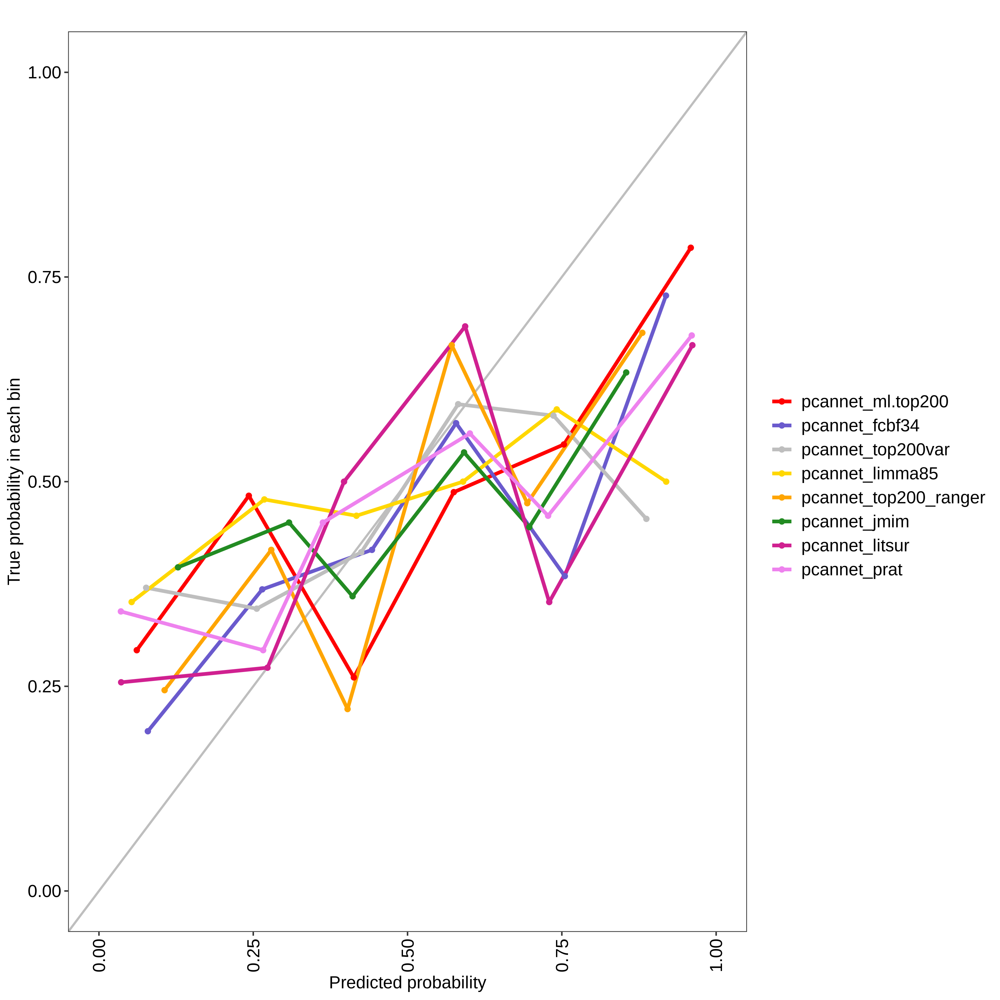

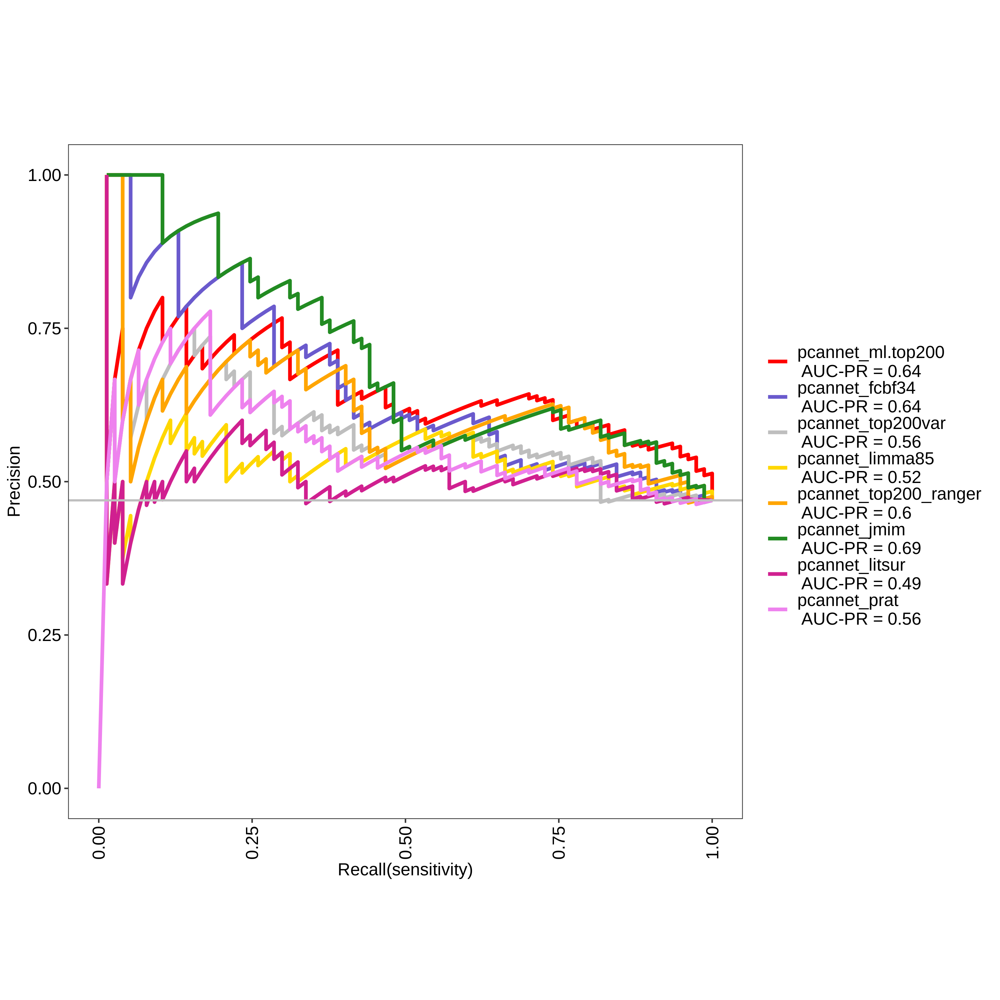

pcannet_ml.top200 Optimal Informedness = 0.360949395432154

pcannet_fcbf34 Optimal Informedness = 0.268547544409613

pcannet_top200var Optimal Informedness = 0.211076280041797

pcannet_limma85 Optimal Informedness = 0.219585012688461

pcannet_top200_ranger Optimal Informedness = 0.35244066278549

pcannet_jmim Optimal Informedness = 0.339453649798477

pcannet_litsur Optimal Informedness = 0.151515151515152

pcannet_prat Optimal Informedness = 0.167636960740409

pcannet_ml.top200 AUC-ROC = 0.71

pcannet_fcbf34 AUC-ROC = 0.65

pcannet_top200var AUC-ROC = 0.61

pcannet_limma85 AUC-ROC = 0.59

pcannet_top200_ranger AUC-ROC = 0.67

pcannet_jmim AUC-ROC = 0.71

pcannet_litsur AUC-ROC = 0.55

pcannet_prat AUC-ROC = 0.59



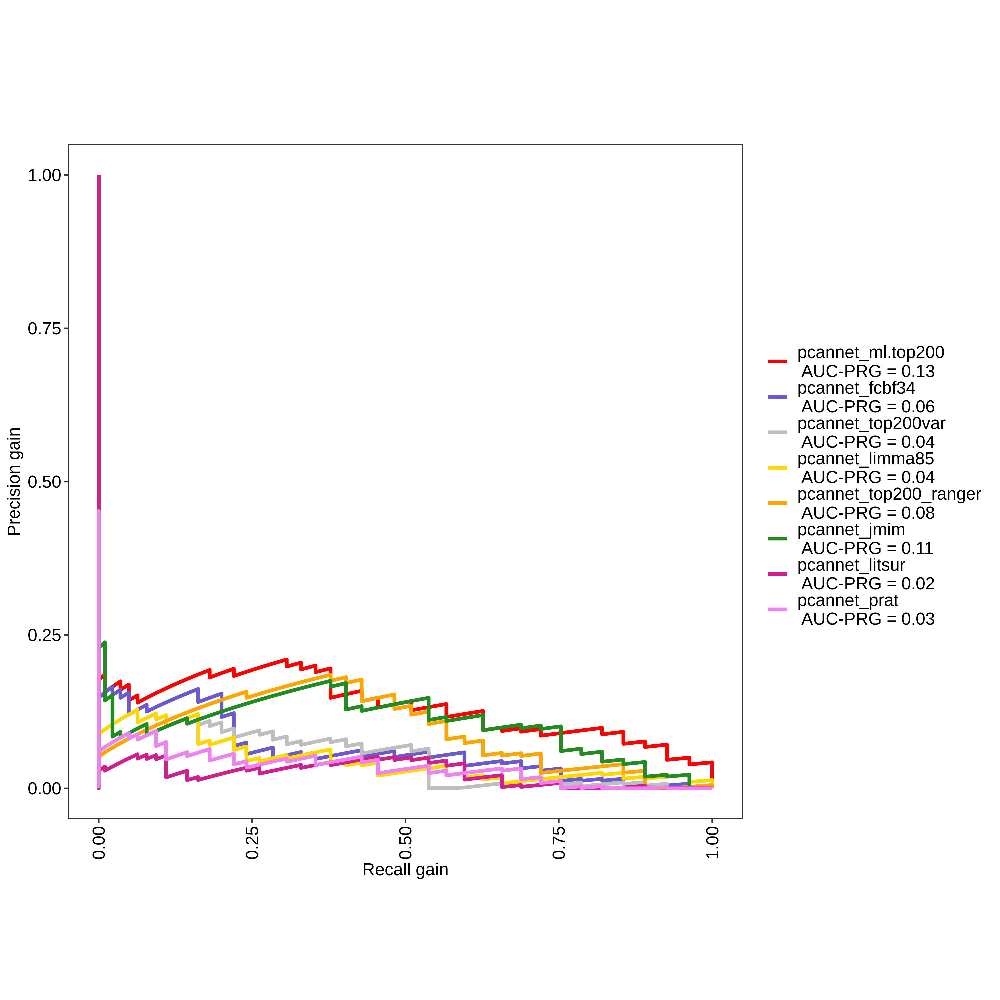

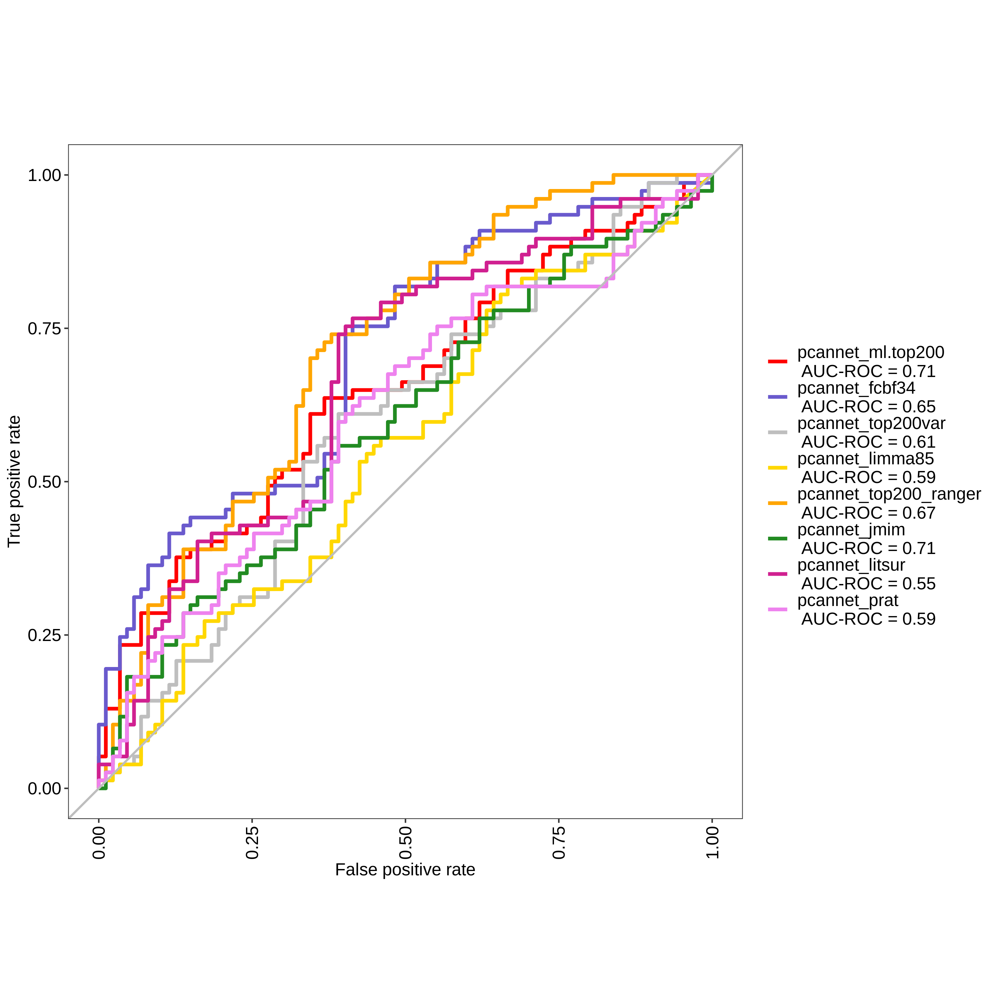

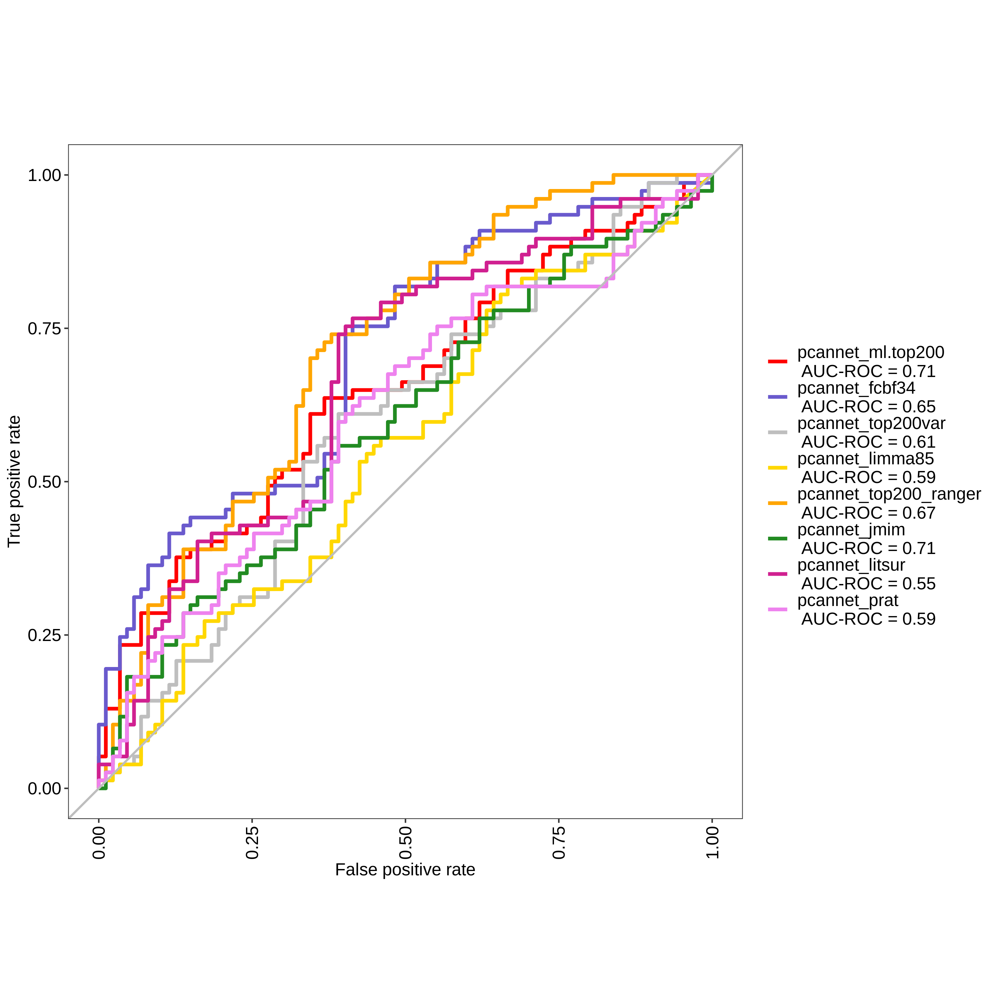

In [57]:
inp_top200_nnet <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_jmim_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))


res_nnet <- evalm(list(inp_top200_nnet, inp_fcbf34_nnet, inp_top200var_nnet, inp_limma85_nnet, inp_top200_ranger_nnet, inp_jmim_nnet, inp_litsur_nnet, inp_prat_nnet),
             gnames=c('pcannet_ml.top200', 'pcannet_fcbf34', 'pcannet_top200var', 'pcannet_limma85', 'pcannet_top200_ranger', 'pcannet_jmim', 'pcannet_litsur', 'pcannet_prat'))
res_nnet$roc

## Gradient Boosting Machines (GBM)

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3615            -nan     0.1000    0.0033
     2        1.3417            -nan     0.1000    0.0057
     3        1.3266            -nan     0.1000   -0.0004
     4        1.3161            -nan     0.1000   -0.0056
     5        1.3009            -nan     0.1000   -0.0031
     6        1.2904            -nan     0.1000   -0.0035
     7        1.2731            -nan     0.1000   -0.0026
     8        1.2511            -nan     0.1000    0.0043
     9        1.2386            -nan     0.1000   -0.0021
    10        1.2136            -nan     0.1000    0.0009
    20        1.0983            -nan     0.1000   -0.0036
    40        0.9291            -nan     0.1000   -0.0000
    60        0.7948            -nan     0.1000   -0.0027
    80        0.6856            -nan     0.1000    0.0003
   100        0.6078            -nan     0.1000   -0.0009
   120        0.5384            -nan     0.1000   -0.0006
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3622            -nan     0.1000    0.0038
     2        1.3522            -nan     0.1000    0.0022
     3        1.3393            -nan     0.1000    0.0024
     4        1.3273            -nan     0.1000    0.0003
     5        1.3181            -nan     0.1000    0.0014
     6        1.3152            -nan     0.1000   -0.0054
     7        1.3127            -nan     0.1000   -0.0017
     8        1.3039            -nan     0.1000    0.0040
     9        1.2966            -nan     0.1000    0.0010
    10        1.2900            -nan     0.1000    0.0007
    20        1.2466            -nan     0.1000   -0.0044
    40        1.1934            -nan     0.1000   -0.0020
    60        1.1434            -nan     0.1000   -0.0034
    80        1.1031            -nan     0.1000   -0.0010
   100        1.0713            -nan     0.1000   -0.0020
   120        1.0497            -nan     0.1000   -0.0045
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3661            -nan     0.1000    0.0046
     2        1.3539            -nan     0.1000    0.0016
     3        1.3392            -nan     0.1000    0.0001
     4        1.3250            -nan     0.1000    0.0025
     5        1.3262            -nan     0.1000   -0.0168
     6        1.3174            -nan     0.1000   -0.0044
     7        1.3036            -nan     0.1000    0.0023
     8        1.2915            -nan     0.1000    0.0019
     9        1.2754            -nan     0.1000    0.0040
    10        1.2659            -nan     0.1000   -0.0011
    20        1.1744            -nan     0.1000   -0.0029
    40        1.0479            -nan     0.1000    0.0006
    60        0.9430            -nan     0.1000   -0.0055
    80        0.8607            -nan     0.1000   -0.0012
   100        0.8016            -nan     0.1000   -0.0045
   120        0.7541            -nan     0.1000   -0.0009
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3771            -nan     0.1000   -0.0149
     2        1.3476            -nan     0.1000    0.0028
     3        1.3331            -nan     0.1000   -0.0001
     4        1.3230            -nan     0.1000   -0.0054
     5        1.3018            -nan     0.1000    0.0002
     6        1.2835            -nan     0.1000    0.0009
     7        1.2655            -nan     0.1000    0.0010
     8        1.2444            -nan     0.1000    0.0024
     9        1.2281            -nan     0.1000    0.0033
    10        1.2104            -nan     0.1000    0.0004
    20        1.0860            -nan     0.1000   -0.0038
    40        0.8807            -nan     0.1000   -0.0007
    60        0.7423            -nan     0.1000   -0.0015
    80        0.6501            -nan     0.1000   -0.0016
   100        0.5617            -nan     0.1000   -0.0019
   120        0.4950            -nan     0.1000   -0.0019
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3629            -nan     0.1000    0.0000
     2        1.3539            -nan     0.1000   -0.0053
     3        1.3362            -nan     0.1000    0.0024
     4        1.3206            -nan     0.1000   -0.0001
     5        1.3018            -nan     0.1000    0.0003
     6        1.2888            -nan     0.1000   -0.0002
     7        1.2663            -nan     0.1000    0.0025
     8        1.2457            -nan     0.1000    0.0025
     9        1.2353            -nan     0.1000   -0.0033
    10        1.2206            -nan     0.1000   -0.0009
    20        1.0924            -nan     0.1000   -0.0050
    40        0.9312            -nan     0.1000    0.0010
    60        0.7940            -nan     0.1000   -0.0013
    80        0.6784            -nan     0.1000   -0.0005
   100        0.5923            -nan     0.1000   -0.0015
   120        0.5253            -nan     0.1000   -0.0031
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3688            -nan     0.1000   -0.0001
     2        1.3553            -nan     0.1000   -0.0010
     3        1.3450            -nan     0.1000   -0.0042
     4        1.3255            -nan     0.1000    0.0023
     5        1.3184            -nan     0.1000   -0.0082
     6        1.3024            -nan     0.1000    0.0012
     7        1.2863            -nan     0.1000    0.0034
     8        1.2681            -nan     0.1000    0.0056
     9        1.2628            -nan     0.1000   -0.0084
    10        1.2474            -nan     0.1000   -0.0009
    20        1.1588            -nan     0.1000    0.0009
    40        0.9805            -nan     0.1000   -0.0048
    60        0.8503            -nan     0.1000   -0.0039
    80        0.7451            -nan     0.1000   -0.0032
   100        0.6659            -nan     0.1000   -0.0011
   120        0.5885            -nan     0.1000   -0.0019
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3629            -nan     0.1000    0.0062
     2        1.3465            -nan     0.1000    0.0042
     3        1.3274            -nan     0.1000    0.0044
     4        1.3181            -nan     0.1000    0.0007
     5        1.3166            -nan     0.1000   -0.0025
     6        1.3131            -nan     0.1000   -0.0073
     7        1.3038            -nan     0.1000   -0.0002
     8        1.2915            -nan     0.1000   -0.0043
     9        1.2790            -nan     0.1000    0.0025
    10        1.2792            -nan     0.1000   -0.0119
    20        1.2209            -nan     0.1000    0.0044
    40        1.1352            -nan     0.1000   -0.0027
    60        1.0714            -nan     0.1000   -0.0025
    80        1.0214            -nan     0.1000   -0.0036
   100        0.9861            -nan     0.1000   -0.0025
   120        0.9443            -nan     0.1000   -0.0038
   140        

Iter   TrainDeviance   ValidDeviance   StepSize   Improve
     1        1.3639            -nan     0.1000    0.0053
     2        1.3585            -nan     0.1000   -0.0089
     3        1.3375            -nan     0.1000    0.0017
     4        1.3280            -nan     0.1000   -0.0025
     5        1.3293            -nan     0.1000   -0.0122
     6        1.3269            -nan     0.1000   -0.0116
     7        1.3062            -nan     0.1000   -0.0012
     8        1.3003            -nan     0.1000   -0.0040
     9        1.2939            -nan     0.1000   -0.0147
    10        1.2837            -nan     0.1000    0.0009
    20        1.2101            -nan     0.1000   -0.0081
    40        1.0723            -nan     0.1000   -0.0044
    60        0.9652            -nan     0.1000   -0.0006
    80        0.8715            -nan     0.1000   -0.0031
   100        0.7960            -nan     0.1000   -0.0001
   120        0.7261            -nan     0.1000   -0.0052
   140        

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: gbm_ml.top200

Positive: 77

Negative: 87

Group: gbm_fcbf34

Positive: 77

Negative: 87

Group: gbm_top200var

Positive: 77

Negative: 87

Group: gbm_limma85

Positive: 77

Negative: 87

Group: gbm_top200_ranger

Positive: 77

Negative: 87

Group: gbm_jmim

Positive: 77

Negative: 87

Group: gbm_litsur

Positive: 77

Negative: 87

Group: gbm_prat

Positive: 77

Negative: 87

***Performance Metrics***



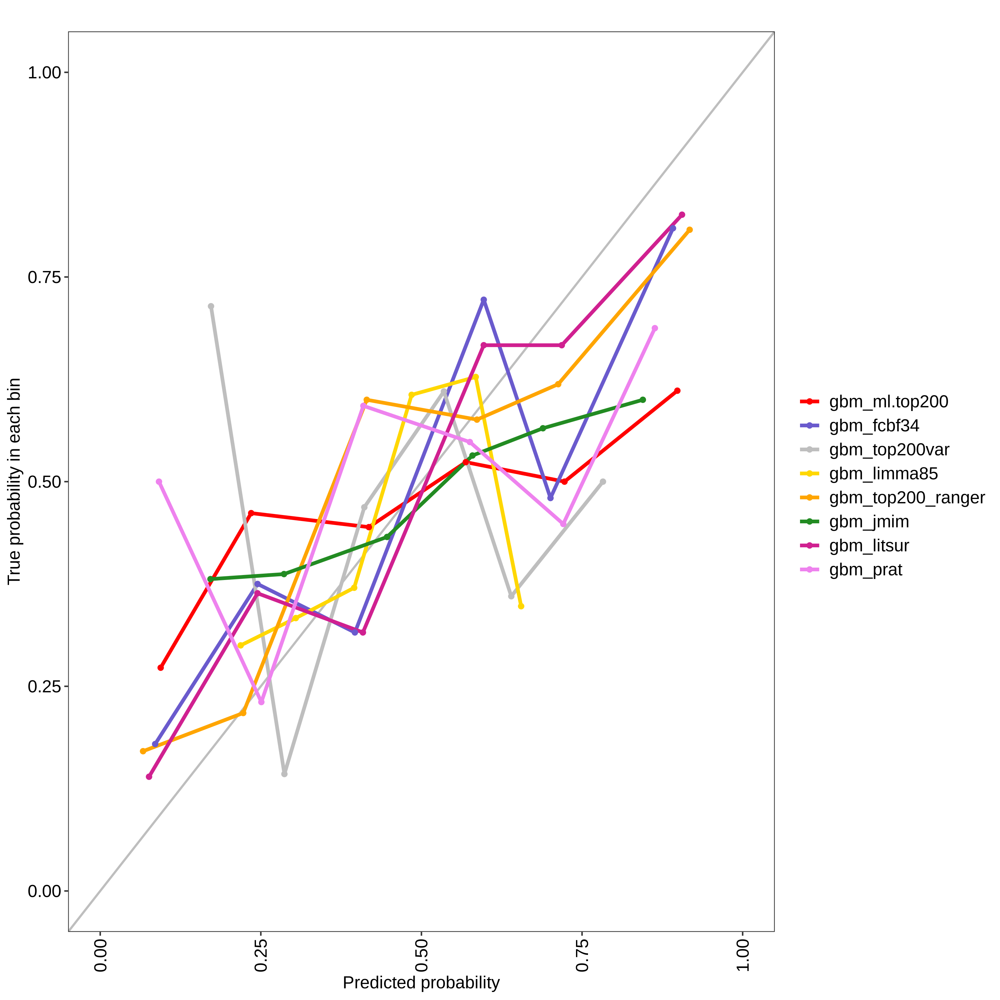

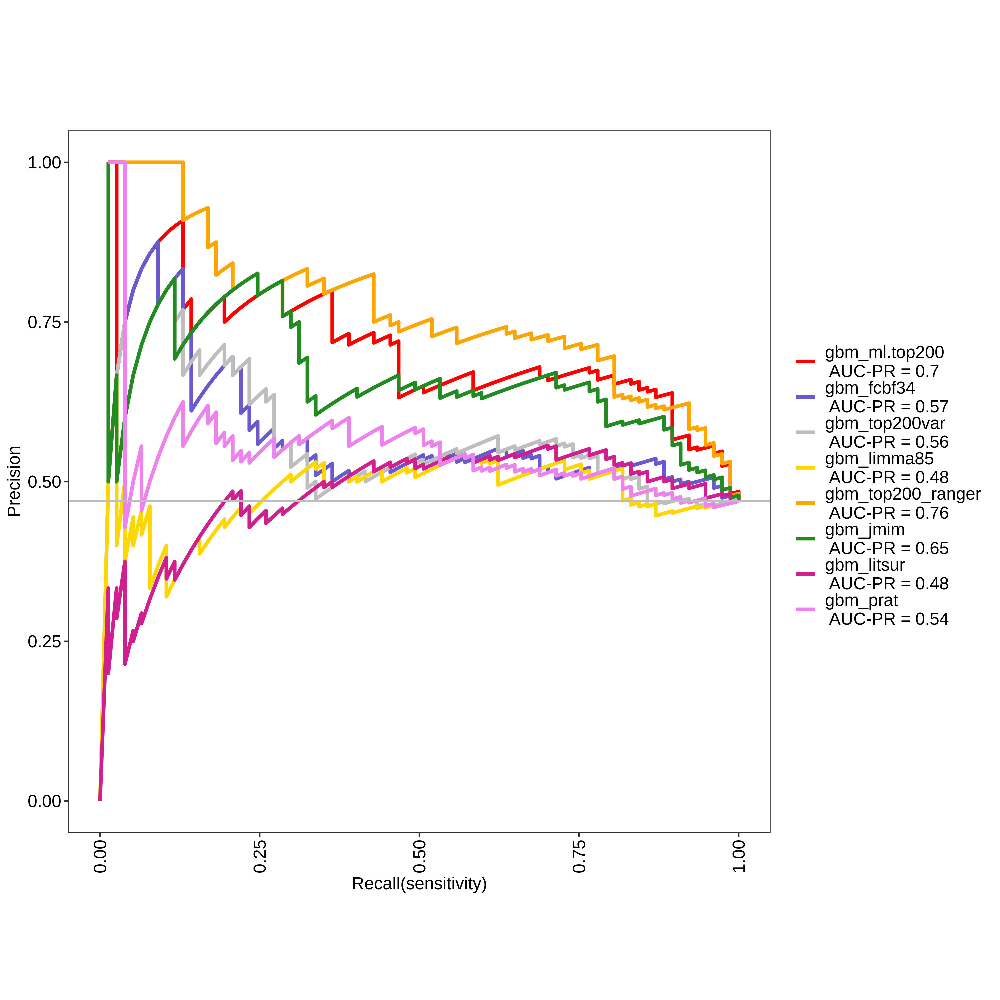

gbm_ml.top200 Optimal Informedness = 0.453351246454695

gbm_fcbf34 Optimal Informedness = 0.203463203463203

gbm_top200var Optimal Informedness = 0.231527093596059

gbm_limma85 Optimal Informedness = 0.16405433646813

gbm_top200_ranger Optimal Informedness = 0.503358710255262

gbm_jmim Optimal Informedness = 0.409911927153306

gbm_litsur Optimal Informedness = 0.217495148529631

gbm_prat Optimal Informedness = 0.184654426033736

gbm_ml.top200 AUC-ROC = 0.76

gbm_fcbf34 AUC-ROC = 0.6

gbm_top200var AUC-ROC = 0.59

gbm_limma85 AUC-ROC = 0.54

gbm_top200_ranger AUC-ROC = 0.8

gbm_jmim AUC-ROC = 0.72

gbm_litsur AUC-ROC = 0.57

gbm_prat AUC-ROC = 0.58



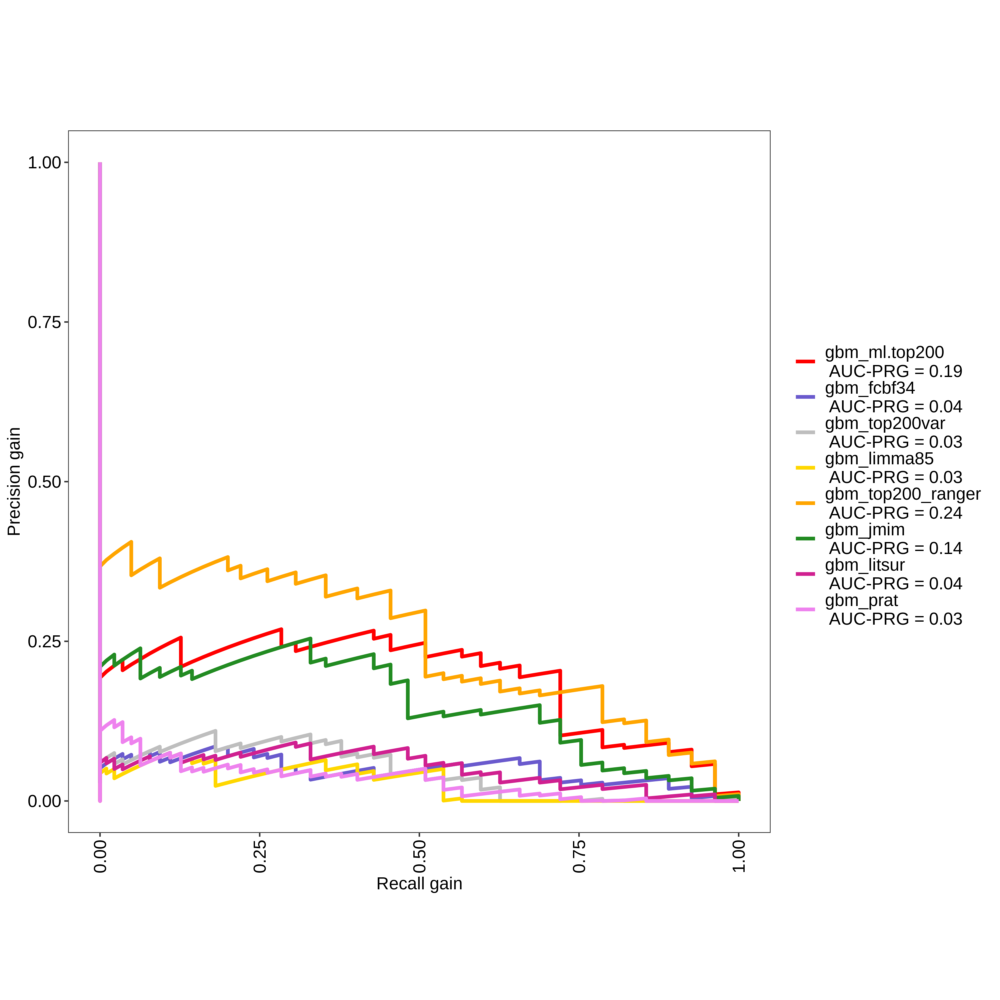

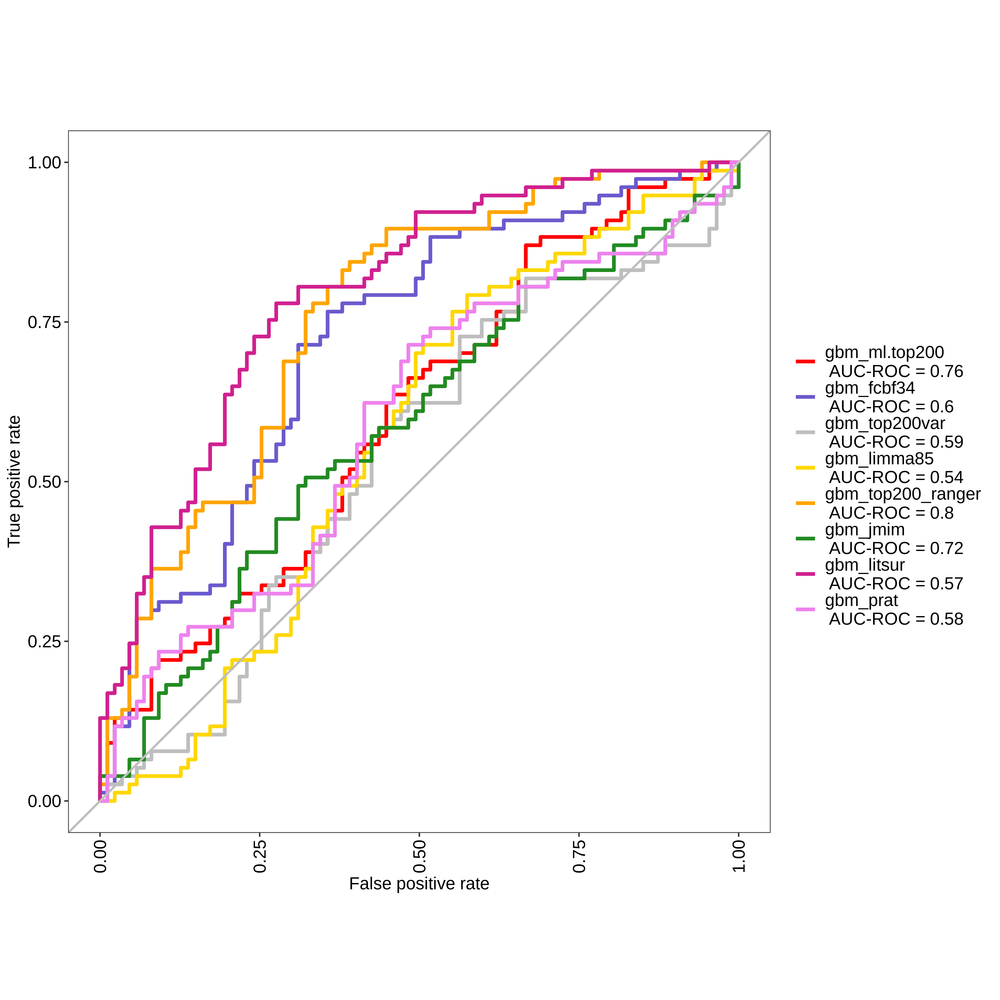

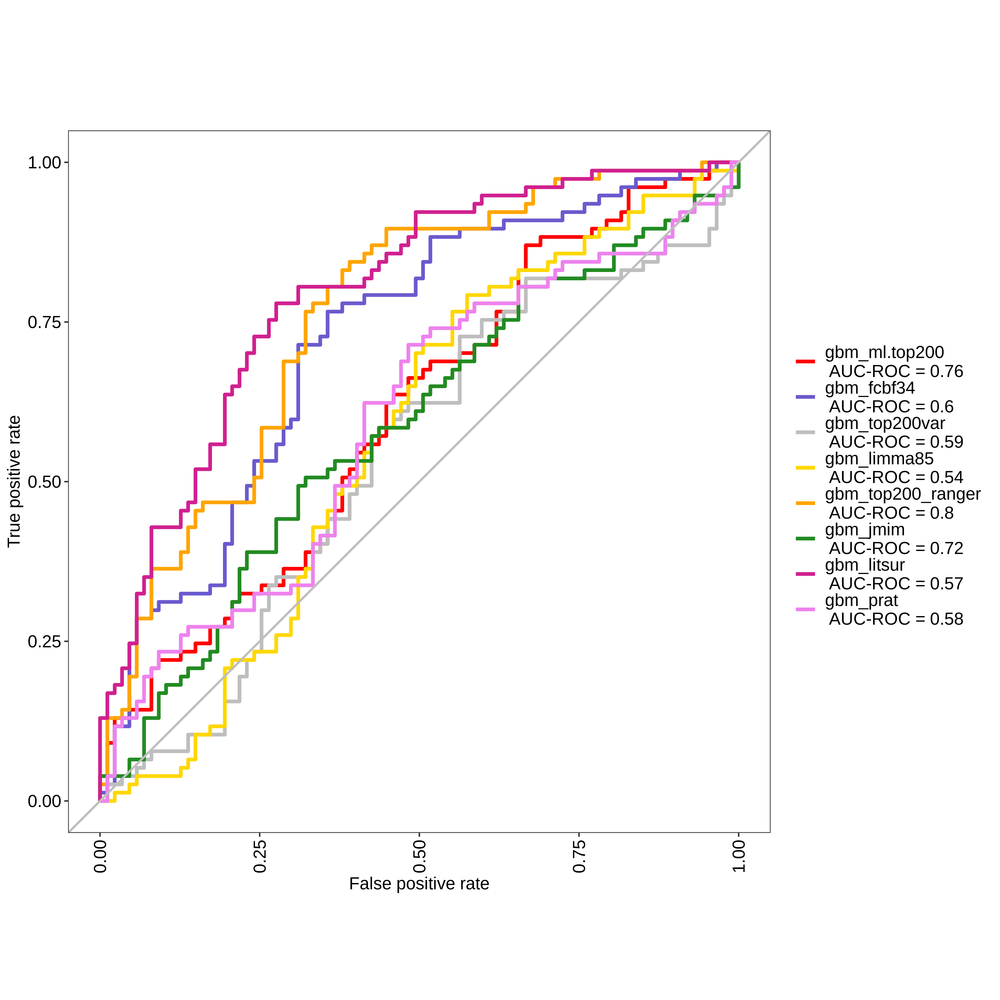

In [58]:
inp_top200_gbm <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_gbm <- evalm(list(inp_top200_gbm, inp_fcbf34_gbm, inp_top200var_gbm, inp_limma85_gbm, inp_top200_ranger_gbm, inp_jmim_gbm, inp_litsur_gbm, inp_prat_gbm),
             gnames=c('gbm_ml.top200', 'gbm_fcbf34', 'gbm_top200var', 'gbm_limma85', 'gbm_top200_ranger', 'gbm_jmim', 'gbm_litsur', 'gbm_prat'))
res_gbm$roc

## Partial Least Squares

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: pls_ml.top200

Positive: 77

Negative: 87

Group: pls_fcbf34

Positive: 77

Negative: 87

Group: pls_top200var

Positive: 77

Negative: 87

Group: pls_limma85

Positive: 77

Negative: 87

Group: pls_top200_ranger

Positive: 77

Negative: 87

Group: pls_jmim

Positive: 77

Negative: 87

Group: pls_litsur

Positive: 77

Negative: 87

Group: pls_prat

Positive: 77

Negative: 87

***Performance Metrics***



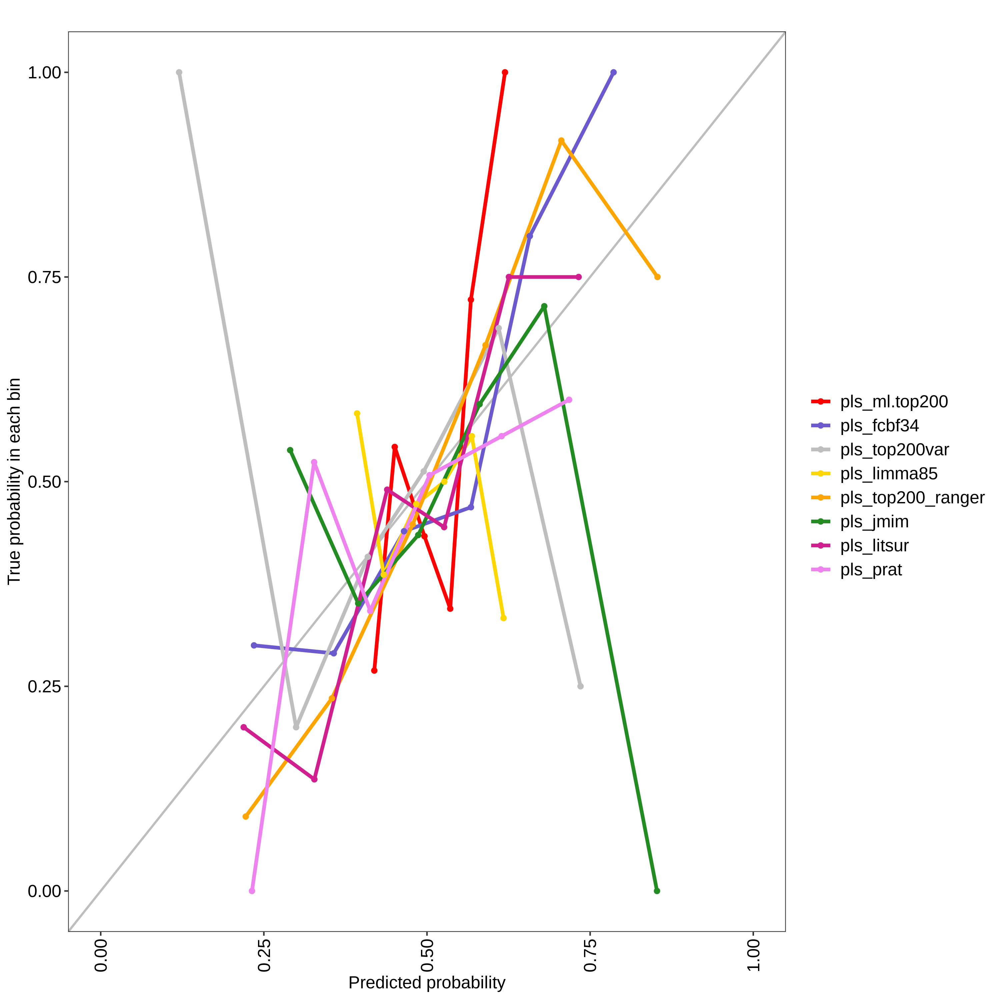

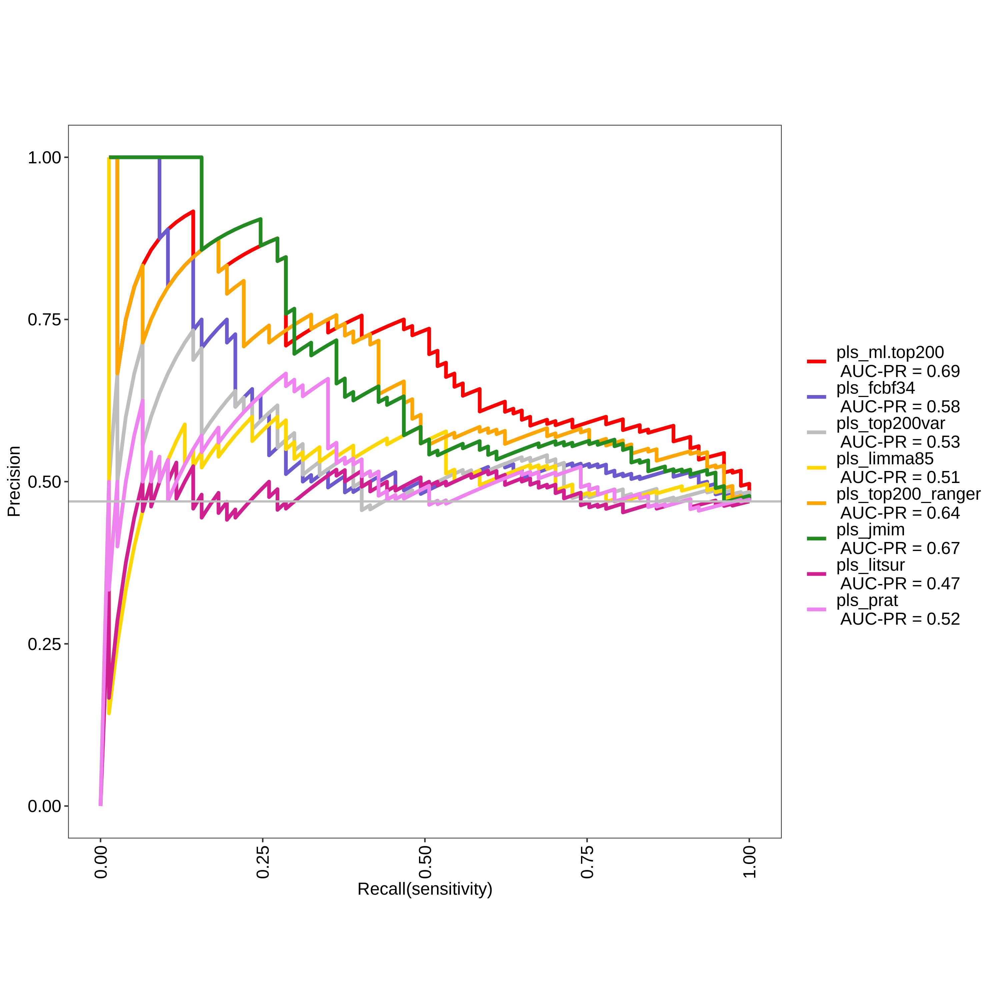

pls_ml.top200 Optimal Informedness = 0.345573966263621

pls_fcbf34 Optimal Informedness = 0.1589789520824

pls_top200var Optimal Informedness = 0.171070309001343

pls_limma85 Optimal Informedness = 0.187639946260636

pls_top200_ranger Optimal Informedness = 0.279146141215107

pls_jmim Optimal Informedness = 0.251977907150321

pls_litsur Optimal Informedness = 0.104642483952829

pls_prat Optimal Informedness = 0.189729810419466

pls_ml.top200 AUC-ROC = 0.73

pls_fcbf34 AUC-ROC = 0.59

pls_top200var AUC-ROC = 0.56

pls_limma85 AUC-ROC = 0.57

pls_top200_ranger AUC-ROC = 0.68

pls_jmim AUC-ROC = 0.66

pls_litsur AUC-ROC = 0.52

pls_prat AUC-ROC = 0.55



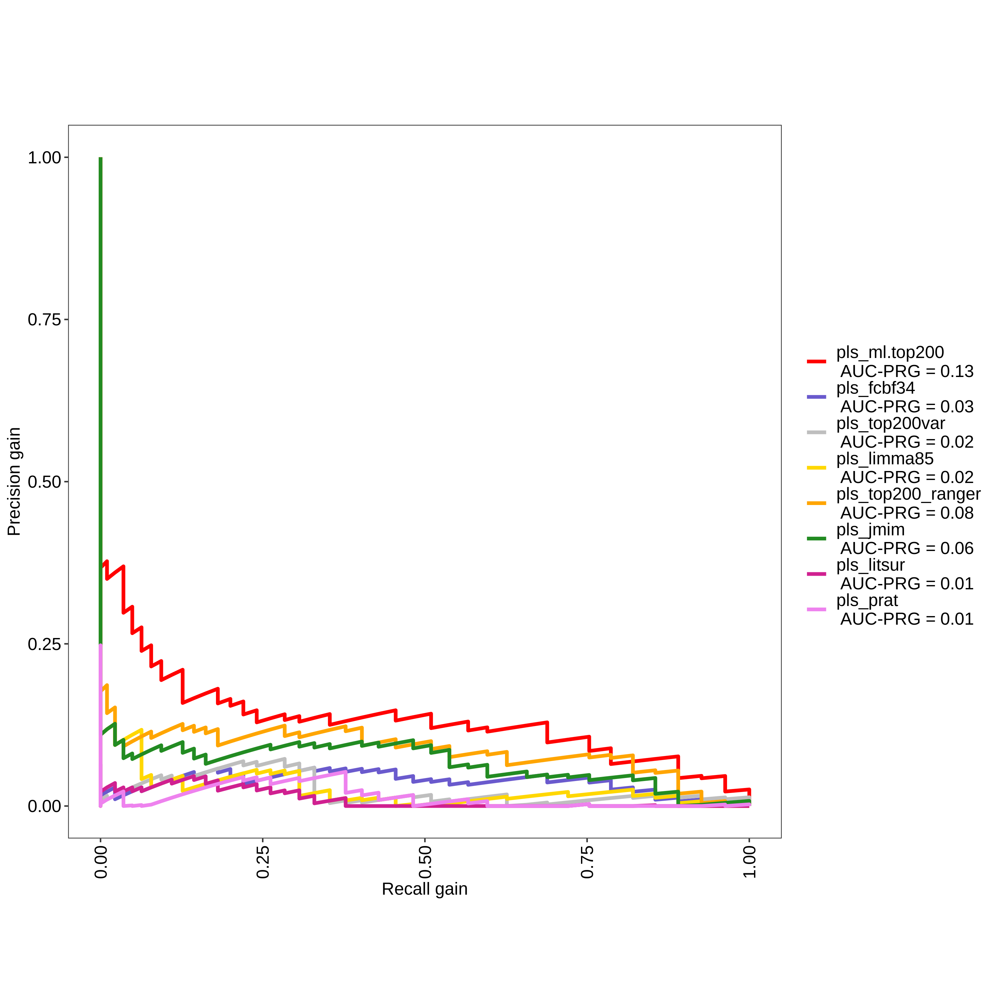

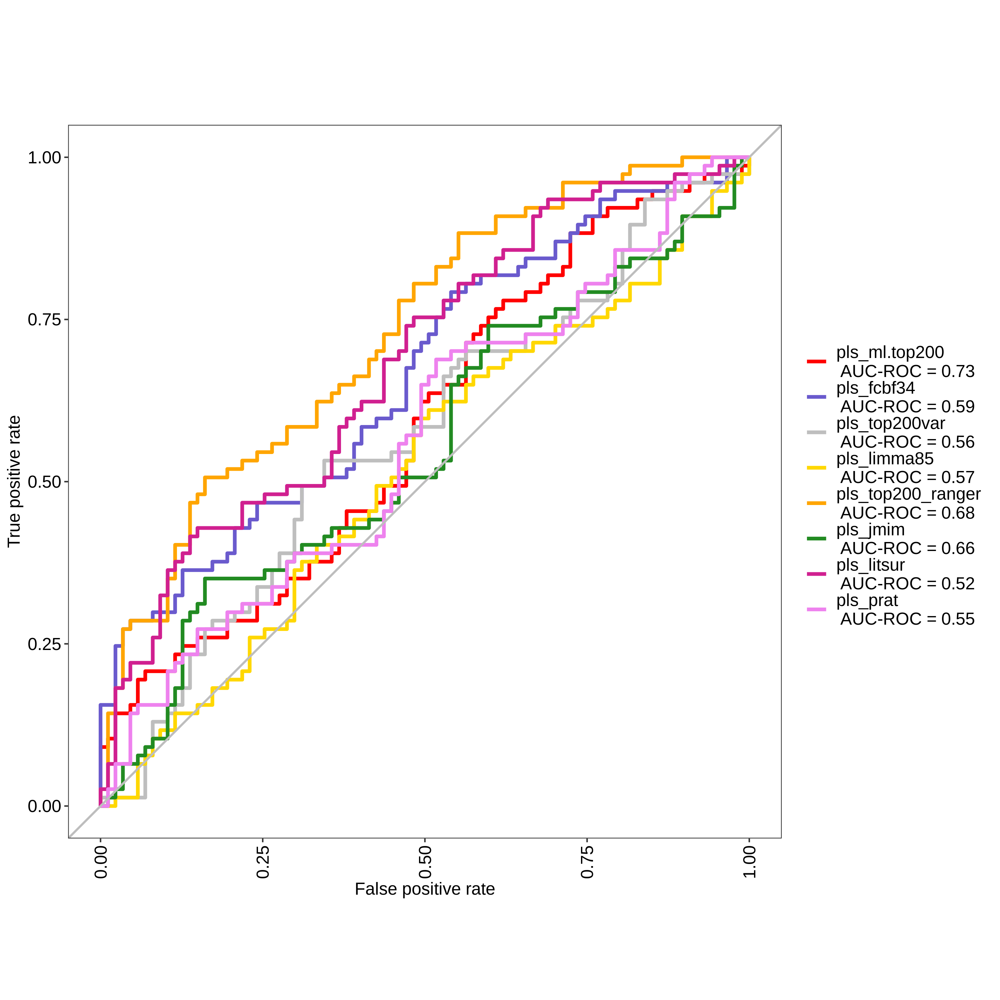

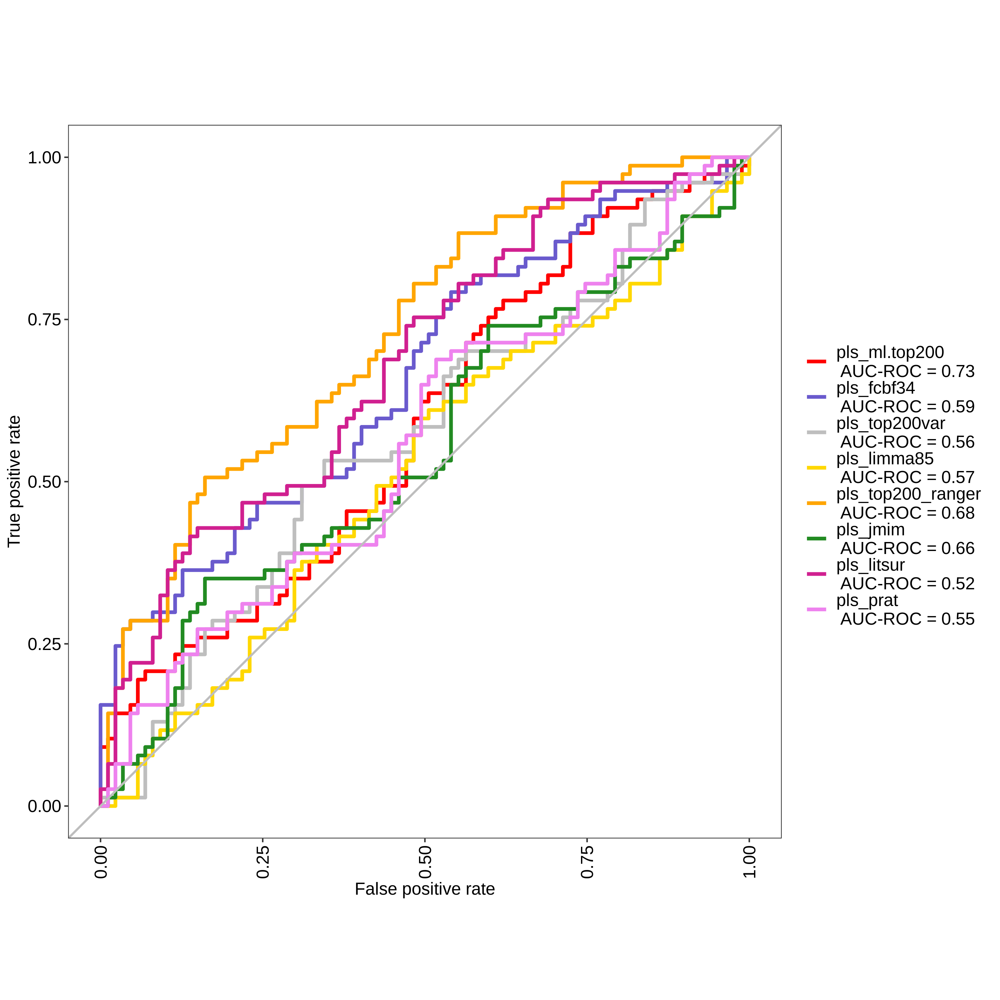

In [59]:
inp_top200_pls <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_pls <- evalm(list(inp_top200_pls, inp_fcbf34_pls, inp_top200var_pls, inp_limma85_pls, inp_top200_ranger_pls, inp_jmim_pls, inp_litsur_pls, inp_prat_pls),
             gnames=c('pls_ml.top200', 'pls_fcbf34', 'pls_top200var', 'pls_limma85', 'pls_top200_ranger', 'pls_jmim', 'pls_litsur', 'pls_prat'))
res_pls$roc

## Cforest

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: crf_ml.top200

Positive: 77

Negative: 87

Group: crf_fcbf34

Positive: 77

Negative: 87

Group: crf_top200var

Positive: 77

Negative: 87

Group: crf_limma85

Positive: 77

Negative: 87

Group: crf_top200_ranger

Positive: 77

Negative: 87

Group: crf_jmim

Positive: 77

Negative: 87

Group: crf_litsur

Positive: 77

Negative: 87

Group: crf_prat

Positive: 77

Negative: 87

***Performance Metrics***



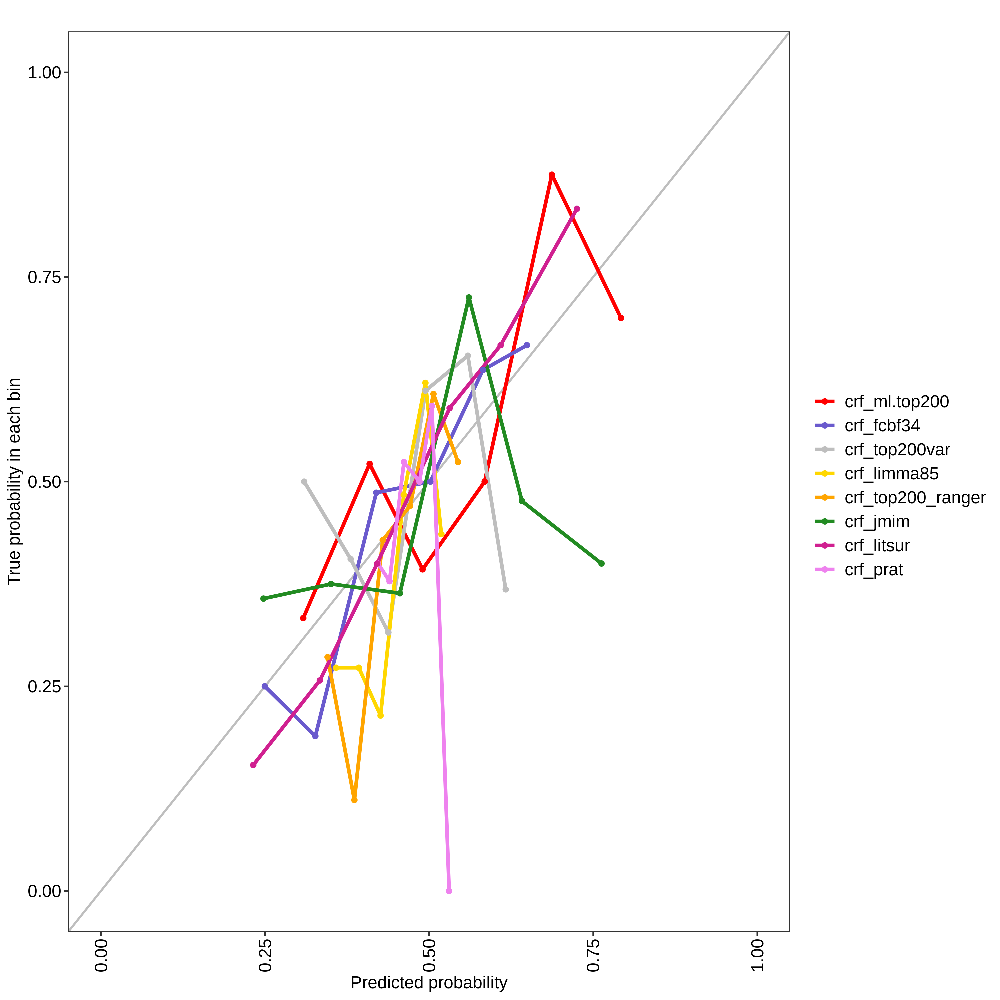

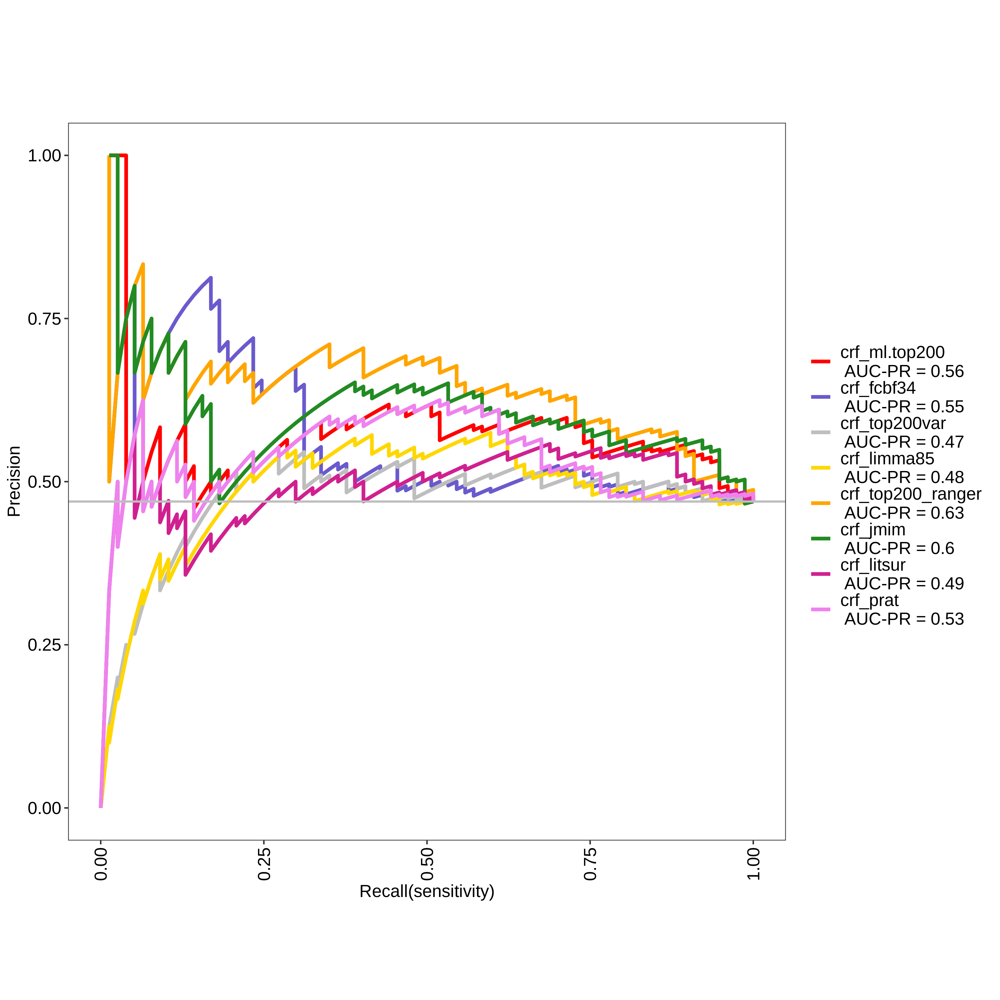

crf_ml.top200 Optimal Informedness = 0.288998357963875

crf_fcbf34 Optimal Informedness = 0.172264517092103

crf_top200var Optimal Informedness = 0.132109270040305

crf_limma85 Optimal Informedness = 0.206597999701448

crf_top200_ranger Optimal Informedness = 0.347962382445141

crf_jmim Optimal Informedness = 0.291983878190775

crf_litsur Optimal Informedness = 0.22794446932378

crf_prat Optimal Informedness = 0.265562024182714

crf_ml.top200 AUC-ROC = 0.65

crf_fcbf34 AUC-ROC = 0.57

crf_top200var AUC-ROC = 0.54

crf_limma85 AUC-ROC = 0.56

crf_top200_ranger AUC-ROC = 0.7

crf_jmim AUC-ROC = 0.68

crf_litsur AUC-ROC = 0.57

crf_prat AUC-ROC = 0.6



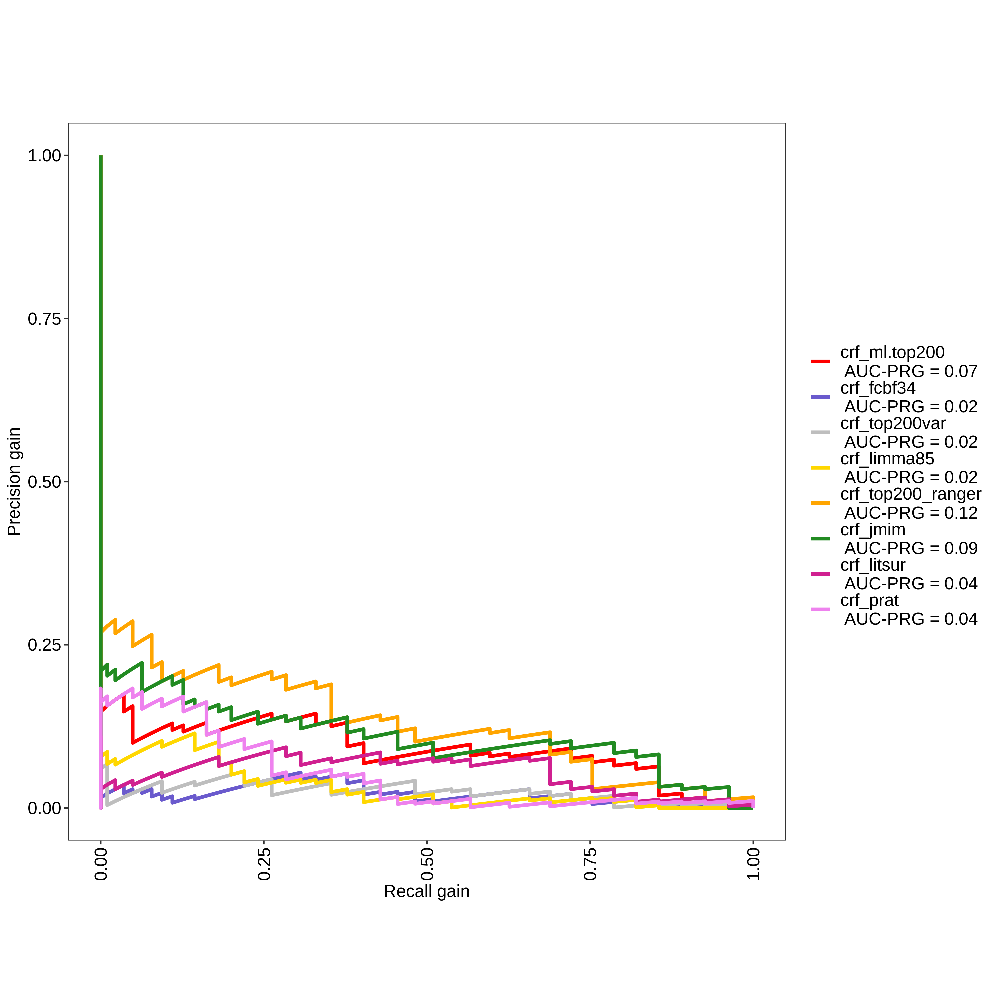

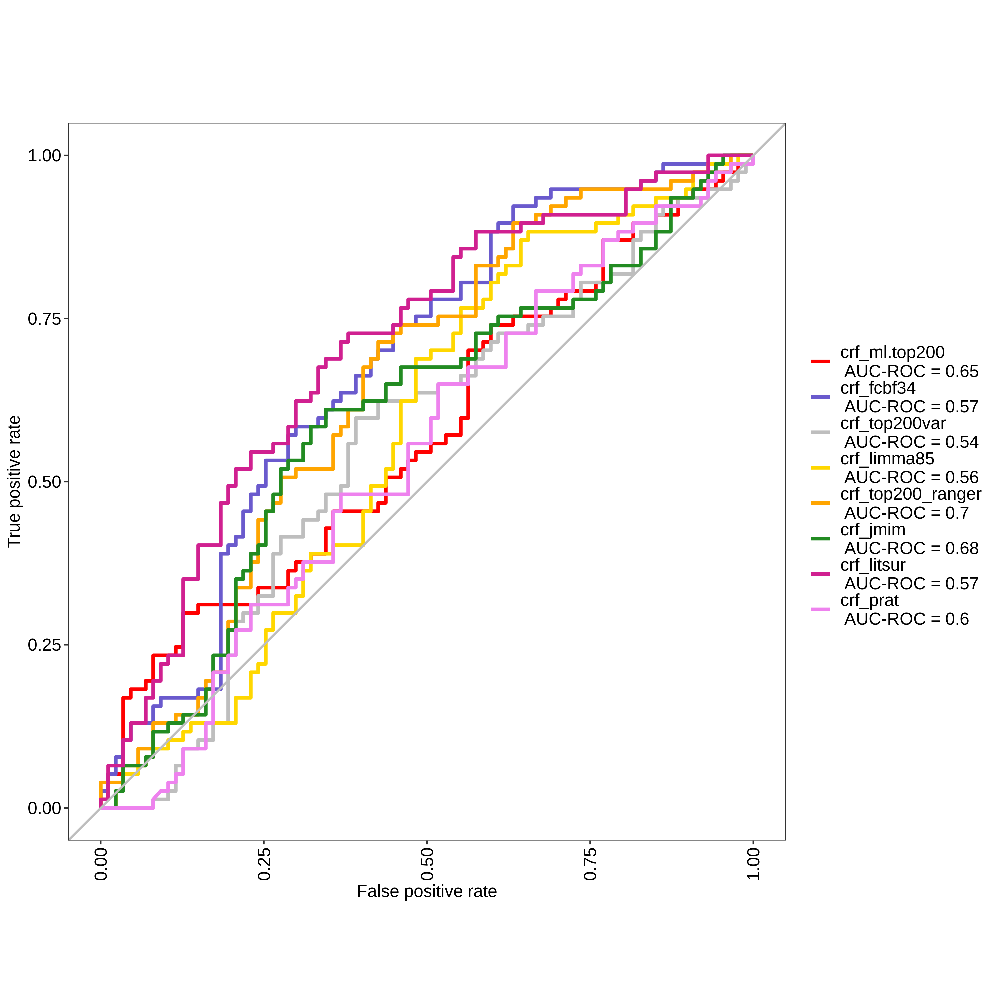

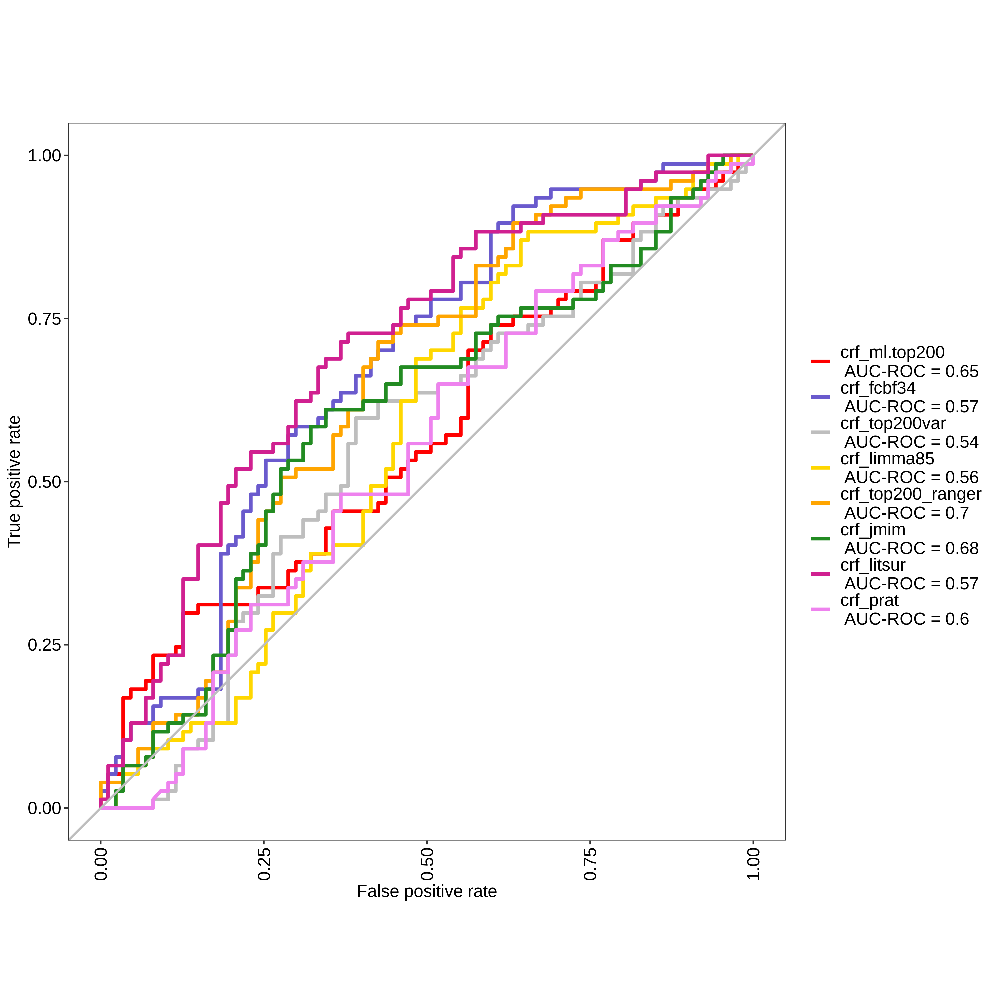

In [60]:
inp_top200_crf <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_crf <- evalm(list(inp_top200_crf, inp_fcbf34_crf, inp_top200var_crf, inp_limma85_crf, inp_top200_ranger_crf, inp_jmim_crf, inp_litsur_crf, inp_prat_crf),
             gnames=c('crf_ml.top200', 'crf_fcbf34', 'crf_top200var', 'crf_limma85', 'crf_top200_ranger', 'crf_jmim', 'crf_litsur', 'crf_prat'))
res_crf$roc

## High Dimensional Discriminant Analysis

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: hdda_ml.top200

Positive: 77

Negative: 87

Group: hdda_fcbf34

Positive: 77

Negative: 87

Group: hdda_litsurvey

Positive: 77

Negative: 87

Group: hdda_limma85

Positive: 77

Negative: 87

Group: hdda_top200_ranger

Positive: 77

Negative: 87

Group: hdda_jmim

Positive: 77

Negative: 87

Group: hdda_litsur

Positive: 77

Negative: 87

Group: hdda_prat

Positive: 77

Negative: 87

***Performance Metrics***



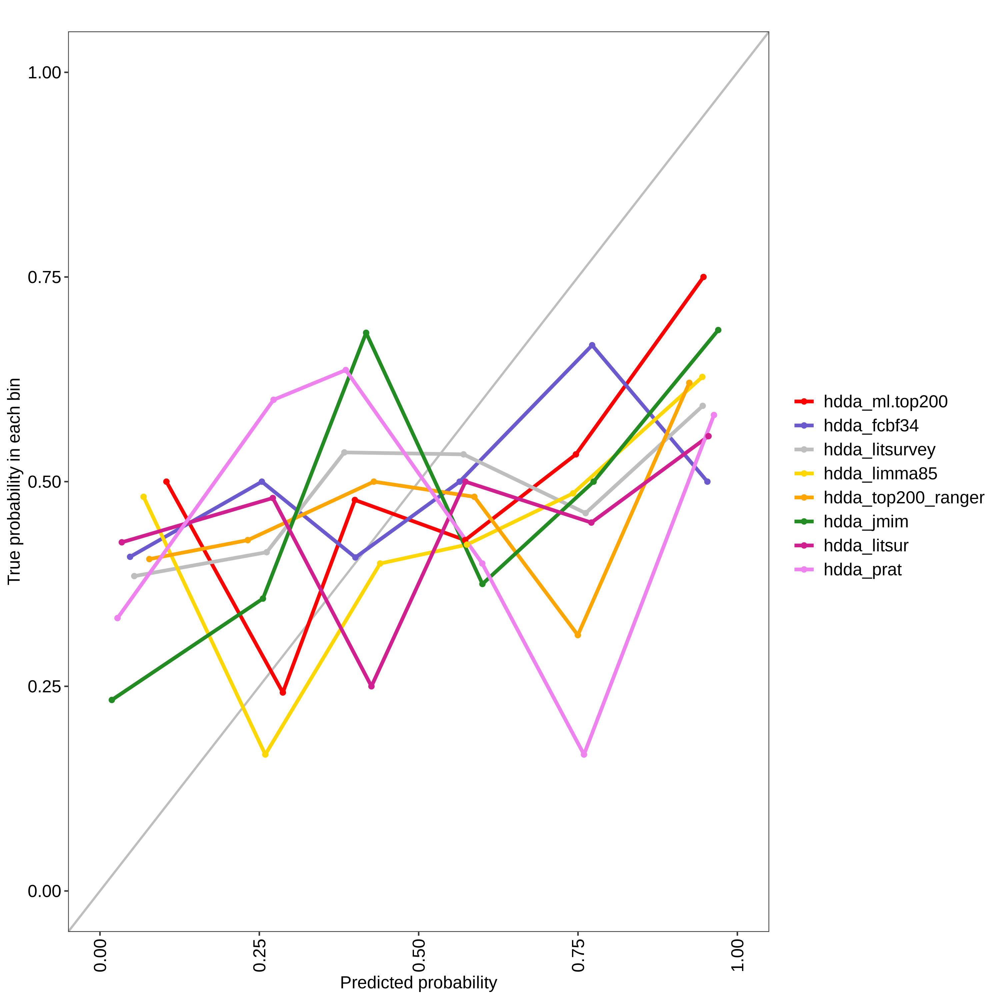

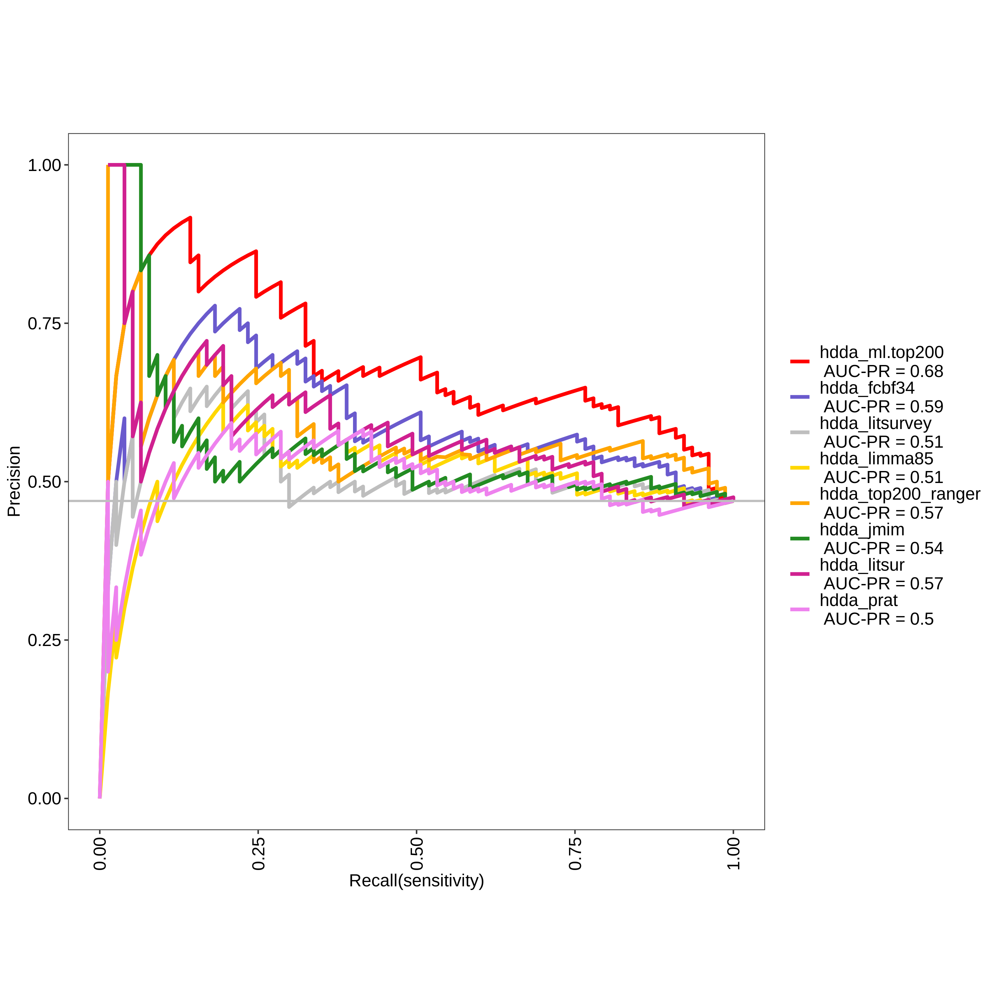

hdda_ml.top200 Optimal Informedness = 0.398417674279743

hdda_fcbf34 Optimal Informedness = 0.258993879683535

hdda_litsurvey Optimal Informedness = 0.125093297507091

hdda_limma85 Optimal Informedness = 0.158083296014331

hdda_top200_ranger Optimal Informedness = 0.270935960591133

hdda_jmim Optimal Informedness = 0.125242573518435

hdda_litsur Optimal Informedness = 0.196596506941334

hdda_prat Optimal Informedness = 0.152709359605911

hdda_ml.top200 AUC-ROC = 0.73

hdda_fcbf34 AUC-ROC = 0.64

hdda_litsurvey AUC-ROC = 0.55

hdda_limma85 AUC-ROC = 0.57

hdda_top200_ranger AUC-ROC = 0.63

hdda_jmim AUC-ROC = 0.57

hdda_litsur AUC-ROC = 0.6

hdda_prat AUC-ROC = 0.54



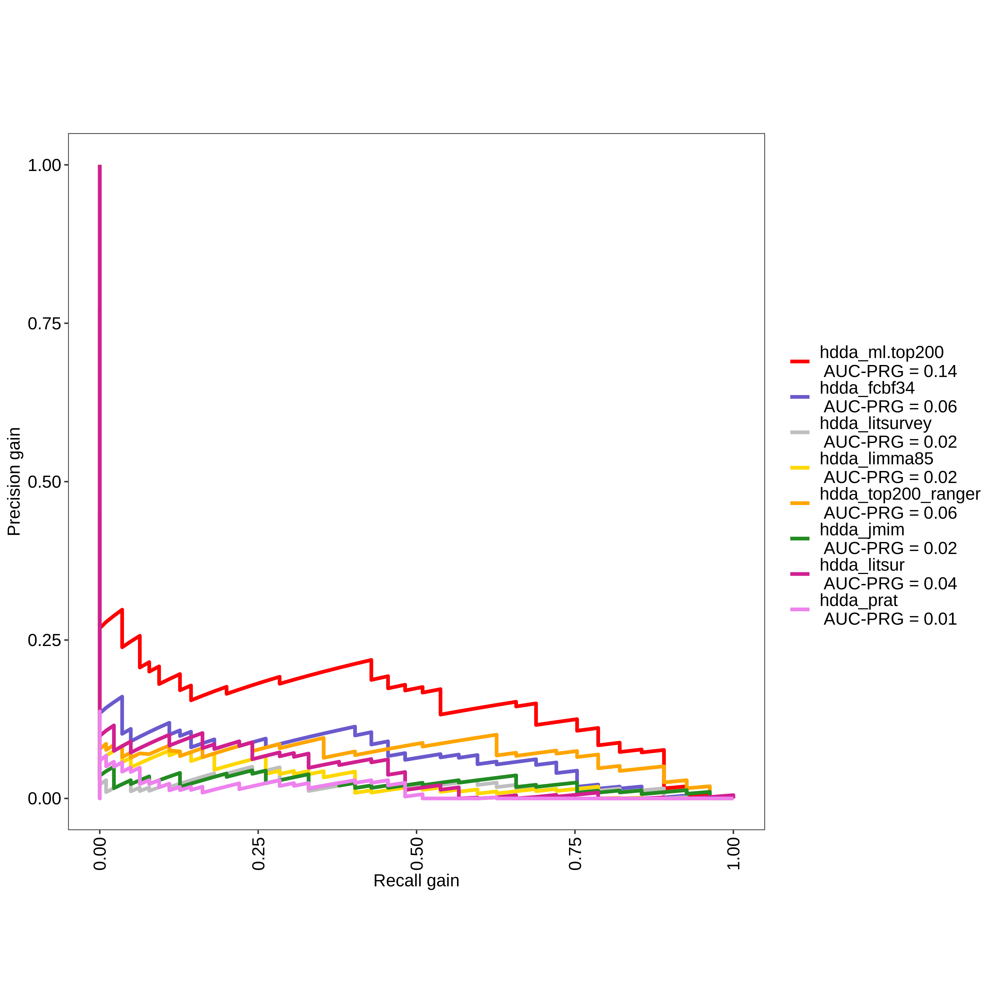

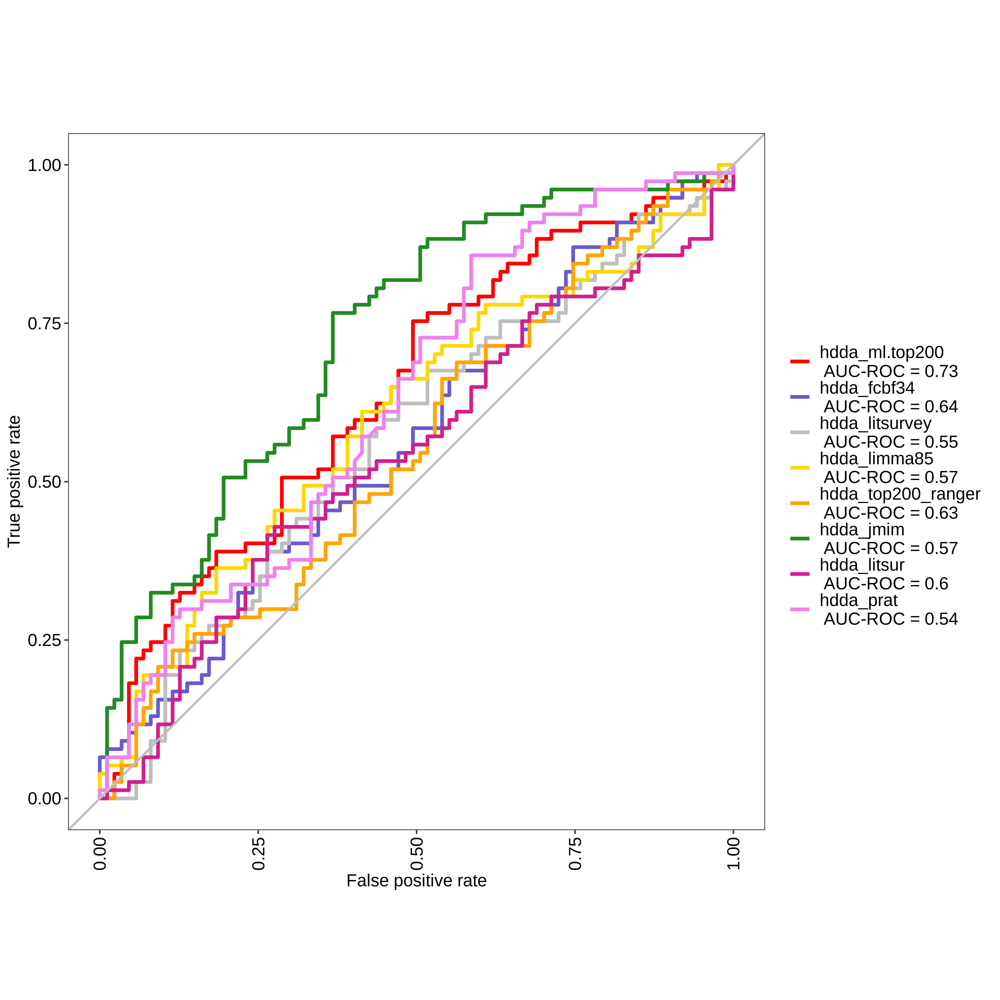

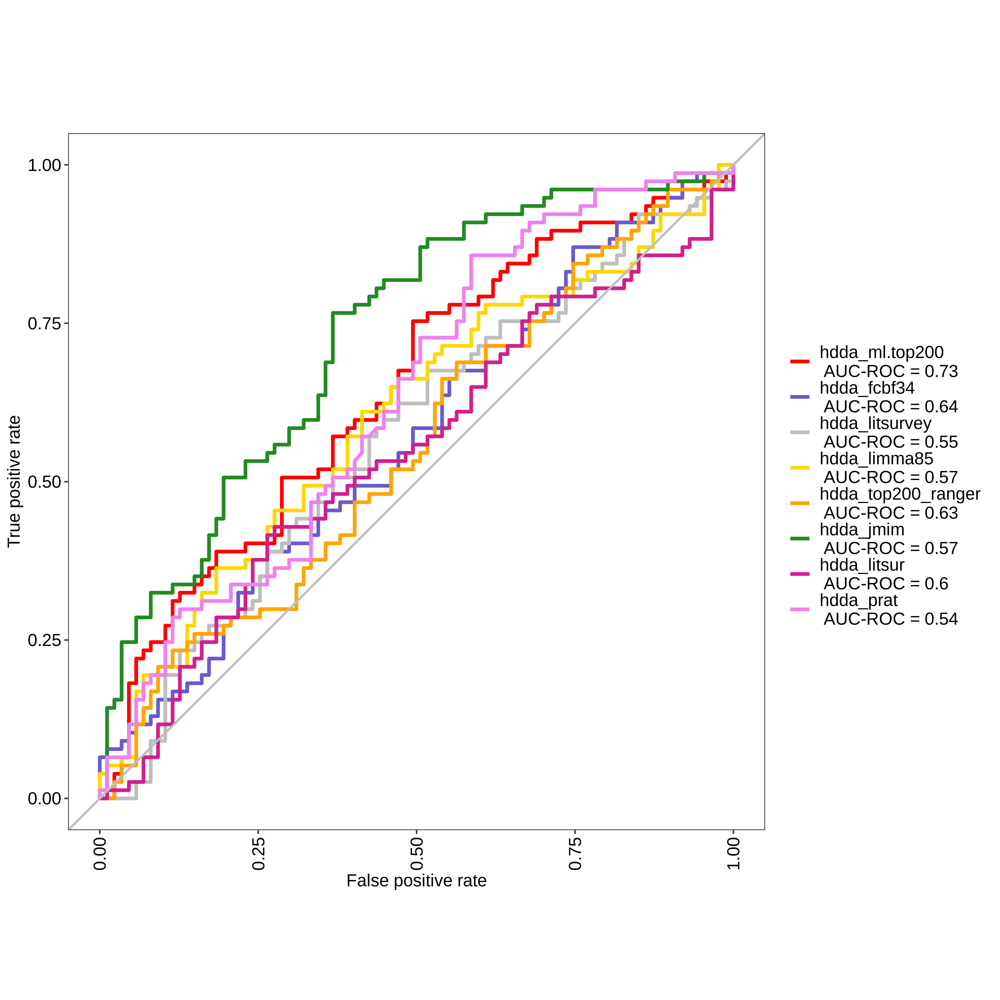

In [61]:
inp_top200_hdda <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_hdda <- evalm(list(inp_top200_hdda, inp_fcbf34_hdda, inp_top200var_hdda, inp_limma85_hdda, inp_top200_ranger_hdda, inp_jmim_hdda, inp_litsur_hdda, inp_prat_hdda),
             gnames=c('hdda_ml.top200', 'hdda_fcbf34', 'hdda_litsurvey', 'hdda_limma85', 'hdda_top200_ranger', 'hdda_jmim', 'hdda_litsur', 'hdda_prat'))
res_hdda$roc

## Naïve Bayes

***MLeval: Machine Learning Model Evaluation***

Input: caret train function object

Averaging probs.

Group 1 type: repeatedcv

Group 2 type: repeatedcv

Group 3 type: repeatedcv

Group 4 type: repeatedcv

Group 5 type: repeatedcv

Group 6 type: repeatedcv

Group 7 type: repeatedcv

Group 8 type: repeatedcv

Observations: 1312

Number of groups: 8

Observations per group: 164

Positive: Y

Negative: N

Group: nb_ml.top200

Positive: 77

Negative: 87

Group: nb_fcbf34

Positive: 77

Negative: 87

Group: nb_litsurvey

Positive: 77

Negative: 87

Group: nb_limma85

Positive: 77

Negative: 87

Group: nb_top200_ranger

Positive: 77

Negative: 87

Group: nb_jmim

Positive: 77

Negative: 87

Group: nb_litsur

Positive: 77

Negative: 87

Group: nb_prat

Positive: 77

Negative: 87

***Performance Metrics***



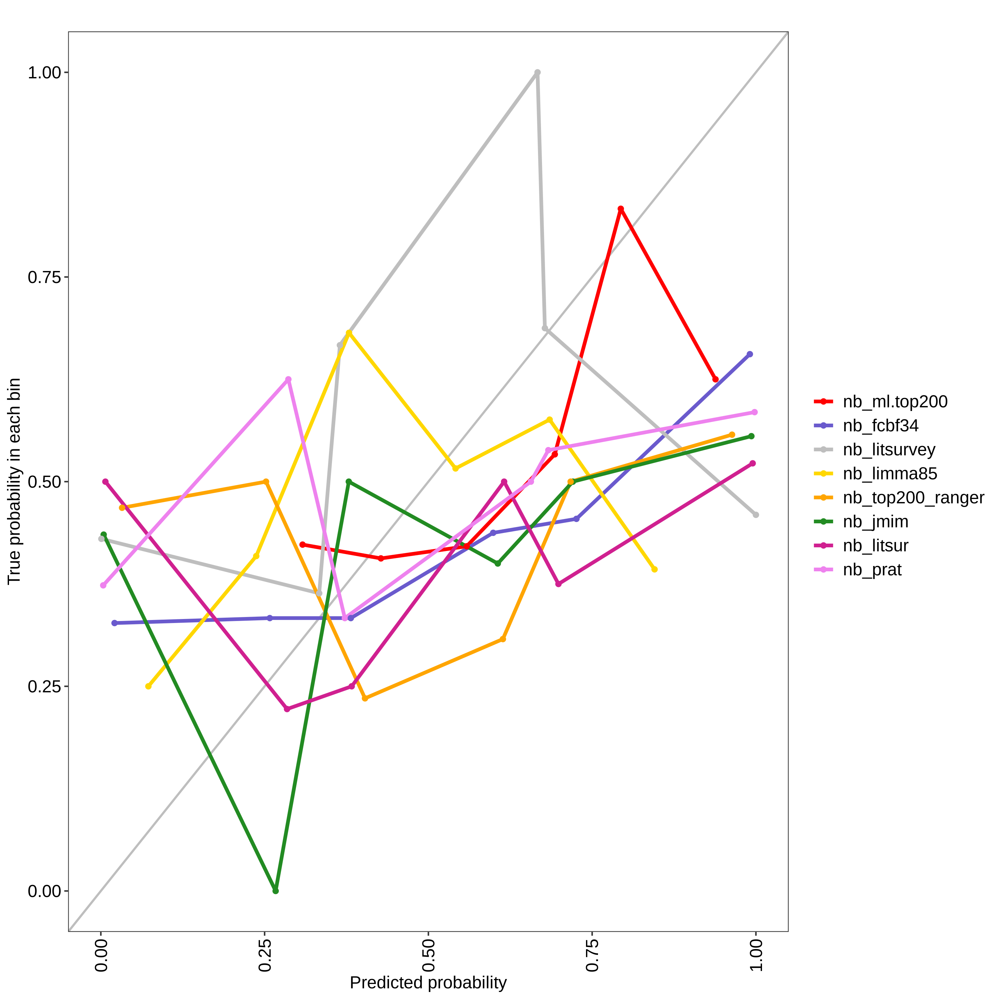

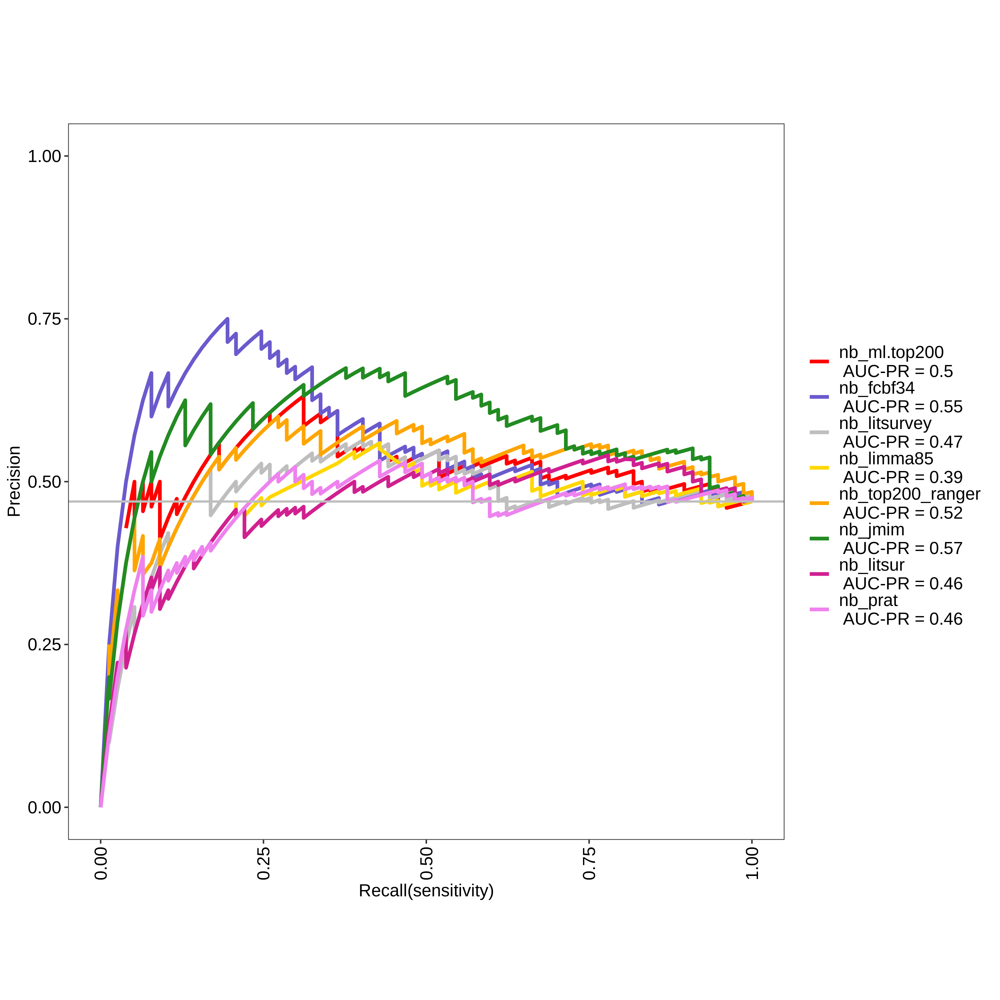

nb_ml.top200 Optimal Informedness = 0.156739811912226

nb_fcbf34 Optimal Informedness = 0.186744290192566

nb_litsurvey Optimal Informedness = 0.140170174652933

nb_limma85 Optimal Informedness = 0.129720853858785

nb_top200_ranger Optimal Informedness = 0.227496641289745

nb_jmim Optimal Informedness = 0.292580982236155

nb_litsur Optimal Informedness = 0.193013882669055

nb_prat Optimal Informedness = 0.102701895805344

nb_ml.top200 AUC-ROC = 0.58

nb_fcbf34 AUC-ROC = 0.59

nb_litsurvey AUC-ROC = 0.53

nb_limma85 AUC-ROC = 0.54

nb_top200_ranger AUC-ROC = 0.62

nb_jmim AUC-ROC = 0.66

nb_litsur AUC-ROC = 0.55

nb_prat AUC-ROC = 0.52



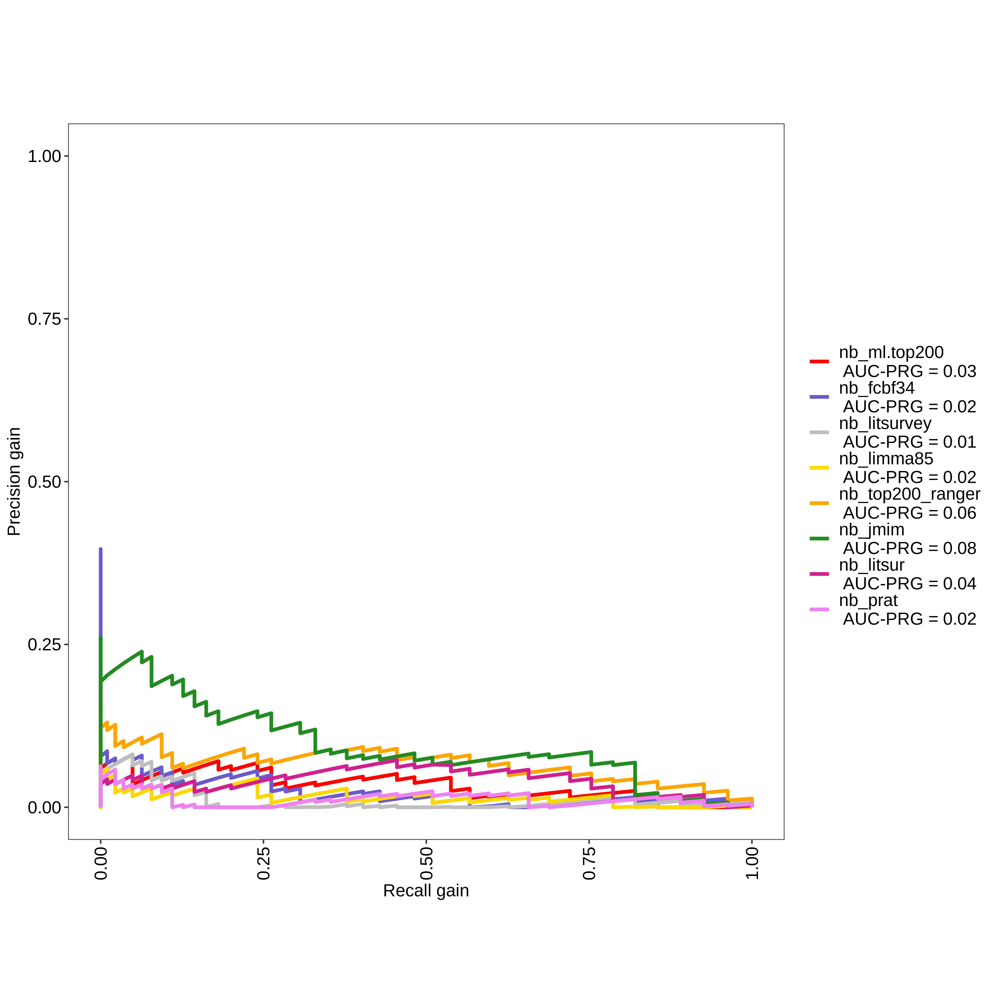

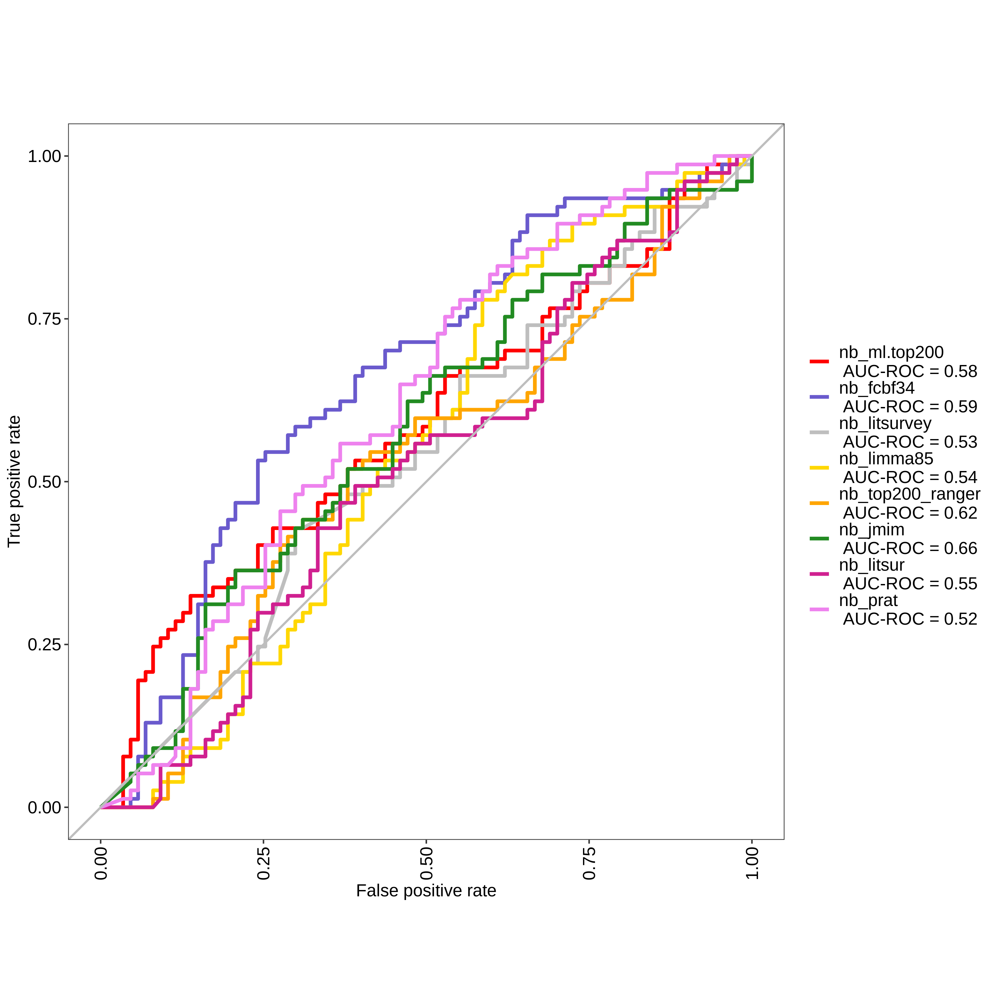

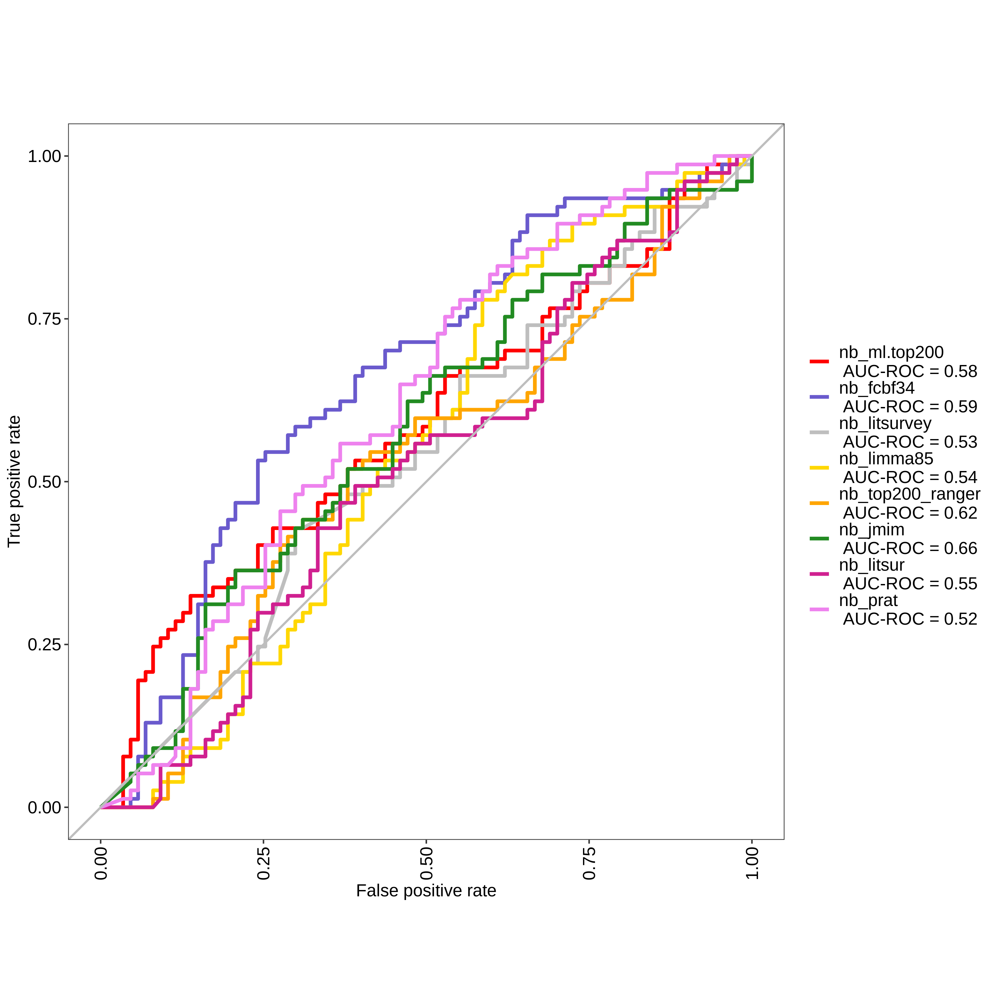

In [62]:
inp_top200_nb <- train(Response ~ ., data=mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_fcbf34_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200var_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_limma85_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_top200_ranger_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_jmim_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

res_nb <- evalm(list(inp_top200_nb, inp_fcbf34_nb, inp_top200var_nb, inp_limma85_nb, inp_top200_ranger_nb, inp_jmim_nb, inp_litsur_nb, inp_prat_nb),
             gnames=c('nb_ml.top200', 'nb_fcbf34', 'nb_litsurvey', 'nb_limma85', 'nb_top200_ranger', 'nb_jmim', 'nb_litsur', 'nb_prat'))
res_nb$roc

ROC-AUC Graphs available at https://github.com/runtime-terror101/ICP-Responders/tree/master/ICP_Responders/ROC_AUC%20analysis

# Comparison

In [ ]:
prat <- read.csv("/home/jp/ICP_Responders/DataCollectionFormatting/MergeTables/Prat.csv", check.names = F)
prat.list <- colnames(prat)[14:ncol(prat)]

In [ ]:
ncol(prat) - 13

In [ ]:
overlap <- length(Reduce(intersect,    list(
#                                             ml.list
#                                             ,fcbf34.list 
#                                             ,top200var.list
#                                             ,limma85.list
#                                             ,ranger.imp200
#                                             ,jmim.list
#                                             ,as.character(genes_lit_rawdata)
#                                             ,prat.list
                                           )))
overlap
# Reduce(intersect, list(ml.list,fcbf34.list))

# head(ml.list)
# head(fcbf34.list) 
# head(top200var.list)
# head(limma85.list)
# head(ranger.imp200)
# head(as.character(genes_lit_rawdata))
# head(prat.list)

 


In [ ]:
length(genes_lit_rawdata)

In [ ]:
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.250 >= 4, "Gene_ID"]))
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"]))
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.150 >= 4, "Gene_ID"]))
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.100 >= 4, "Gene_ID"]))
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.50 >= 4, "Gene_ID"]))
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank[all.rank$Threshold.30 >= 4, "Gene_ID"]))


In [ ]:
length(which(as.character(genes_lit_rawdata) %in% 
             all.rank$Gene_ID))

# Joint mutual information maximisation

In [ ]:
library(praznik)

In [ ]:
m.jmim <- JMIM(mod_inp_mat[, -which(colnames(mod_inp_mat) %in% "Response")], 
               mod_inp_mat$Response, 200)

df.jmim <- data.frame(m.jmim)[order(m.jmim$score, decreasing=TRUE),]
df.jmim
jmim.list <- (rownames(df.jmim))[1:200] 

In [ ]:
inp_top200_jmim <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
                                                        
res_nb <- evalm(list(inp_top200_jmim),
             gnames=c('inp_top200_jmim'))
res_nb$roc

# AUC-ROC for JMIM, Literature Survey, and Prat gene lists

## glmNet

In [ ]:
inp_jmim_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_glm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="glmnet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_glm_2 <- evalm(list(inp_jmim_glm, inp_litsur_glm, inp_prat_glm),
             gnames=c('glm_jmim', 'glm_litsur', 'glm_prat'))
res_glm_2$roc

## SVM

In [ ]:
inp_jmim_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_svm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="svmRadial",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_svm_2 <- evalm(list(inp_jmim_svm, inp_litsur_svm, inp_prat_svm),
             gnames=c('svm_jmim', 'svm_litsur', 'svm_prat'))
res_svm_2$roc

## PCA Neural Network

In [ ]:
inp_jmim_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nnet <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pcaNNet",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_pcannet_2 <- evalm(list(inp_jmim_nnet, inp_litsur_nnet, inp_prat_nnet),
             gnames=c('pcannet_jmim', 'pcannet_litsur', 'pcannet_prat'))
res_pcannet_2$roc

## Gradient Boosting Machines (GBM)

In [ ]:
inp_jmim_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_gbm <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="gbm",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_gbm_2 <- evalm(list(inp_jmim_gbm, inp_litsur_gbm, inp_prat_gbm),
             gnames=c('gbm_jmim', 'gbm_litsur', 'gbm_prat'))
res_gbm_2$roc

## Partial Least Squares

In [ ]:
inp_jmim_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_pls <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="pls",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_pls_2 <- evalm(list(inp_jmim_pls, inp_litsur_pls, inp_prat_pls),
             gnames=c('pls_jmim', 'pls_litsur', 'pls_prat'))
res_pls_2$roc

## Cforest

In [ ]:
inp_jmim_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_litsur_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_crf <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="cforest",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_crf_2 <- evalm(list(inp_jmim_crf, inp_litsur_crf, inp_prat_crf),
             gnames=c('crf_jmim', 'crf_litsur', 'crf_prat'))
res_crf_2$roc

## High Dimensional Discriminant Analysis

In [ ]:
inp_jmim_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_hdda <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="hdda",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_hdda_2 <- evalm(list(inp_jmim_hdda, inp_litsur_hdda, inp_prat_hdda),
             gnames=c('hdda_jmim', 'hdda_litsur', 'hdda_prat'))
res_hdda_2$roc

## Naïve Bayes

In [ ]:
inp_jmim_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))
inp_litsur_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

inp_prat_nb <- train(Response ~ ., data=mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))],
              method="naive_bayes",
              trControl=ctrl,
              metric = "ROC",
              preProcess = c("scale", "center"))

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 300)
res_nb_2 <- evalm(list(inp_jmim_nb, inp_litsur_nb, inp_prat_nb),
             gnames=c('nb_jmim', 'nb_litsur', 'nb_prat'))
res_nb_2$roc

# GBM Model

In [ ]:
control <- trainControl(method="repeatedcv", number=10, repeats=3)

## Merged Rank

In [ ]:
feature.mergedRank <- mod_inp_mat[,c("Response", all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"])]
saveRDS(feature.mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.mergedRank.rds")

gbm_mergedRank <- train(Response~., data=feature.mergedRank, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_mergedRank.rds")

## Variance

In [ ]:
feature.top200var <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", top200var.list))]
saveRDS(feature.top200var, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.top200var.rds")

gbm_top200var <- train(Response~., data=feature.top200var, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_top200var, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_top200var.rds")

## FCBF

In [ ]:
feature.fcbf <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", fcbf34.list))]
saveRDS(feature.fcbf, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.fcbf.rds")

gbm_fcbf <- train(Response~., data=feature.fcbf, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_fcbf, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_fcbf.rds")

## Limma

In [ ]:
feature.limma <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", limma85.list))]
saveRDS(feature.limma, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.limma.rds")

gbm_limma <- train(Response~., data=feature.limma, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_limma, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_limma.rds")

## Random Forest Permutation

In [ ]:
feature.ranger <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", ranger.imp200))]
saveRDS(feature.ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.ranger.rds")

gbm_ranger <- train(Response~., data=feature.ranger, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_ranger.rds")

## Mutual Information

In [ ]:
feature.jmim <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", jmim.list))]
saveRDS(feature.jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.jmim.rds")

gbm_jmim <- train(Response~., data=feature.jmim, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_jmim.rds")

## Literature Survey

In [ ]:
feature.litSur <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", as.character(genes_lit_rawdata)))]
saveRDS(feature.litSur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.litSur.rds")

gbm_litSur <- train(Response~., data=feature.litSur, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_litSur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_litSur.rds")

## Prat et al.

In [ ]:
feature.prat <- mod_inp_mat[,which(colnames(mod_inp_mat) %in% c("Response", prat.list))]
saveRDS(feature.prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/feature.prat.rds")

gbm_prat <- train(Response~., data=feature.prat, 
                  method="gbm", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(gbm_prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/gbm_prat.rds")

# Cforest Model

## Merged Rank

In [ ]:
cforest_mergedRank <- train(Response~., data=feature.mergedRank, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_mergedRank.rds")

## Variance

In [ ]:
cforest_top200var <- train(Response~., data=feature.top200var, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_top200var, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_top200var.rds")

## FCBF

In [ ]:
cforest_fcbf <- train(Response~., data=feature.fcbf, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_fcbf, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_fcbf.rds")

## Limma

In [ ]:
cforest_limma <- train(Response~., data=feature.limma, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_limma, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_limma.rds")

## Random Forest Permutation

In [ ]:
cforest_ranger <- train(Response~., data=feature.ranger, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_ranger.rds")

## Mutual Information

In [ ]:
cforest_jmim <- train(Response~., data=feature.jmim, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_jmim.rds")

## Literature Survey

In [ ]:
cforest_litSur <- train(Response~., data=feature.litSur, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_litSur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_litSur.rds")

## Prat et al.

In [ ]:
cforest_prat <- train(Response~., data=feature.prat, 
                  method="cforest", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(cforest_prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/cforest_prat.rds")

# Naive Bayes Model

## Merged Rank

In [ ]:
nb_mergedRank <- train(Response~., data=feature.mergedRank, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_mergedRank, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_mergedRank.rds")

## Variance

In [ ]:
nb_top200var <- train(Response~., data=feature.top200var, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_top200var, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_top200var.rds")

## FCBF

In [ ]:
nb_fcbf <- train(Response~., data=feature.fcbf, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_fcbf, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_fcbf.rds")

## Limma

In [ ]:
nb_limma <- train(Response~., data=feature.limma, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_limma, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_limma.rds")

## Random Forest Permutation

In [ ]:
nb_ranger <- train(Response~., data=feature.ranger, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_ranger, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_ranger.rds")

## Mutual Information

In [ ]:
nb_jmim <- train(Response~., data=feature.jmim, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_jmim, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_jmim.rds")

## Literature Survey

In [ ]:
nb_litSur <- train(Response~., data=feature.litSur, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_litSur, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_litSur.rds")

## Prat et al.

In [ ]:
nb_prat <- train(Response~., data=feature.prat, 
                  method="naive_bayes", 
                  trControl=control,
                  preProcess = c("scale", "center"))
saveRDS(nb_prat, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/Model testing/SavedModels/nb_prat.rds")

# Output RDS

In [ ]:
mergedRank.list <- all.rank[all.rank$Threshold.200 >= 4, "Gene_ID"]

In [ ]:
saveRDS(jmim.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/jmim.list.rds")
saveRDS(as.character(genes_lit_rawdata), "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/litsur.list.rds")
saveRDS(prat.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/prat.list.rds")
saveRDS(mergedRank.list, "/home/jp/ICP_Responders/ML/GideHugoRiaz_AntiPD1/Pre-processingFeatureSelection/mergedrank.list.rds")

In [ ]:
save.image("SavedGeneExpression.Rda")

In [ ]:
# #parameter tuning
# modelLookup('lvq')
# # design the parameter tuning grid
# grid <- expand.grid(size=c(5,10,20,50), k=c(1,2,3,4,5))
# # train the model
# model <- train(Species~., data=iris, method="lvq", trControl=control, tuneGrid=grid)

In [ ]:
# saveRds(tmp, "tmp.rds")
# # load by giving path
# # tmp <- readRds("path")
# # R
